José María Martínez Marín 100443343

Azamat Ziiatdinov 100460540

---



In [ ]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
from IPython.core.display import Image, display

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from scipy.stats import expon

# Lab: Kernel Methods for understanding data


------------------------------------------------------
*Machine Learning. Master in Big Data Analytics*

*Emilio Parrado Hernández eparrado@ing.uc3m.es*

------------------------------------------------------


In this lab session we will explore the scikit learn implementations of some of the multivariate analysis methods and of the One Class Support Vector Machine discussed during the lecture

In [ ]:
from matplotlib import offsetbox

# Scale and visualize the embedding vectors
def plot_embedding(ax,X, digits, xlabel='First CP',ylabel='Second CP'):
    x_min, x_max = np.min(X, 0), np.max(X, 0)
    #X = (X - x_min) / (x_max - x_min)
  
    
    ax.scatter(X[:, 0], X[:, 1])
    # Add some example images
    if hasattr(offsetbox, 'AnnotationBbox'):
        # only print thumbnails with matplotlib > 1.0
        shown_images = np.array([[1., 1.]])  # just something big
        for i in range(X.shape[0]):
            dist = np.sum((X[i] - shown_images) ** 2, 1)
            if np.min(dist) < 4e-3:
                # don't show points that are too close
                continue
            shown_images = np.r_[shown_images, [X[i]]]
            imagebox = offsetbox.AnnotationBbox(
                offsetbox.OffsetImage(digits[i,:].reshape(28,28), cmap=plt.cm.gray_r),
                X[i])
            ax.add_artist(imagebox)
    ax.set_xticks([]), ax.set_yticks([])
    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)



# MNIST dataset

We will also use the MNIST dataset, which consists of greyscale handwritten digits. Each image is 28x28 pixels. The following cell loads some of these data.

In [ ]:

from google.colab import files
uploaded = files.upload()


Saving mnist_test.csv to mnist_test.csv
Saving sales.txt to sales.txt


In [ ]:
data = np.loadtxt("mnist_test.csv", 
                       delimiter=",") 
fac = 0.99 / 255
X=np.asfarray(data[:, 1:]) * fac + 0.01
Y = np.array([int(cc) for cc in data[:, :1]])
print("Loaded {0:d} digits".format(X.shape[0]))
print("")
for cc in range(10):
    print("Digit {0:d} has {1:d} examples".format(cc,np.sum(Y==cc)))

Loaded 10000 digits

Digit 0 has 980 examples
Digit 1 has 1135 examples
Digit 2 has 1032 examples
Digit 3 has 1010 examples
Digit 4 has 982 examples
Digit 5 has 892 examples
Digit 6 has 958 examples
Digit 7 has 1028 examples
Digit 8 has 974 examples
Digit 9 has 1009 examples


# 1. Principal Component Analysis

## 1.1 Searching for the direction of projection that maximizes the variance

In the following example you will compute the variance along several directions of projection (given by the red arrows in the plot and ). 

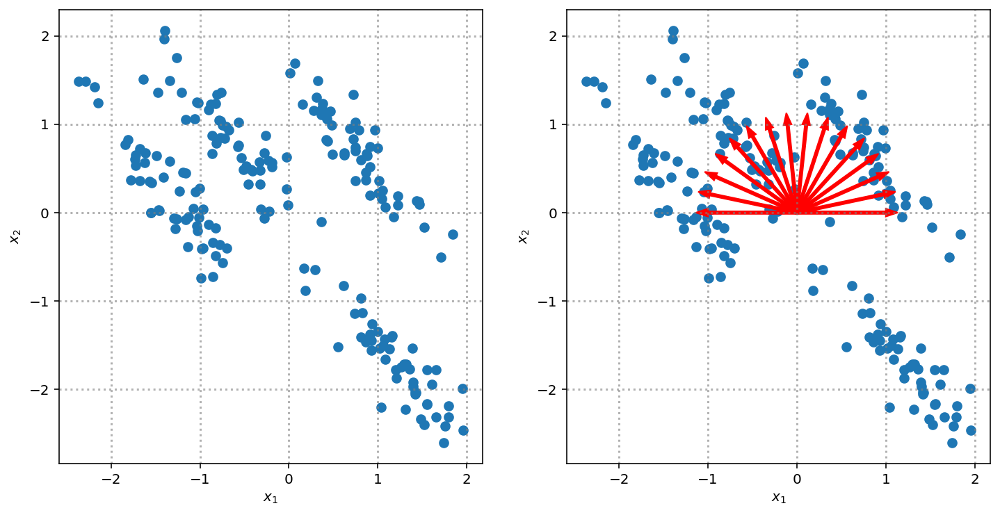

In [ ]:
# Data generation
from sklearn.datasets import make_blobs

XX, y_true = make_blobs(n_samples=200, centers=4,
                       cluster_std=0.60, random_state=0)

rng = np.random.RandomState(13)
X_stretched = np.dot(XX, rng.randn(2, 2))

X_stretched -= np.mean(X_stretched,0)

fig, ax = plt.subplots(1,2,figsize=(12, 6))
ax[0].scatter(X_stretched[:, 0], X_stretched[:, 1],  s=40)
ax[0].set_xlabel('$x_1$')
ax[0].set_ylabel('$x_2$')
ax[0].grid(b=True, which='major', color='gray', alpha=0.6, linestyle='dotted', lw=1.5)

# generate directions to explore, uniformly distributed in [0, pi]
v_angle = np.linspace(0,np.pi,16)

ax[1].scatter(X_stretched[:, 0], X_stretched[:, 1],  s=40)
ax[1].set_xlabel('$x_1$')
ax[1].set_ylabel('$x_2$')
ax[1].grid(b=True, which='major', color='gray', alpha=0.6, linestyle='dotted', lw=1.5)

for alfa in v_angle:
    ax[1].arrow(0,0,np.cos(alfa), np.sin(alfa),color='red', shape='full',width=.03)

## 1.1.1.- Compute the variance contained in the dataset

Write code in the next cell to print the variance along each of the 2 dimensions of the data and the total variance contained in the data set as the sum of these two variances.

In [ ]:

############
# YOUR CODE
############


for ii in range(2):
  print("Variance along dimension x_{1:d}: {0:.2f}".format(np.var(X_stretched[:,ii]), ii+1))
print("Total variance: {0:.2f}".format(np.var(X_stretched[:,0])+np.var(X_stretched[:,1])))

Variance along dimension x_1: 1.26
Variance along dimension x_2: 1.28
Total variance: 2.54


## 1.1.2.- Brute Force determination of the direction of maximum variance

Complete the code in the next cell to:
1. determine the vector $\mathbf w$ along which the data is projected. These vectors are the red arrows in the previous plot. They have unit norm, their origin is in (0,0) and `v_angle` contains their angle with the $x$ axis.

2. project each data point in `X_stretched` along the corresponding direction given by $\mathbf w$

3. compute a matrix `Z` where each row is $\mathbf w$ scaled by the value of the projection of the corresponding row in `X_stretched` along $\mathbf w$

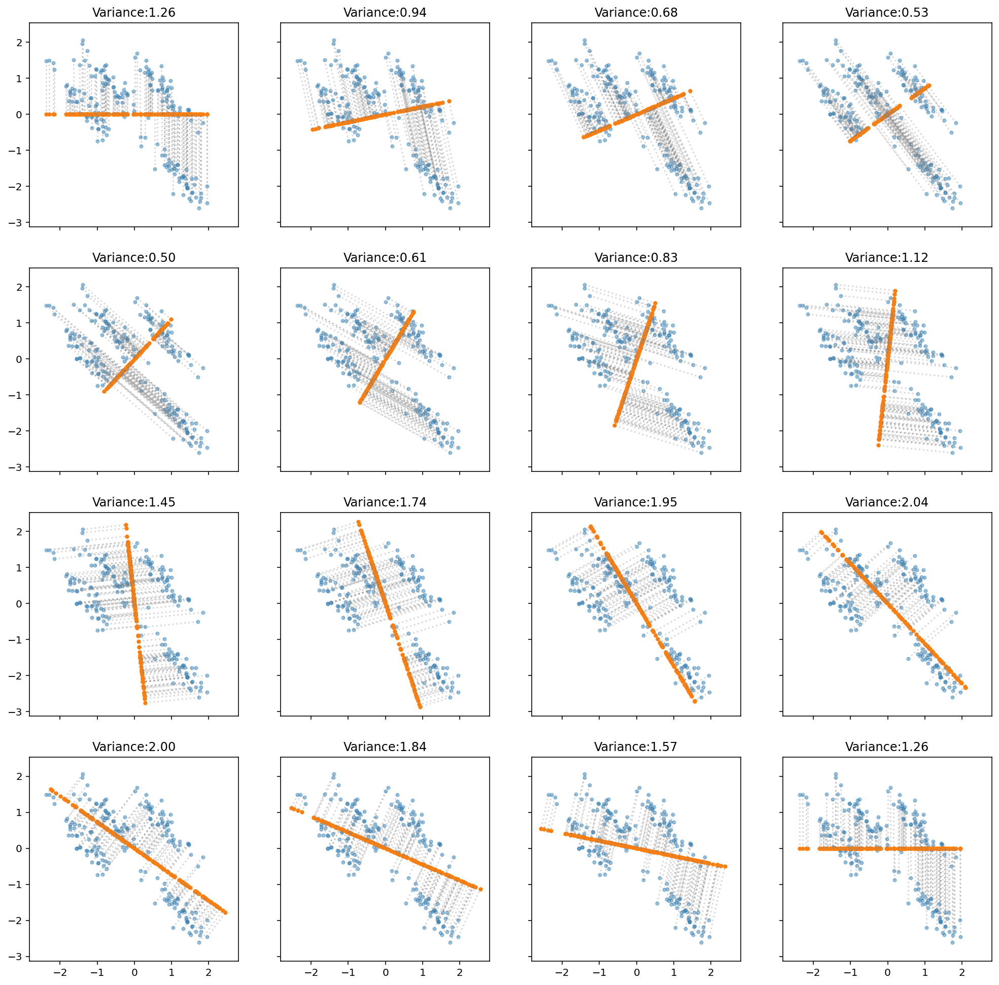

In [ ]:
nrows=4
ncols =4
ff,aa = plt.subplots(nrows, ncols, sharex=True, sharey=True, figsize=(17,17))
kk=0
variances = np.empty(len(v_angle))
for rr in range(nrows):
    for cc in range(ncols):
        ax = aa[rr][cc]
        ax.scatter(X_stretched[:, 0], X_stretched[:, 1], marker='.', s=40, alpha=0.4)
        
        ############
        # YOUR CODE
        ############
        
        w = np.array([np.cos(v_angle[kk]), np.sin(v_angle[kk])])
        proj = X_stretched.dot(w)
        Z = np.outer(proj,w)

        ax.scatter(Z[:, 0], Z[:, 1], marker='.',  s=40)
        
        for jj in range(Z.shape[0]):
            ax.plot([X_stretched[jj,0], Z[jj,0]],
                     [X_stretched[jj,1], Z[jj,1]],
                      linestyle=':',
                      alpha=0.3, color='gray')
        variances[kk] = np.var(proj)
        kk+=1
        ax.set_title('Variance:{0:.2f}'.format(np.var(proj)))

- **Which is the direction that captures the largest amount of the total variance?** 

- **How much is this variance compared with the total variance?**

The largest amount of the total variance is captured along the 12th direction, with a value of 2.04, a 10% of the total variance, in contrast to the second largest, which is the 13th one, with a variance of 2.00 . More or less, half of the directions have a variance greater or equal to 1, but few of them have it above 1.60 (only 5 of them)

# 1.2 PCA determination of the direction of maximum variance

Scikit learn class `sklearn.decomposition.PCA` implements PCA. The key argument is `n_components`.

In [ ]:
from sklearn.decomposition import PCA

In [ ]:
pca1 = PCA(n_components=2).fit(X_stretched)

The next cell plots the 2 Principal Components of the data, each scaled by the variance it captures.

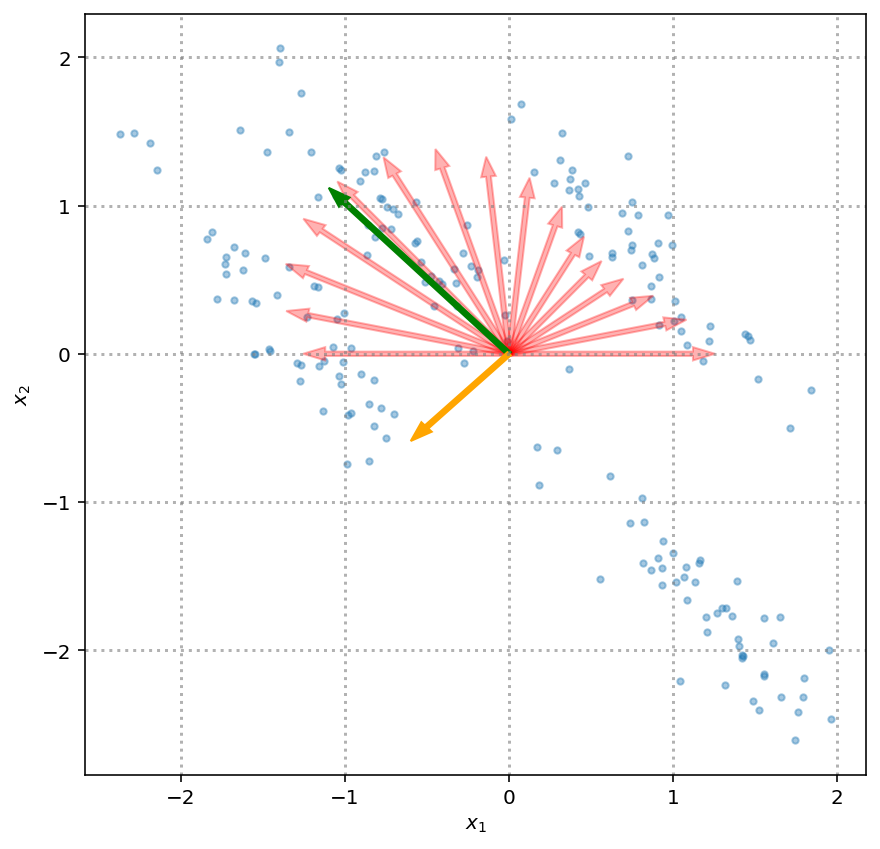

In [ ]:
fig, ax = plt.subplots(figsize=(7, 7))
ax.scatter(X_stretched[:, 0], X_stretched[:, 1], marker='.', alpha=0.4,  s=40)
ax.set_xlabel('$x_1$')
ax.set_ylabel('$x_2$')
ax.grid(b=True, which='major', color='gray', alpha=0.6, linestyle='dotted', lw=1.5)


for kk,alfa in enumerate(v_angle):
    ax.arrow(0,0,np.sqrt(variances[kk])*np.cos(alfa), np.sqrt(variances[kk])*np.sin(alfa),color='red', shape='full',width=.03, alpha=0.3)
ax.arrow(0,0,-np.sqrt(pca1.explained_variance_[0])*pca1.components_[0,0],
         -np.sqrt(pca1.explained_variance_[0])*pca1.components_[0,1],color='green', 
         shape='full',width=.03,
        label='1st PC')
ax.arrow(0,0,-np.sqrt(pca1.explained_variance_[1])*pca1.components_[1,0],
         -np.sqrt(pca1.explained_variance_[1])*pca1.components_[1,1],color='orange', shape='full',width=.03,
         label='2nd PC')


The method `transform` can be used to get the coordinates of the data in the new vector base defined by the principal components. Also, the property `explained_variance_` gives the amount of the total variance captured by each component.

Write code in the next cell that prints the variance captured by each component and draws a scatter plot of the transformed data (with the coordiantes in the new vector base).

The 1 Principal Component explains a variance of 2.06
The 2 Principal Component explains a variance of 0.50


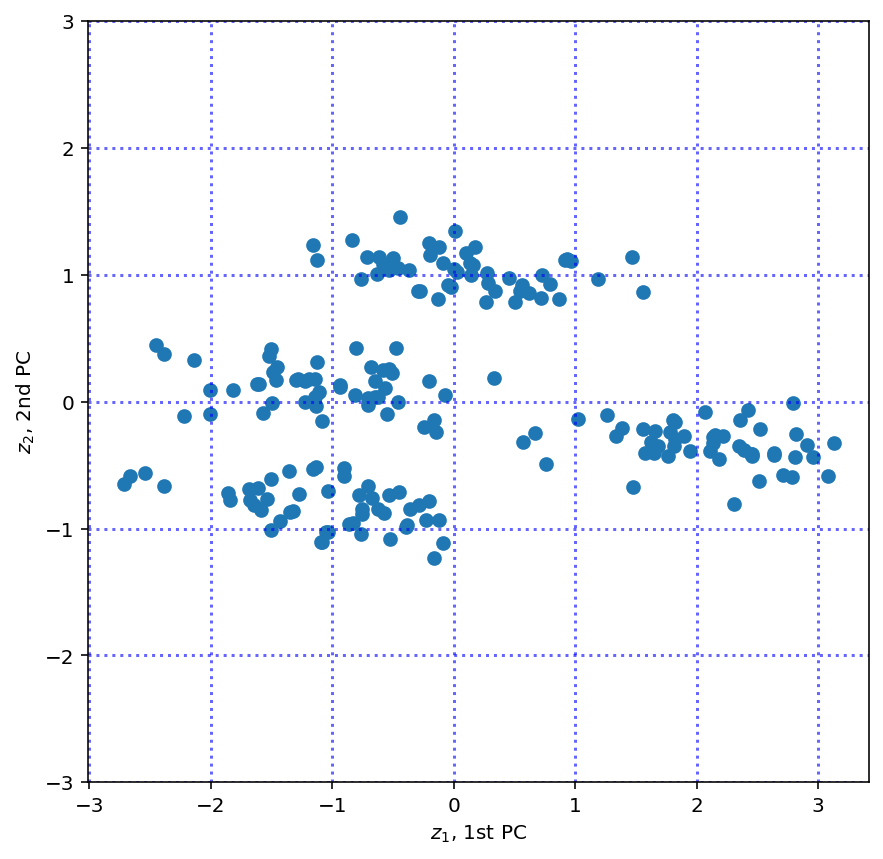

In [ ]:
############
# YOUR CODE
############

fig, ax = plt.subplots(figsize=(7,7))
Z = pca1.transform(X_stretched)
ax.scatter(Z[:,0], Z[:,1], s=40)
ax.set_xlabel('$z_1$, 1st PC')
ax.set_ylabel('$z_2$, 2nd PC')
ax.grid(b=True, which='major', color='blue', alpha=0.6, linestyle='dotted', lw=1.5)
_=ax.set_ylim(-3,3)

for ii in range(2):
  print("The {0:d} Principal Component explains a variance of {1:.2f}".format(ii+1,pca1.explained_variance_[ii]))



**How do data represented in the new base look like?**

In this new plot, the first two Principal Components can be seen, the first one in the horizontal axis, while the second one along the vertical axis. The original data has been rotated to be represented by these two components, and it can be seen that the proportion of variance captured by the first principal component is far higher than the one captured by the second one (4 times bigger).

## 1.3 PCA with the set of digits

The code in the next cell computes a PCA of 2 components with a set of 100 instances of digit 5. 

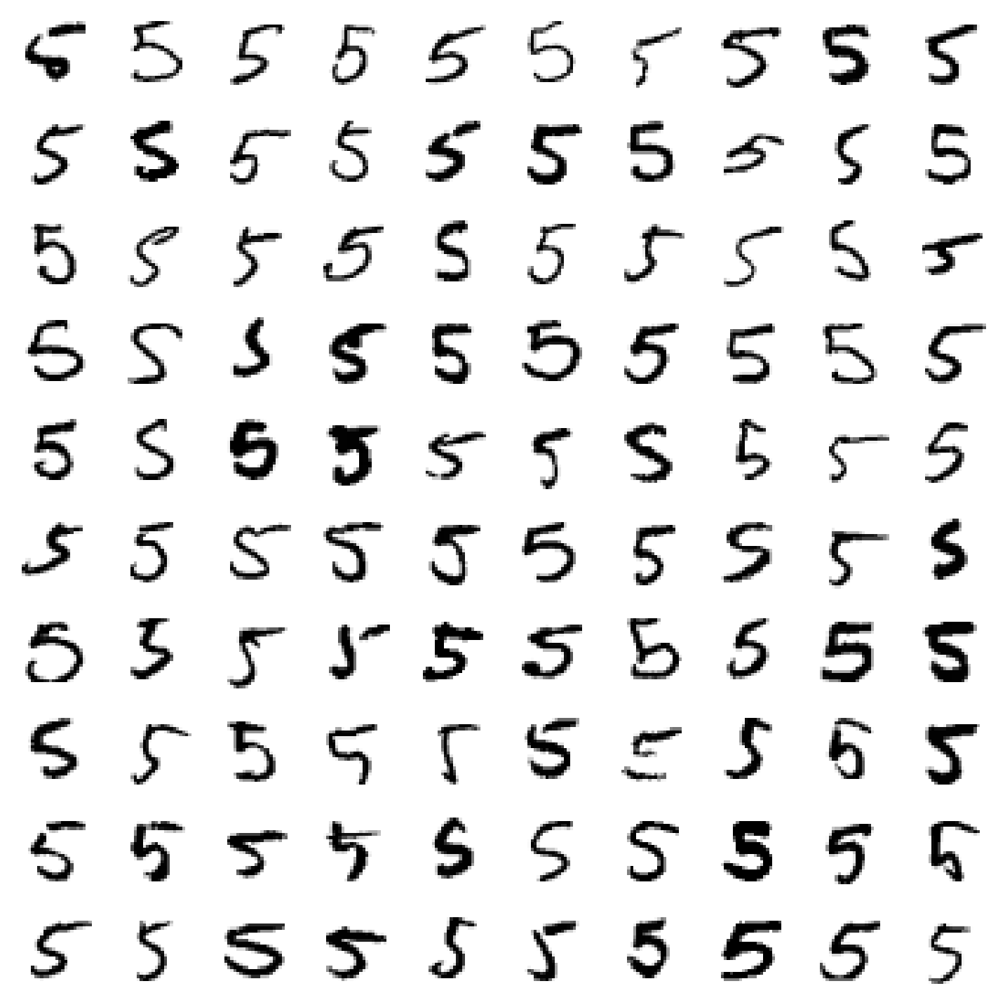

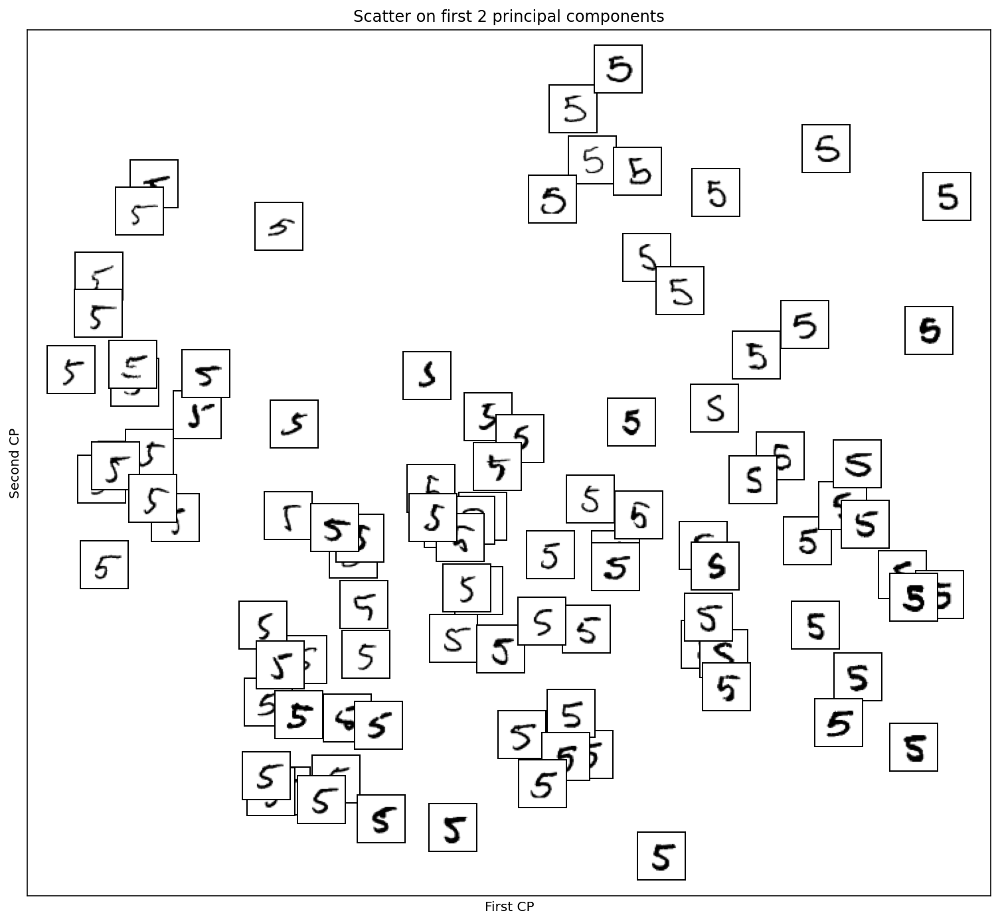

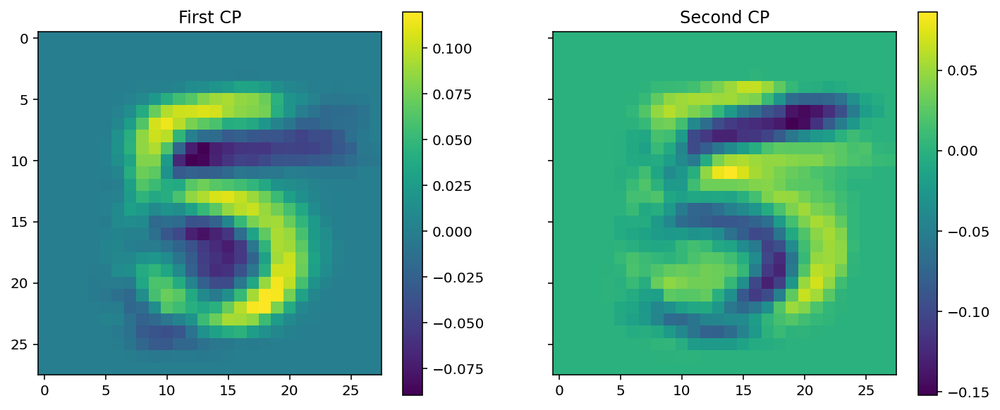

In [ ]:
fives = np.where(Y==5)[0]

# plot 100 5s
nrows = 10
ncols = 10
ff,aa = plt.subplots(nrows, ncols,figsize=(10,10))
ii = 0
for rr in range(nrows):
    for cc in range(ncols):
        aa[rr][cc].set_axis_off()
        aa[rr][cc].imshow(X[fives[ii]].reshape(28,28), 
                          cmap=plt.cm.gray_r, 
                          interpolation='nearest')
        ii += 1
ff.tight_layout()    
X5 = X[fives,:]

# Plot two first PCA dimensions
ff,ax=plt.subplots(1,1,figsize=(13,12))
pca5 = PCA(n_components=2)
Z5 = pca5.fit_transform(X5[:100,:])
plot_embedding(ax,Z5, X5[:100,:])
ax.set_title('Scatter on first 2 principal components')


# show the actual principal components
ff,aa = plt.subplots(1,2,sharex=True, sharey=True, figsize=(12,5))
vv=aa[0].imshow(pca5.components_[0,:].reshape(28,28),interpolation='nearest')
aa[0].set_title('First CP')
ff.colorbar(vv,ax=aa[0])
vv=aa[1].imshow(pca5.components_[1,:].reshape(28,28),interpolation='nearest')
aa[1].set_title('Second CP')
_=ff.colorbar(vv,ax=aa[1])

Now perform the same analysis with the following sets:
- 50 instances of digit 5 and 50 instances of digit 6
- 50 instances of digit 5 and 50 instances of digit 1
- 10 instances of each digit

There are 958 sixes in the dataset


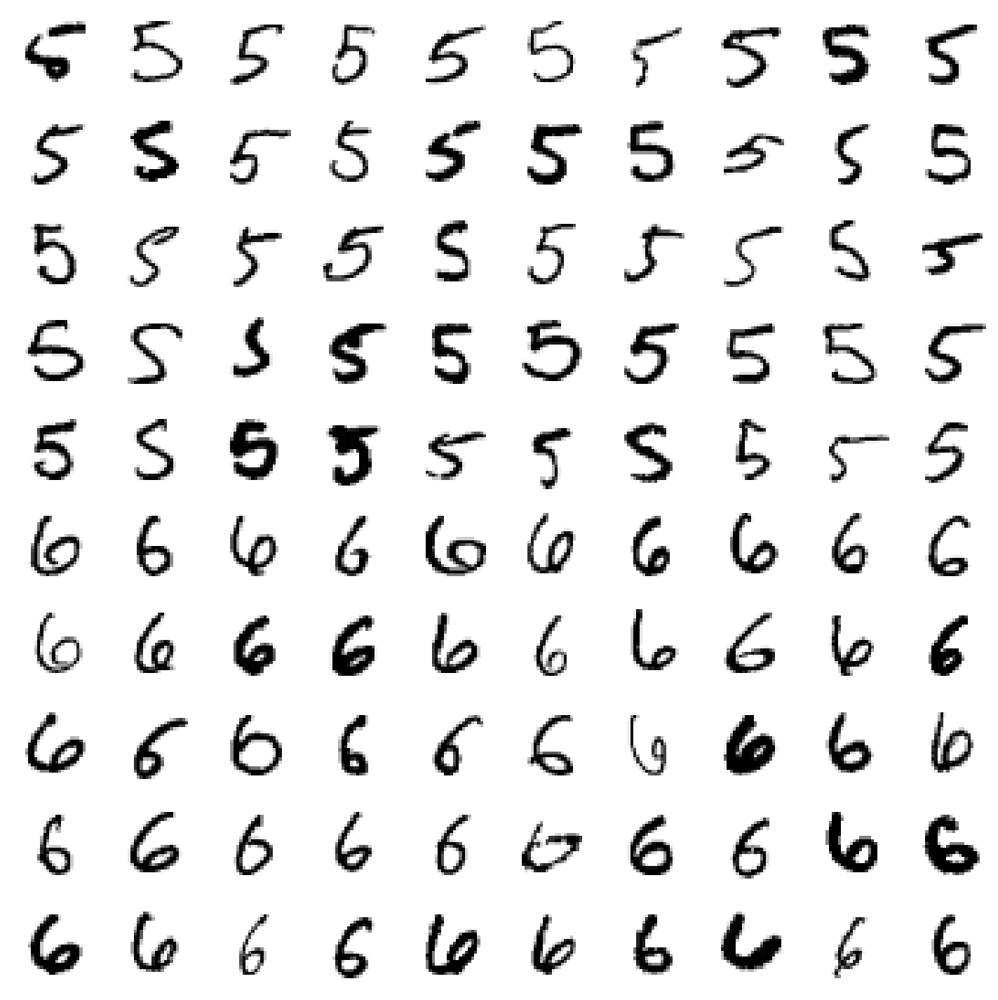

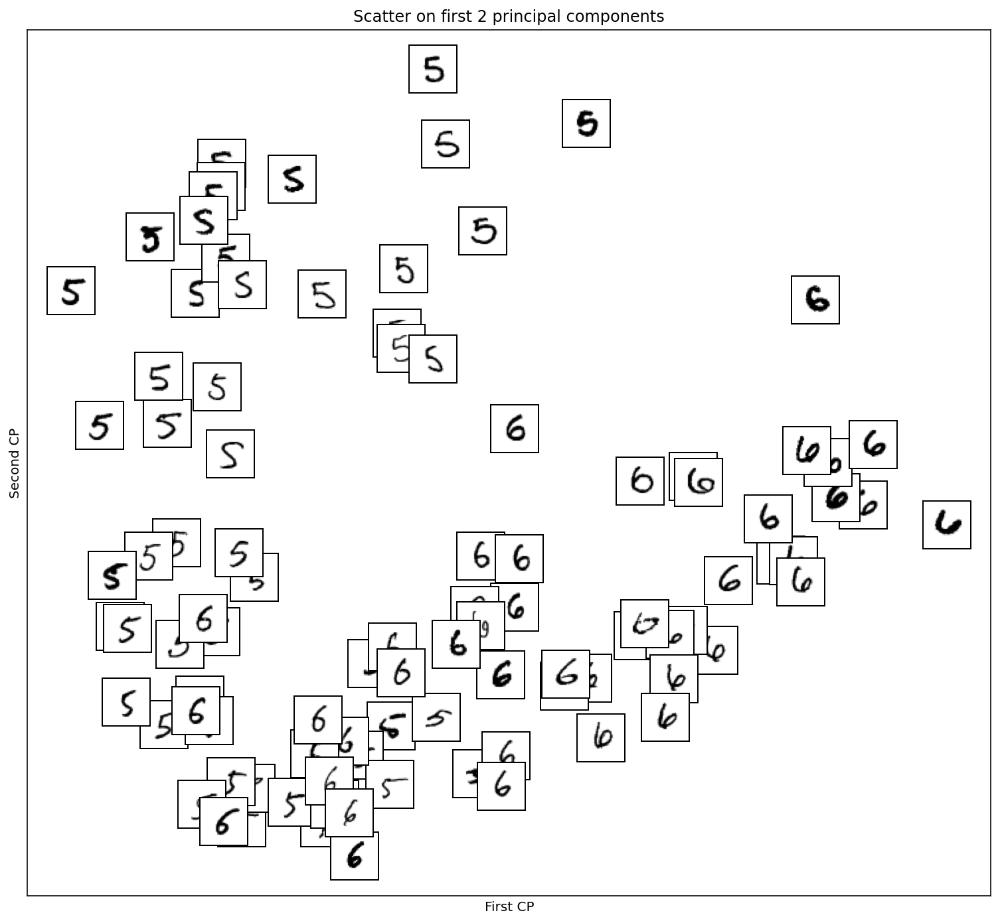

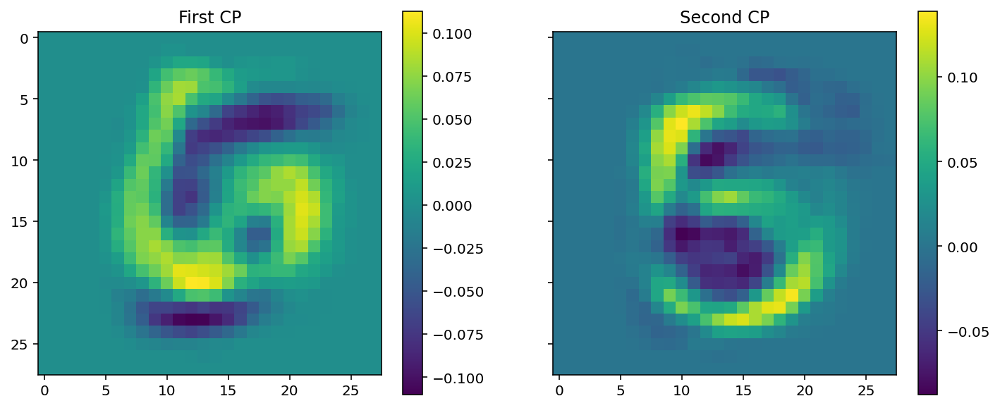

In [ ]:
############
# YOUR CODE

############

six = np.where(Y==6)[0]
print("There are {0:d} sixes in the dataset".format(len(six)))
five_six  = np.hstack((fives[:50], six[:50]))
X5_6 = X[five_six,:]

nrows = 10
ncols = 10
ff,aa = plt.subplots(nrows, ncols,figsize=(10,10))
ii = 0
for rr in range(nrows):
    for cc in range(ncols):
        aa[rr][cc].set_axis_off()
        aa[rr][cc].imshow(X[five_six[ii]].reshape(28,28), 
                          cmap=plt.cm.gray_r, 
                          interpolation='nearest')
        ii += 1
ff.tight_layout()    

# Plot two first PCA dimensions
ff,ax=plt.subplots(1,1,figsize=(13,12))
pca5_6 = PCA(n_components=2)
Z5_6 = pca5_6.fit_transform(X5_6[:100,:])
plot_embedding(ax,Z5_6, X5_6[:100,:])
ax.set_title('Scatter on first 2 principal components')

ff,aa = plt.subplots(1,2,sharex=True, sharey=True, figsize=(12,5))
vv=aa[0].imshow(pca5_6.components_[0,:].reshape(28,28),interpolation='nearest')
aa[0].set_title('First CP')
ff.colorbar(vv,ax=aa[0])
vv=aa[1].imshow(pca5_6.components_[1,:].reshape(28,28),interpolation='nearest')
aa[1].set_title('Second CP')
_=ff.colorbar(vv,ax=aa[1])

There are 1135 ones in the dataset


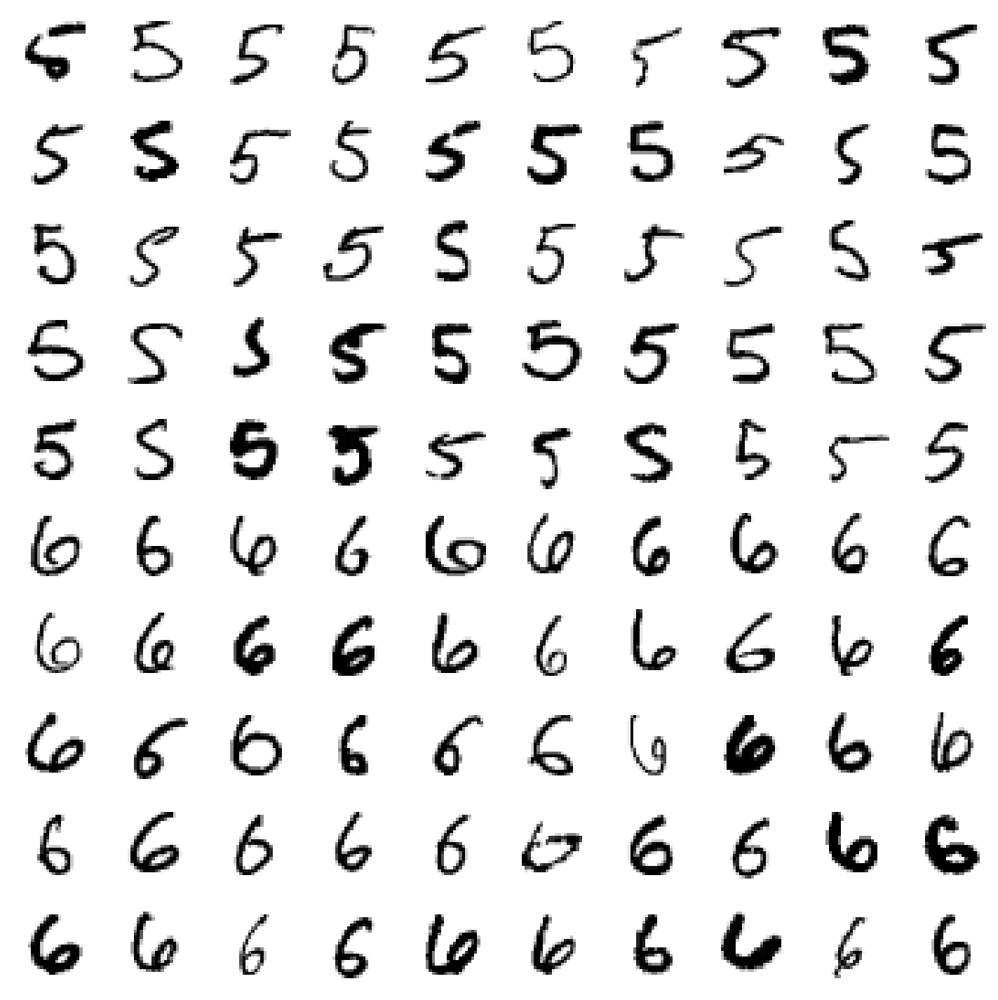

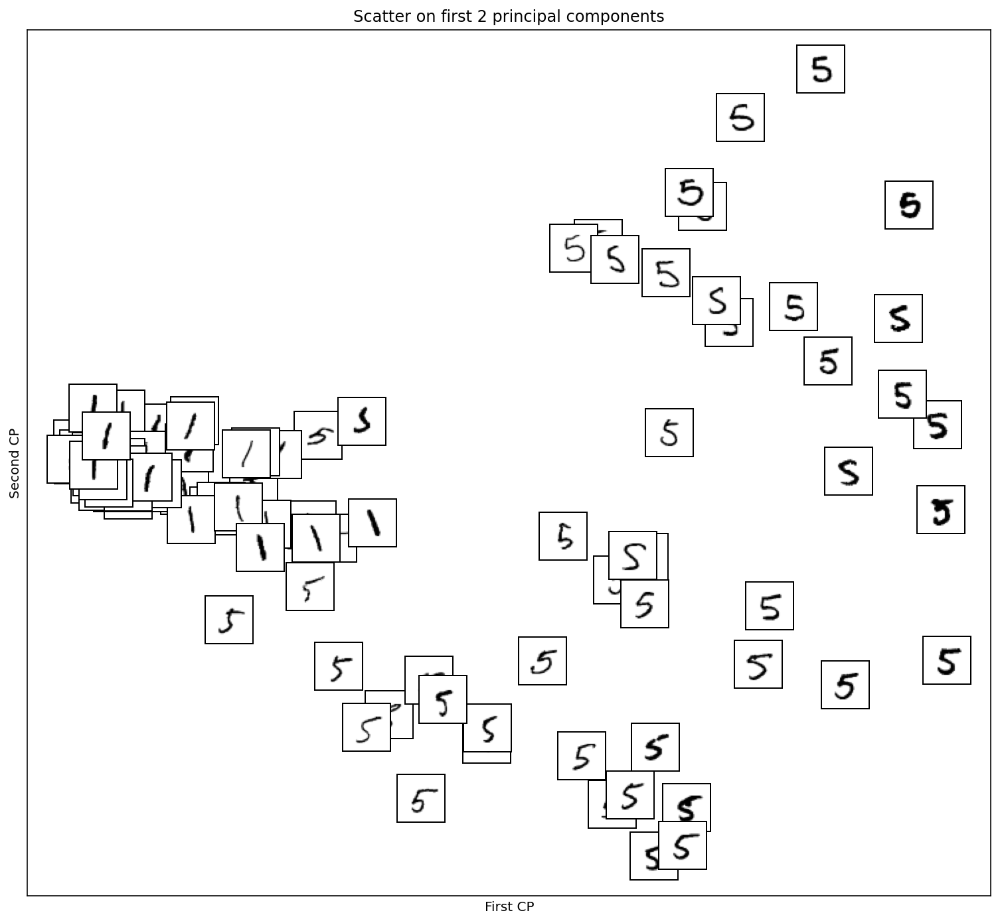

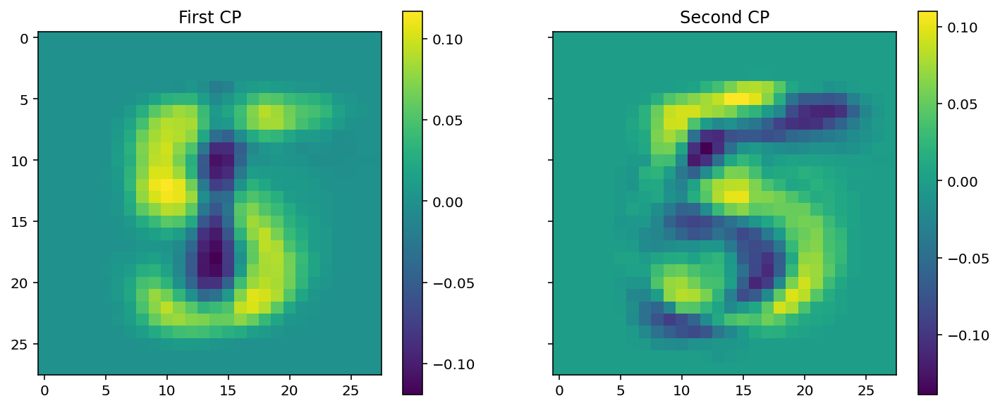

In [ ]:
############
# YOUR CODE
############

one = np.where(Y==1)[0]
print("There are {0:d} ones in the dataset".format(len(one)))
five_one  = np.hstack((fives[:50], one[:50]))
X5_1 = X[five_one,:]

nrows = 10
ncols = 10
ff,aa = plt.subplots(nrows, ncols,figsize=(10,10))
ii = 0
for rr in range(nrows):
    for cc in range(ncols):
        aa[rr][cc].set_axis_off()
        aa[rr][cc].imshow(X[five_six[ii]].reshape(28,28), 
                          cmap=plt.cm.gray_r, 
                          interpolation='nearest')
        ii += 1
ff.tight_layout()    

# Plot two first PCA dimensions
ff,ax=plt.subplots(1,1,figsize=(13,12))
pca5_1 = PCA(n_components=2)
Z5_1 = pca5_1.fit_transform(X5_1[:100,:])
plot_embedding(ax,Z5_1, X5_1[:100,:])
ax.set_title('Scatter on first 2 principal components')

ff,aa = plt.subplots(1,2,sharex=True, sharey=True, figsize=(12,5))
vv=aa[0].imshow(pca5_1.components_[0,:].reshape(28,28),interpolation='nearest')
aa[0].set_title('First CP')
ff.colorbar(vv,ax=aa[0])
vv=aa[1].imshow(pca5_1.components_[1,:].reshape(28,28),interpolation='nearest')
aa[1].set_title('Second CP')
_=ff.colorbar(vv,ax=aa[1])

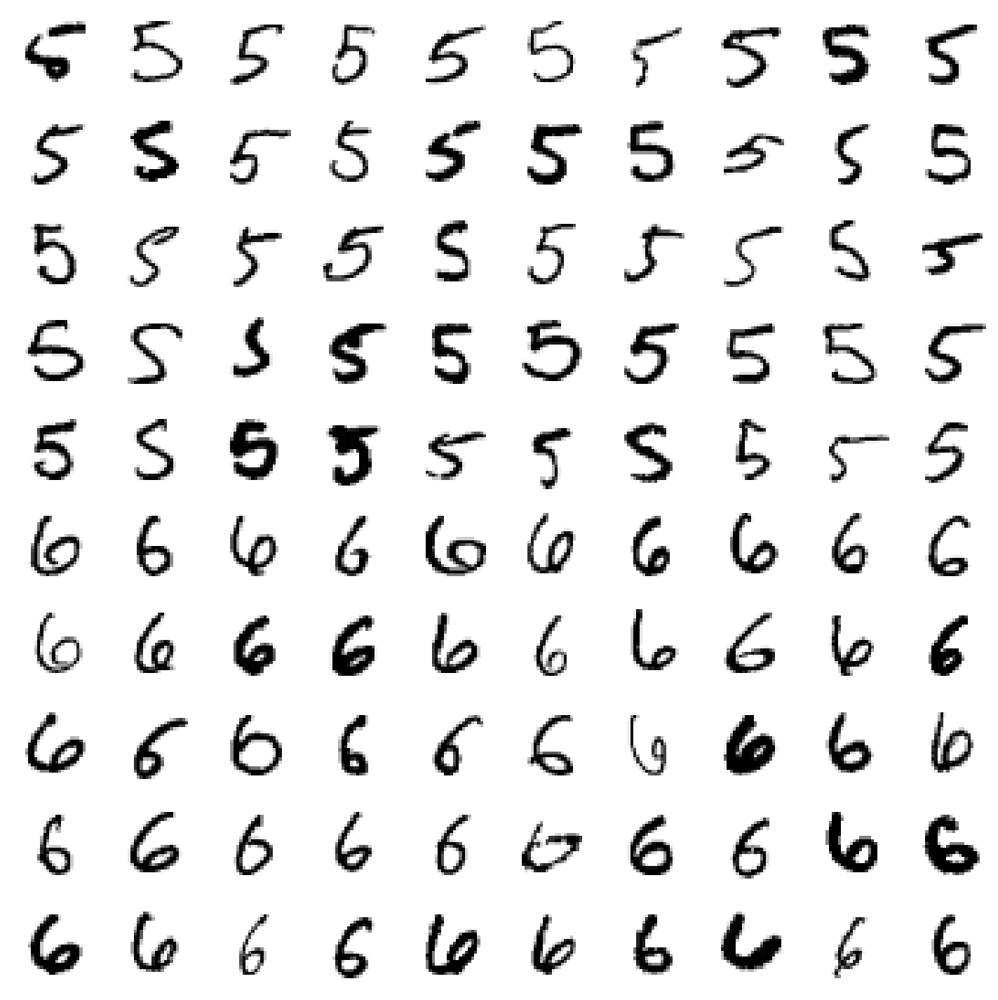

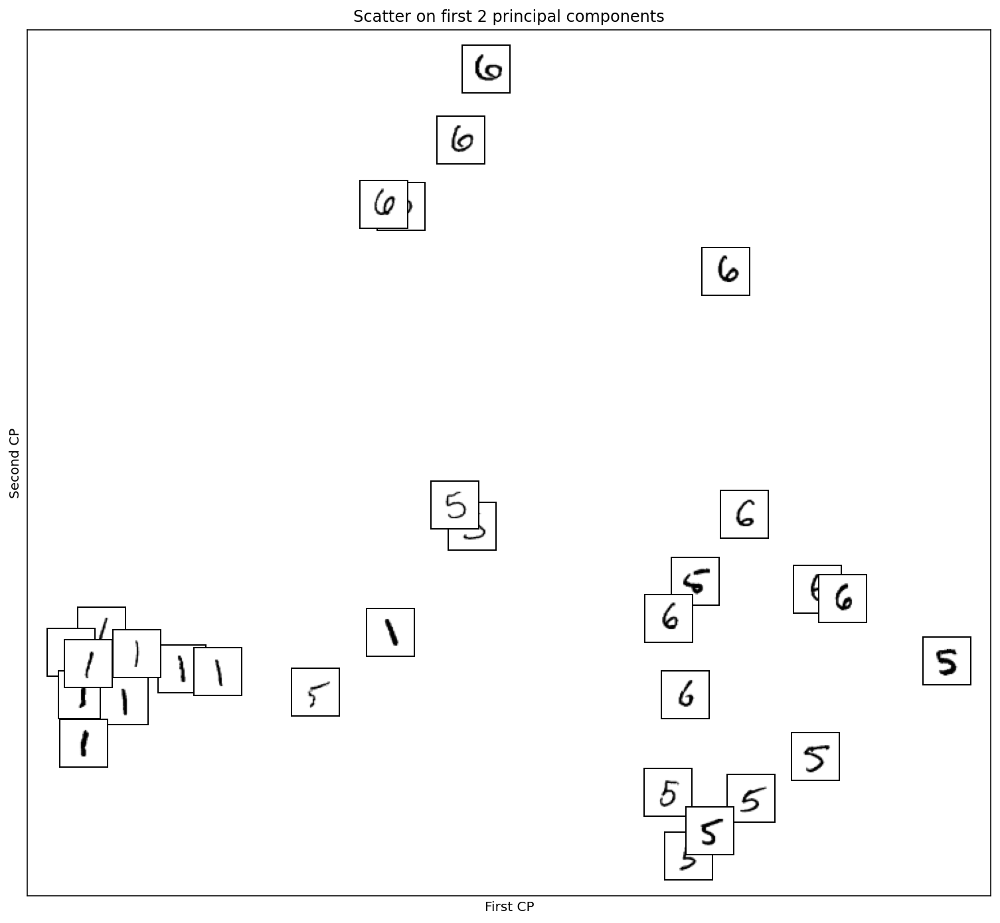

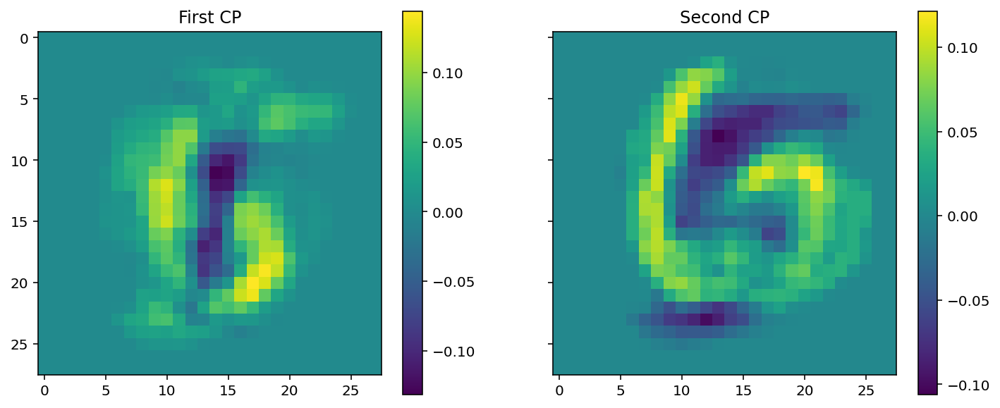

In [ ]:
#YOUR CODE HERE

five_one_six  = np.hstack((fives[:10], one[:10], six[:10]))
X5_1_6 = X[five_one_six,:]

nrows = 10
ncols = 10
ff,aa = plt.subplots(nrows, ncols,figsize=(10,10))
ii = 0
for rr in range(nrows):
    for cc in range(ncols):
        aa[rr][cc].set_axis_off()
        aa[rr][cc].imshow(X[five_six[ii]].reshape(28,28), 
                          cmap=plt.cm.gray_r, 
                          interpolation='nearest')
        ii += 1
ff.tight_layout()    

# Plot two first PCA dimensions
ff,ax=plt.subplots(1,1,figsize=(13,12))
pca5_1_6 = PCA(n_components=2)
Z5_1_6 = pca5_1_6.fit_transform(X5_1_6[:30,:])
plot_embedding(ax,Z5_1_6, X5_1_6[:30,:])
ax.set_title('Scatter on first 2 principal components')

ff,aa = plt.subplots(1,2,sharex=True, sharey=True, figsize=(12,5))
vv=aa[0].imshow(pca5_1_6.components_[0,:].reshape(28,28),interpolation='nearest')
aa[0].set_title('First CP')
ff.colorbar(vv,ax=aa[0])
vv=aa[1].imshow(pca5_1_6.components_[1,:].reshape(28,28),interpolation='nearest')
aa[1].set_title('Second CP')
_=ff.colorbar(vv,ax=aa[1])

## 1.4.- PCA minimizes the reconstruction error

The code in the next cell displays how some examples look after being reconstructed with a number of principal components (shown in the title of each subplot). Complete the code to compute the reconstruction of each digit from the corresponding number of principal components.

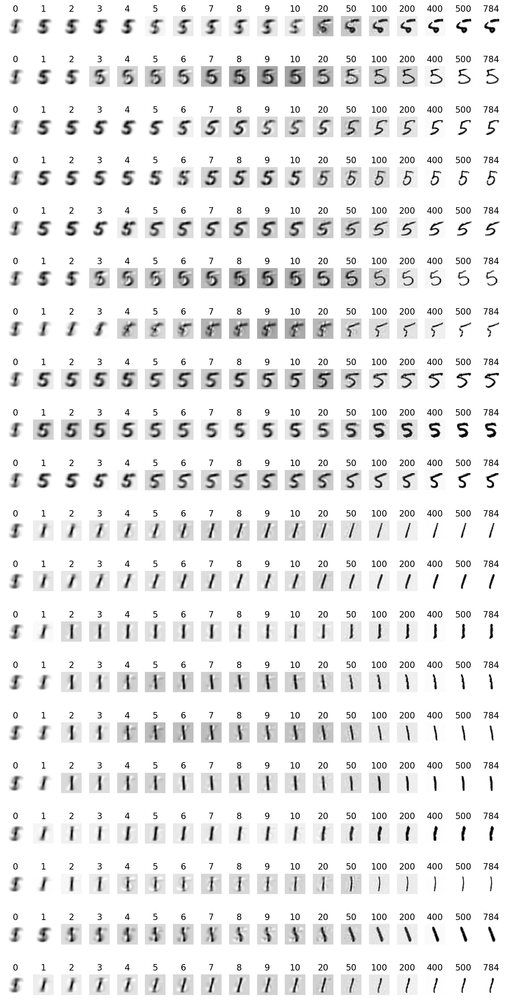

In [ ]:
ones = np.where(Y==1)[0]
fives_ones_s = np.hstack((fives[:10], ones[:10]))
fives_ones = np.hstack((fives, ones))

ncols=18
nrows = 20
ff,aa = plt.subplots(nrows, ncols,figsize=(10,20))

mx51 = np.mean(X[fives_ones,:],0)
pca51 = PCA(n_components = 784).fit(X[fives_ones,:])
Z51 = pca51.transform(X[fives_ones_s,:])

icc = 0
for rr in range(nrows):
    aa[rr][icc].set_axis_off()
    aa[rr][icc].imshow((mx51).reshape(28,28), 
                          cmap=plt.cm.gray_r, 
                          interpolation='nearest')   
    aa[rr][icc].set_title(repr(0))
for icc,cc in enumerate([1,2,3,4,5,6,7,8,9,10,20,50,100,200,400,500,784]):
    
    ############
    # YOUR CODE
    ############
    Xtilde = Z51[:,:cc].dot(pca51.components_[:cc,:])
    
    for rr in range(nrows):
        aa[rr][icc+1].set_axis_off()
        aa[rr][icc+1].imshow((mx51+Xtilde[rr]).reshape(28,28), 
                          cmap=plt.cm.gray_r, 
                          interpolation='nearest')
        
        aa[rr][icc+1].set_title(repr(cc))
ff.tight_layout()   

Prepare a cell that reproduces the above experiment but displaying 20 digits, 2 instances of each digit.

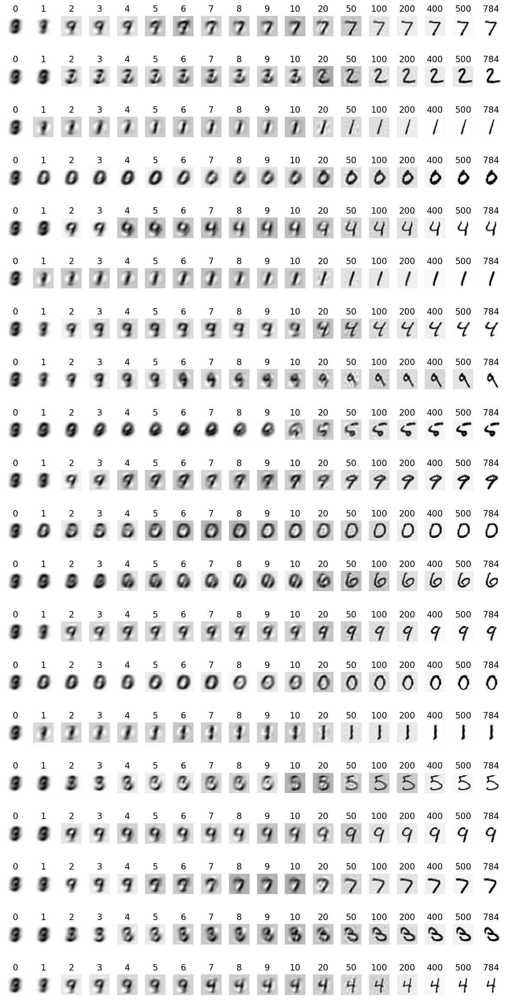

In [ ]:
############
# YOUR CODE
############


digits = []
for cc in range(10):
  digits += (np.where(Y==cc)[0][:2]).tolist()
digits = np.array(digits)

ncols=18
nrows = 20
ff,aa = plt.subplots(nrows, ncols,figsize=(10,20))

mx = np.mean(X[:,:],0)
pca = PCA(n_components = 784).fit(X[:,:])
Z = pca.transform(X[:,:])

icc = 0
for rr in range(nrows):
    aa[rr][icc].set_axis_off()
    aa[rr][icc].imshow((mx).reshape(28,28), 
                          cmap=plt.cm.gray_r, 
                          interpolation='nearest')   
    aa[rr][icc].set_title(repr(0))
for icc,cc in enumerate([1,2,3,4,5,6,7,8,9,10,20,50,100,200,400,500,784]):
    
    ############
    # YOUR CODE
    ############
    Xtilde = Z[:,:cc].dot(pca.components_[:cc,:])
    
    for rr in range(nrows):
        aa[rr][icc+1].set_axis_off()
        aa[rr][icc+1].imshow((mx+Xtilde[rr]).reshape(28,28), 
                          cmap=plt.cm.gray_r, 
                          interpolation='nearest')
        
        aa[rr][icc+1].set_title(repr(cc))
ff.tight_layout()   


# 2. Kernel PCA

To get insights about what extracting principal components in a non-linear framework mean, we are creating some *benchmark* datasets in 2D with non-linear structures.  Kernel PCA is implemented in the scikit learn class [KernelPCA](https://scikit-learn.org/stable/modules/generated/sklearn.decomposition.KernelPCA.html).

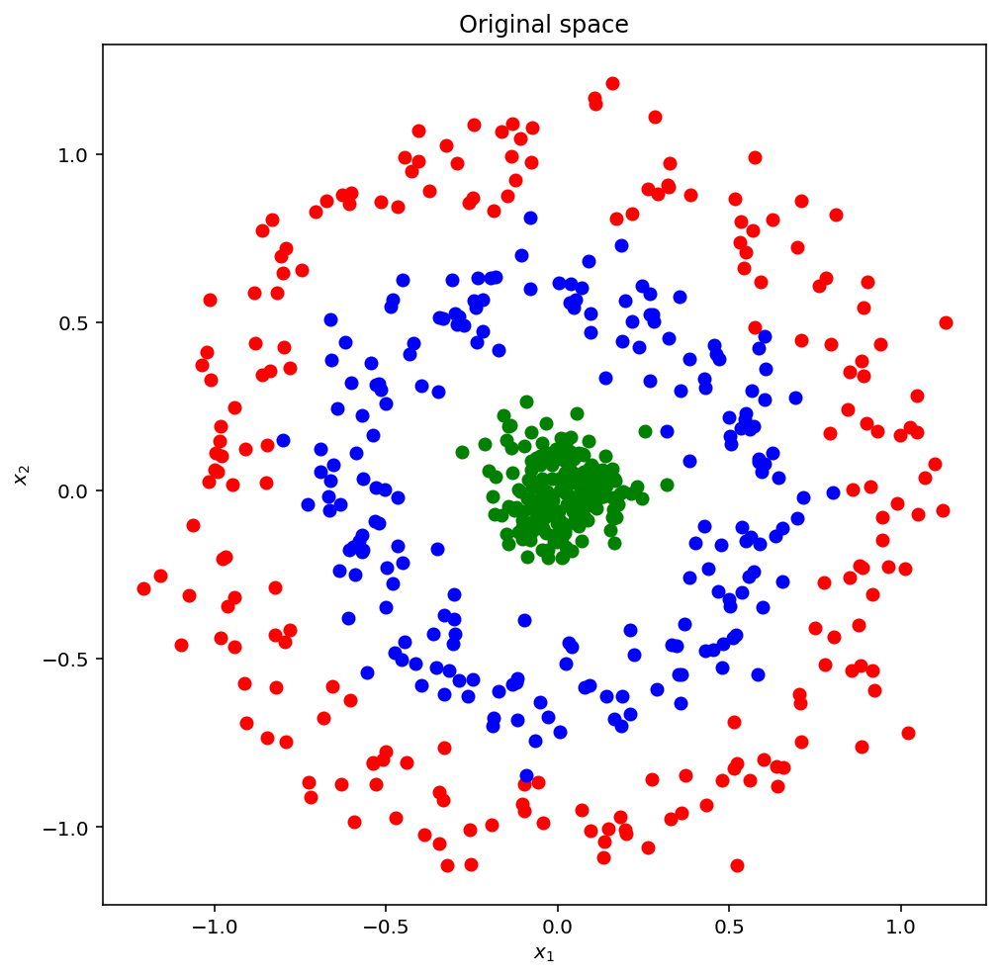

In [ ]:
from sklearn.datasets import make_circles, make_moons

np.random.seed(0)
Xcc, Ycc = make_circles(n_samples=400, factor=.6, noise=.1)

X_c2 = 0.1*np.random.randn(200,2)
Y_c2 = 2*np.ones((200,))

Xcir= np.vstack([Xcc,X_c2])
Ycir= np.hstack([Ycc,Y_c2])

plt.figure(figsize=(8,8))
plt.title("Original space")
reds = Ycir == 0
blues = Ycir == 1
green = Ycir == 2

plt.plot(Xcir[reds, 0], Xcir[reds, 1], "ro")
plt.plot(Xcir[blues, 0], Xcir[blues, 1], "bo")
plt.plot(Xcir[green, 0], Xcir[green, 1], "go")
plt.xlabel("$x_1$")
plt.ylabel("$x_2$")
plt.show()

First check that PCA with two components can't achieve a better alternative representation of the data. For this purpose write code that
- computes a PCA with `n_components=2` 
- transform the data
- scatter plot each transformed group with its corresponding color

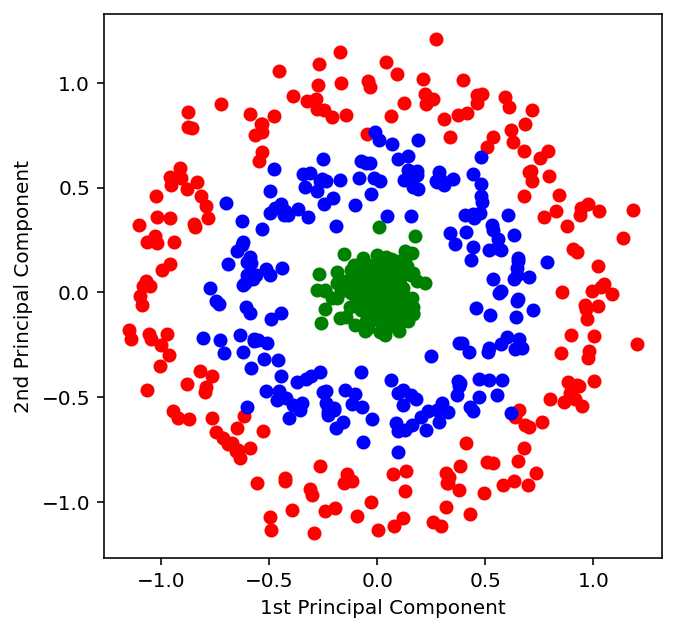

In [ ]:
############
# YOUR CODE
############

from sklearn.decomposition import KernelPCA

NfeaturesMax = 2
gamma = 0.25
pca = PCA(n_components=NfeaturesMax).fit(Xcir)
P = pca.transform(Xcir)

plt.figure(figsize=(5,5))
plt.plot(P[reds, 0], P[reds, 1], "ro")
plt.plot(P[blues, 0], P[blues, 1], "bo")
plt.plot(P[green, 0], P[green, 1], "go")
plt.xlabel("1st Principal Component")
plt.ylabel("2nd Principal Component")
plt.show()

Now try KPCA with an RBF kernel and values of parameter `gamma` in the range $[.1,.2,.5,1,2,3,4,5,10]$

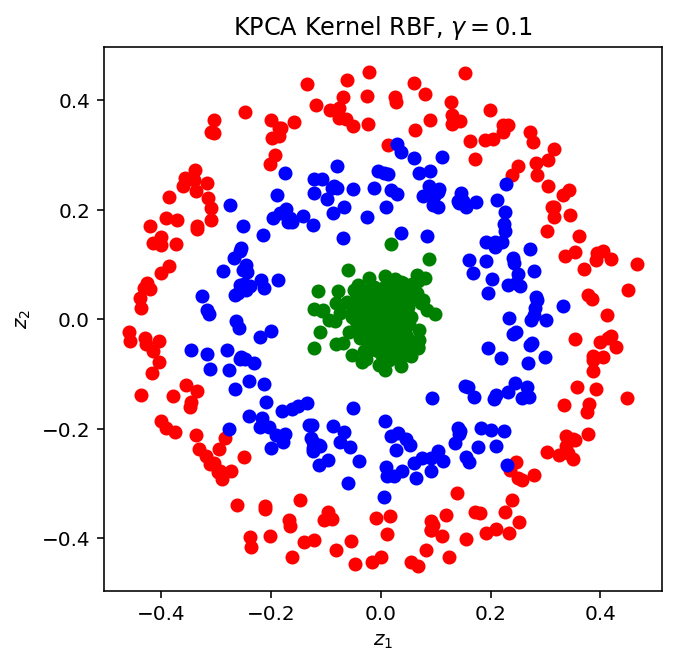

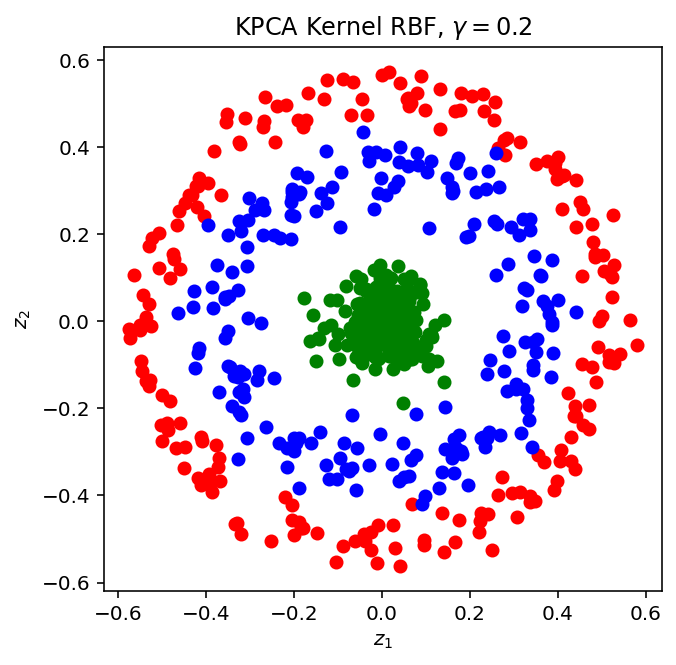

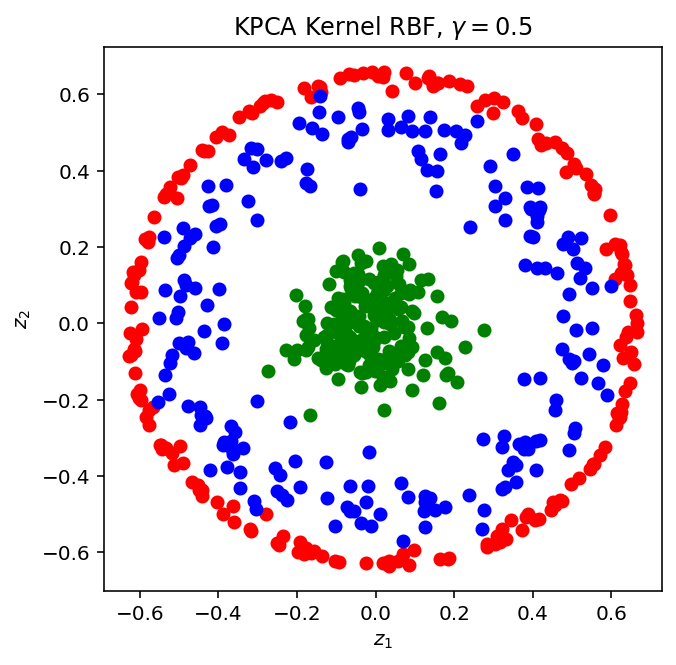

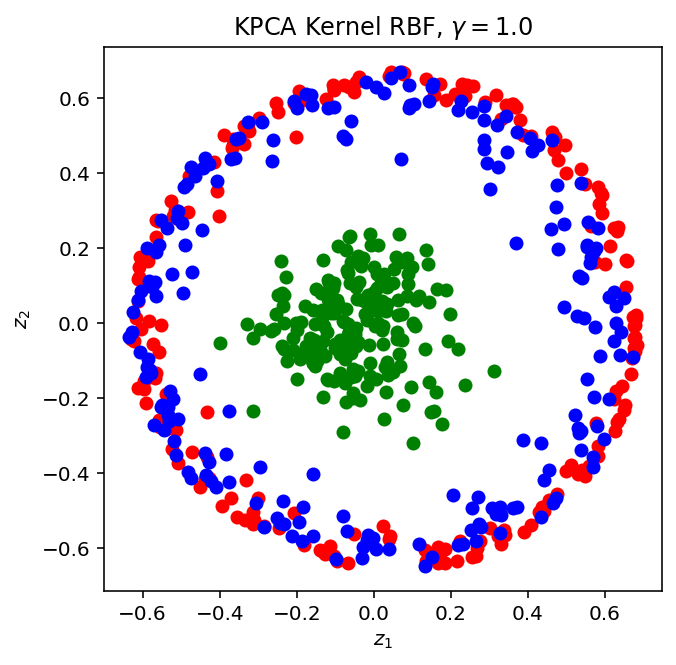

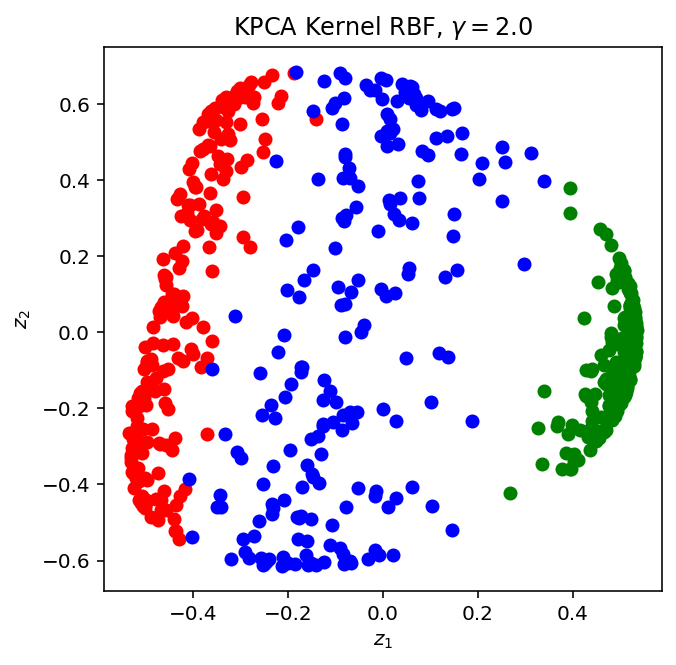

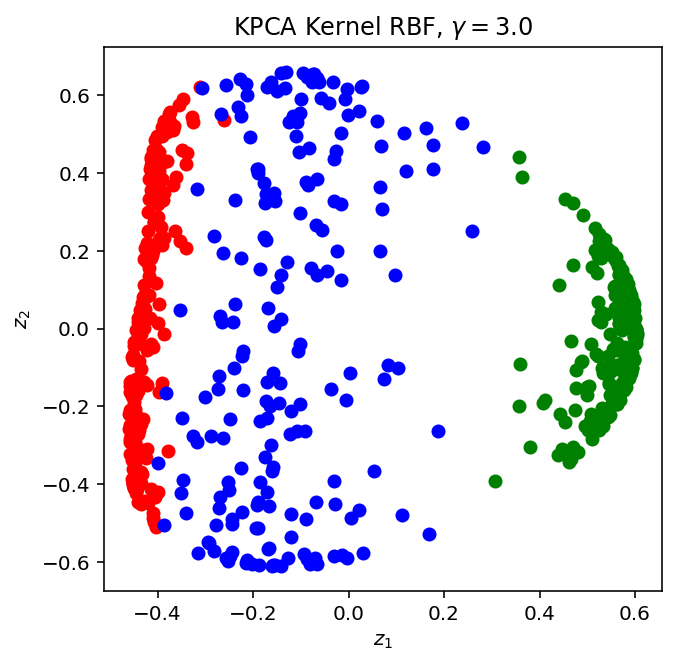

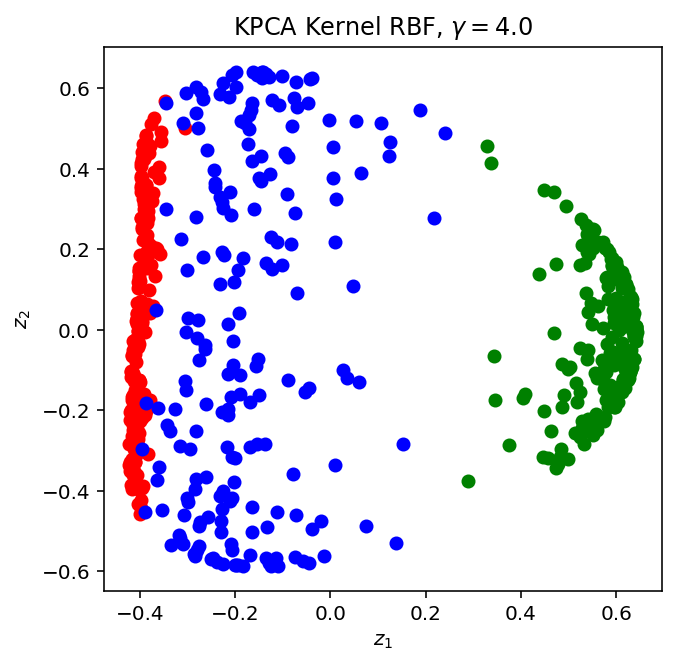

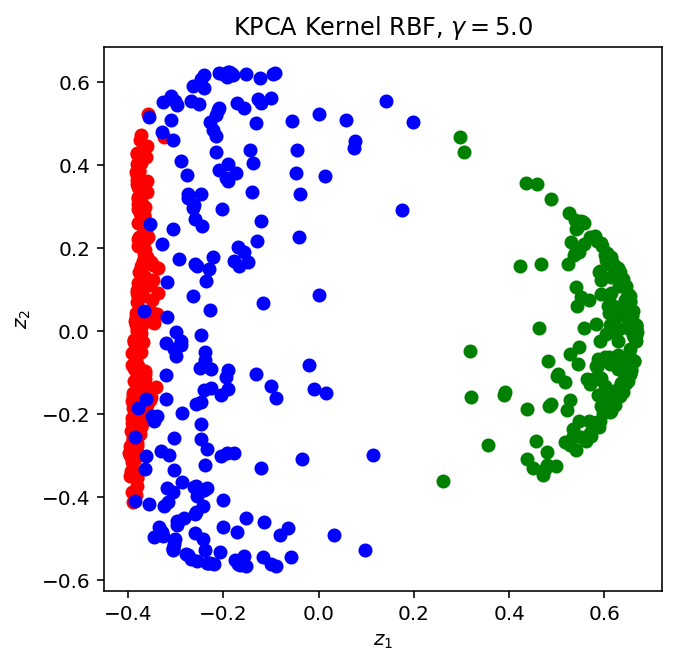

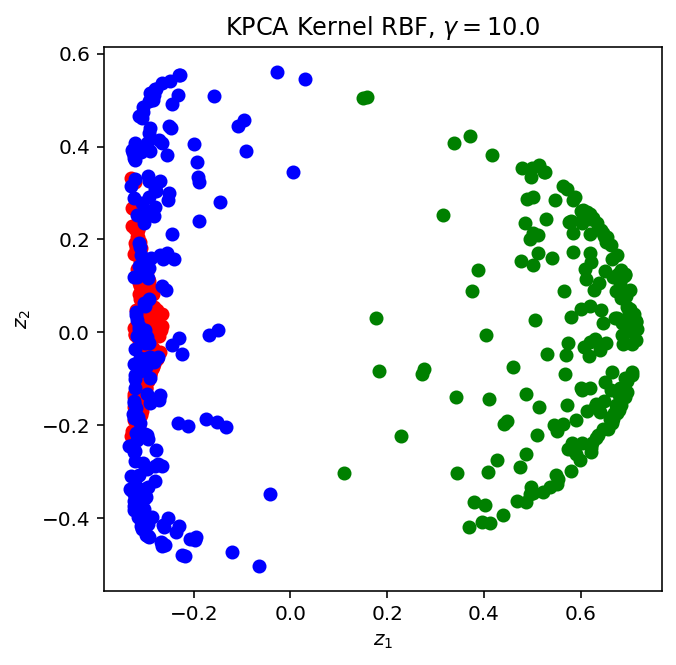

In [ ]:
############
# YOUR CODE
############

for gamma in [.1,.2,.5,1,2,3,4,5,10]:
  kpca = KernelPCA(n_components=2, kernel='rbf', gamma=gamma)
  kpca.fit(Xcir)
  Pk = kpca.transform(Xcir)

  plt.figure(figsize=(5,5))
  plt.plot(Pk[reds, 0], Pk[reds, 1], "ro")
  plt.plot(Pk[blues, 0], Pk[blues, 1], "bo")
  plt.plot(Pk[green, 0], Pk[green, 1], "go")
  plt.xlabel("$z_1$")
  plt.ylabel("$z_2$")
  plt.title('KPCA Kernel RBF, $\gamma={0:.1f}$'.format(gamma))
  plt.show()

(Comments: This means that it gets more nonlinear)

Try the polynomial kernel with degrees in $[1,2,3,4,5,6,7]$


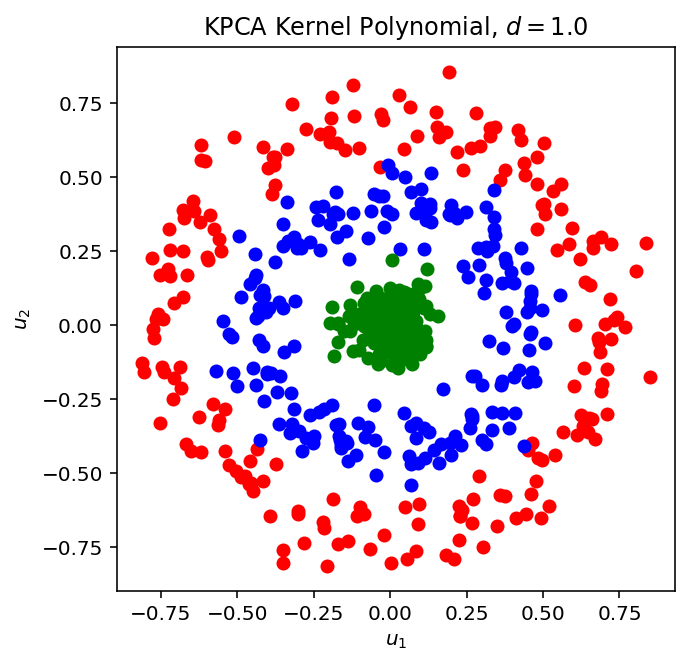

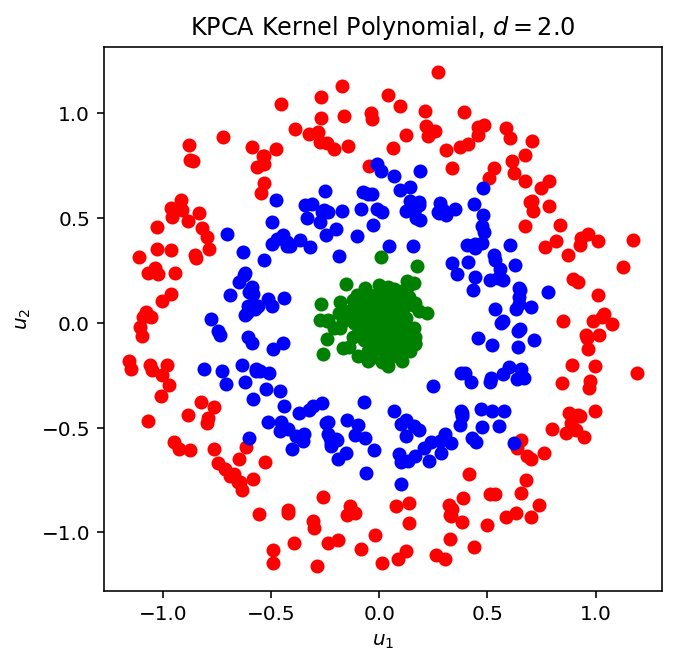

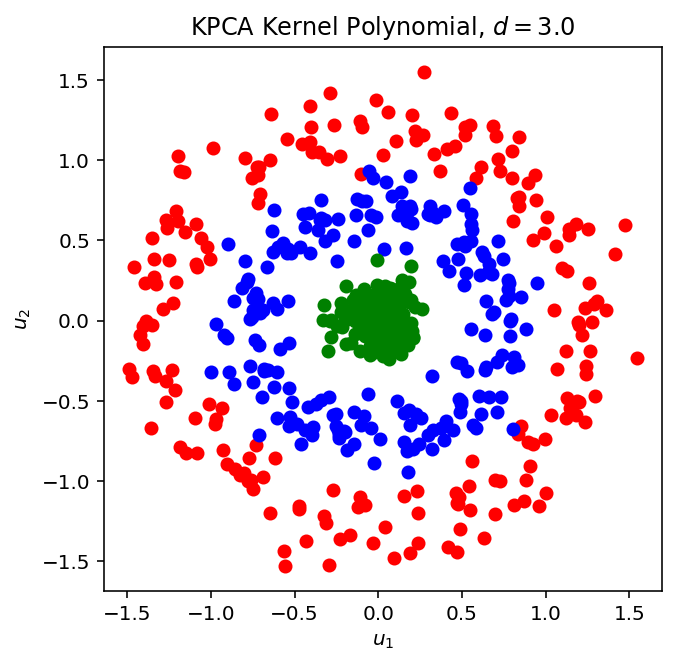

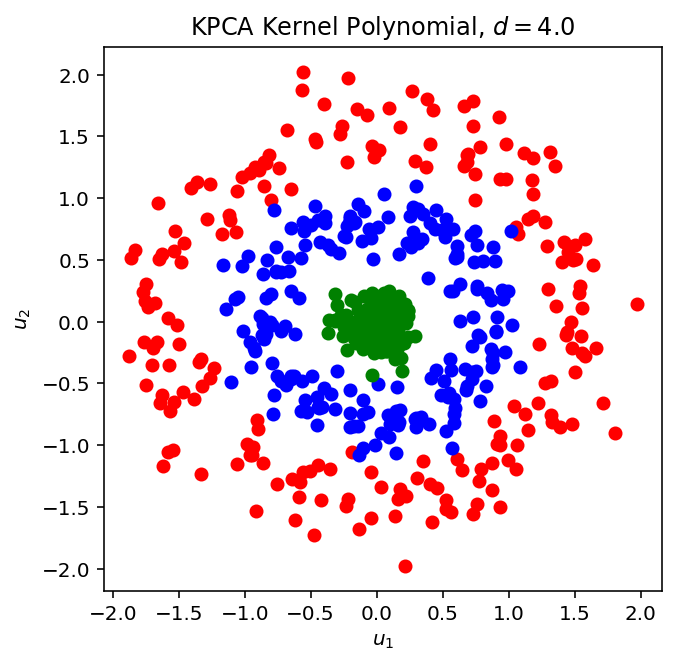

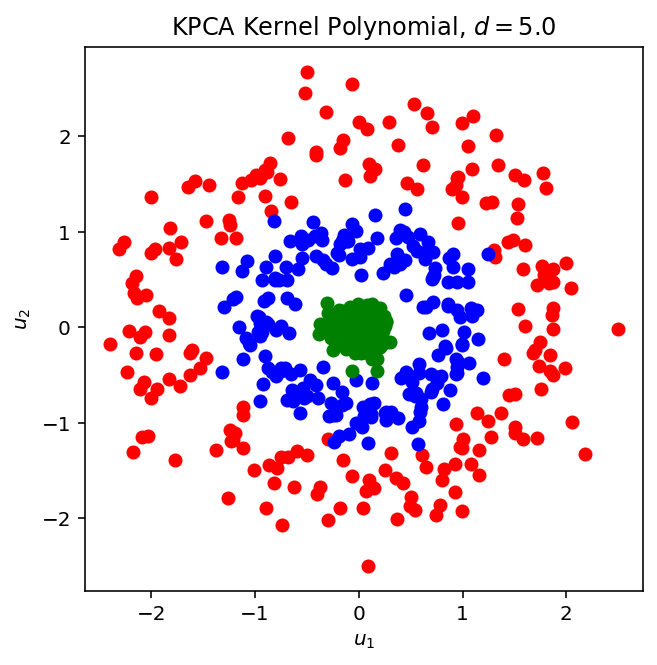

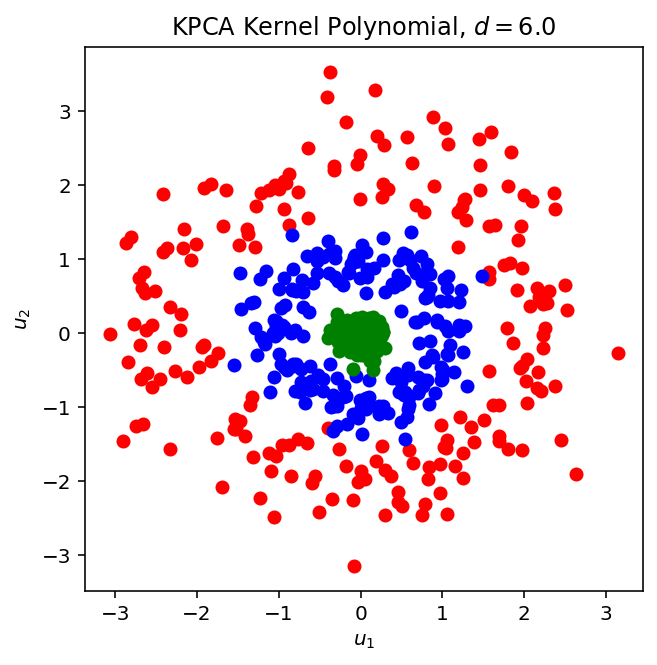

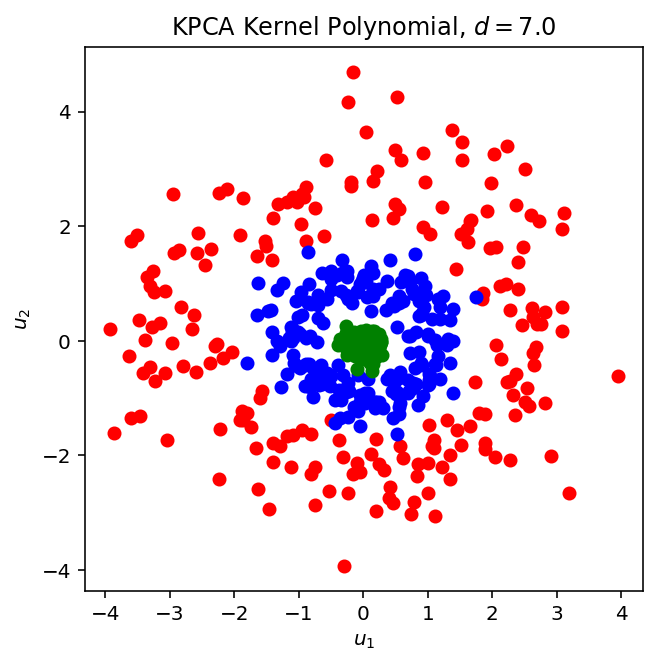

In [ ]:
############
# YOUR CODE
############

for degree in [1,2,3,4,5,6,7]:
  kpca = KernelPCA(n_components=NfeaturesMax, kernel='poly', degree=degree)
  kpca.fit(Xcir)
  Pk = kpca.transform(Xcir)

  plt.figure(figsize=(5,5))
  plt.plot(Pk[reds, 0], Pk[reds, 1], "ro")
  plt.plot(Pk[blues, 0], Pk[blues, 1], "bo")
  plt.plot(Pk[green, 0], Pk[green, 1], "go")
  plt.xlabel("$u_1$")
  plt.ylabel("$u_2$")
  plt.title('KPCA Kernel Polynomial, $d={0:.1f}$'.format(degree))
  plt.show()

Repeat the analysis with this other toy dataset

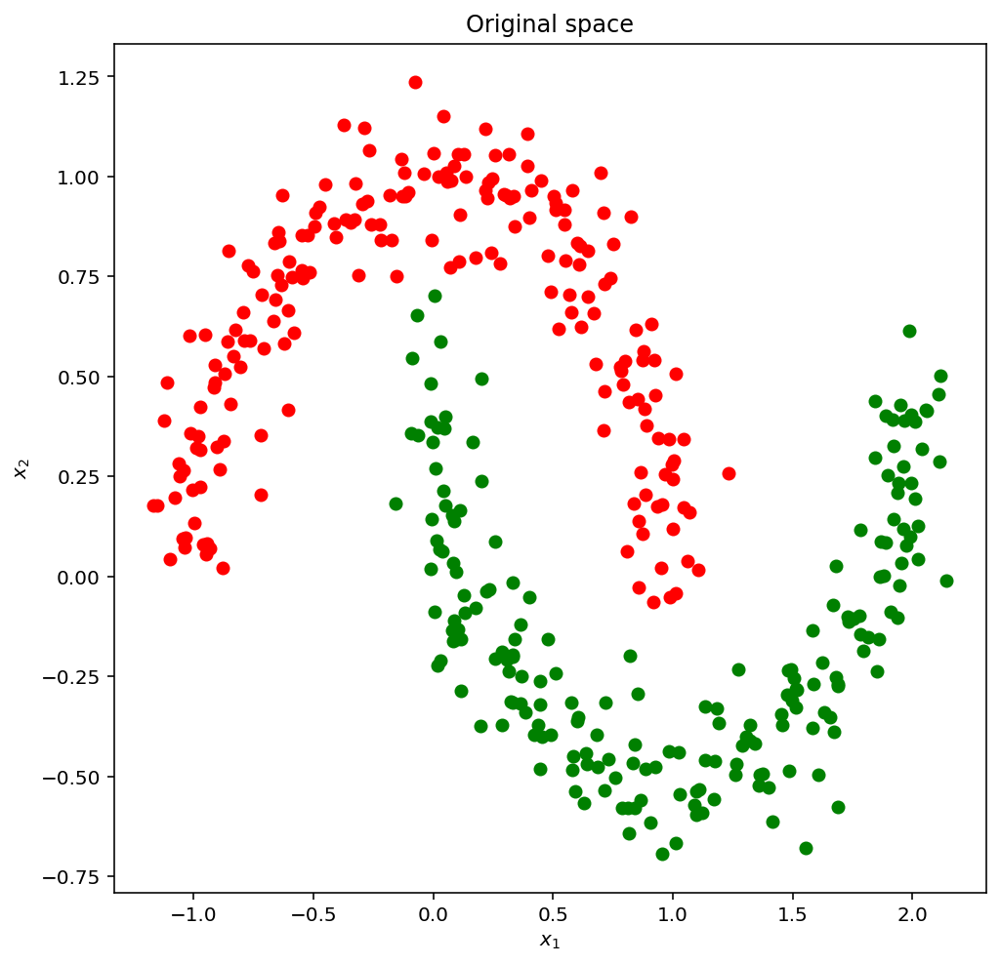

In [ ]:
np.random.seed(0)
Xmoon, Ymoon = make_moons(n_samples=400,  noise=.1)



plt.figure(figsize=(8,8))
plt.title("Original space")
reds = Ymoon == 0
green = Ymoon == 1

plt.plot(Xmoon[reds, 0], Xmoon[reds, 1], "ro")
plt.plot(Xmoon[green, 0], Xmoon[green, 1], "go")
plt.xlabel("$x_1$")
plt.ylabel("$x_2$")
plt.show()

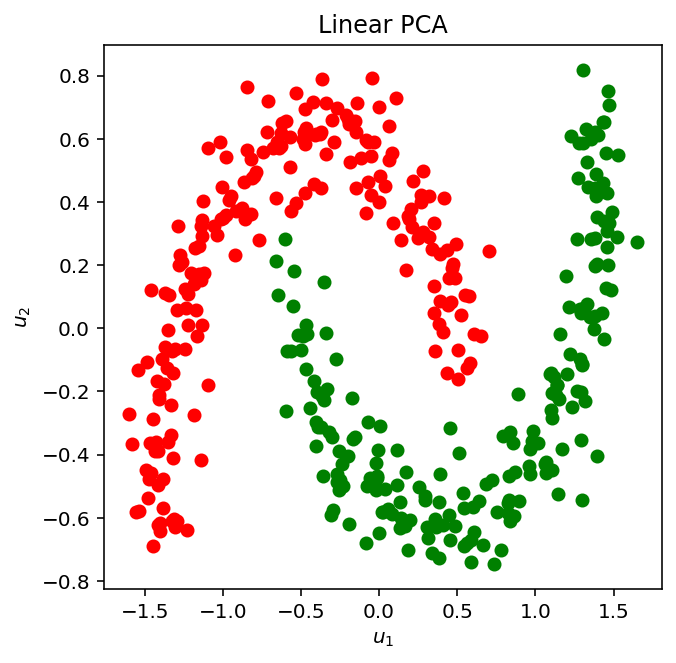

In [ ]:
############
# YOUR CODE
############

NfeaturesMax = 2
gamma = .25
pca = PCA(n_components=NfeaturesMax).fit(Xmoon)
P = pca.transform(Xmoon)

plt.figure(figsize=(5,5))
plt.plot(P[reds, 0], P[reds, 1], "ro")
plt.plot(P[green, 0], P[green, 1], "go")
plt.xlabel("$u_1$")
plt.ylabel("$u_2$")
plt.title('Linear PCA')
plt.show()

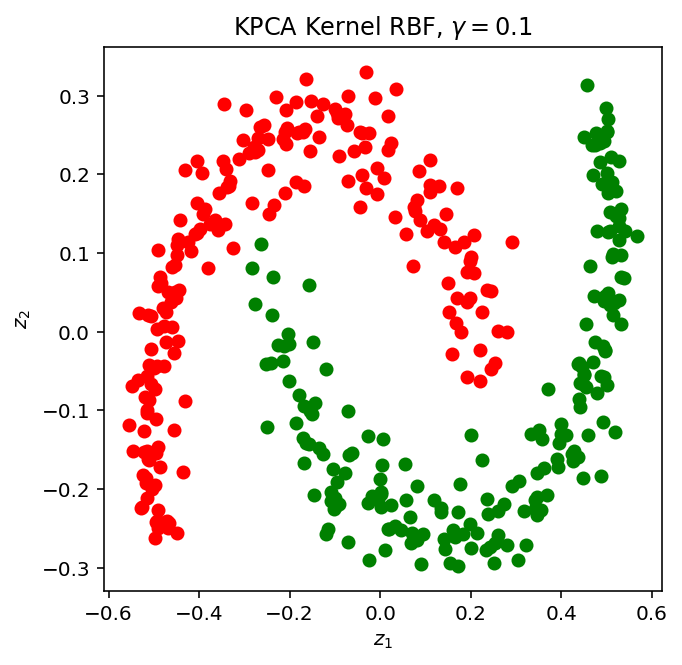

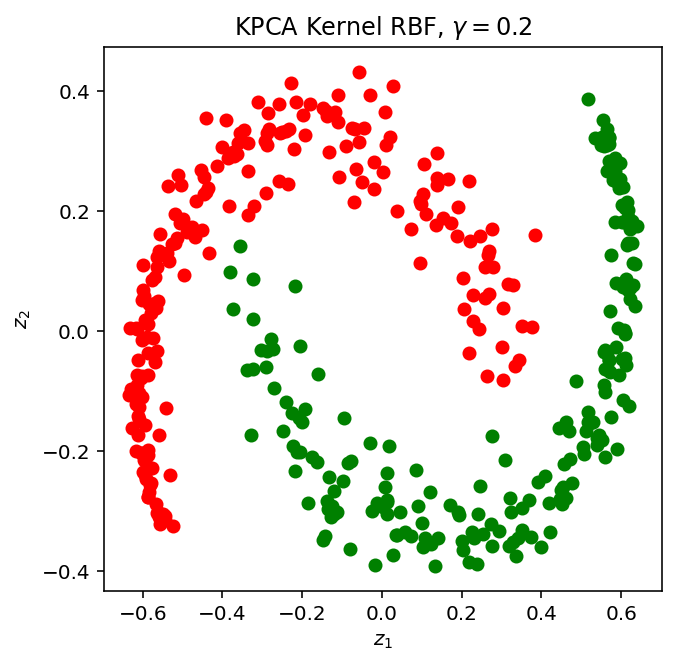

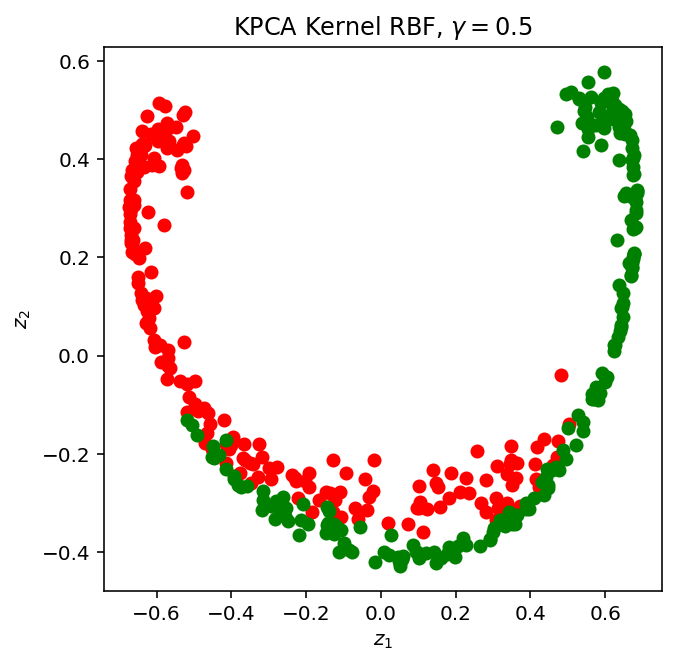

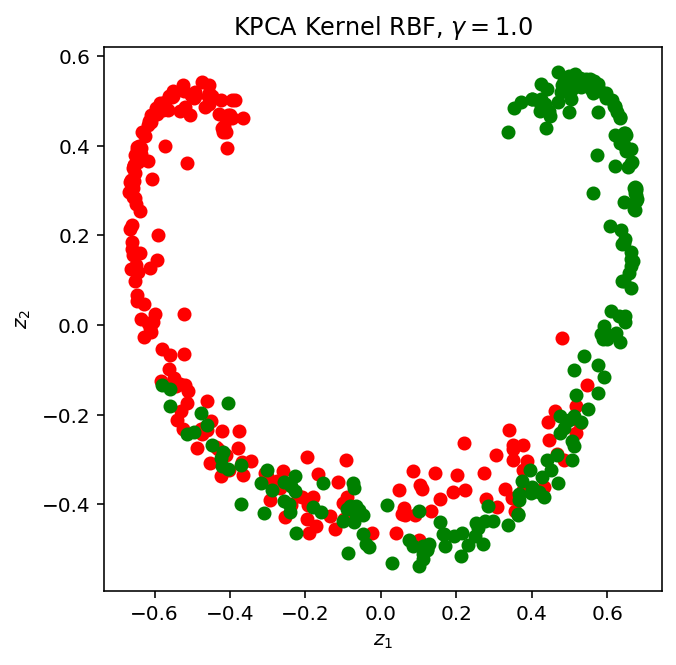

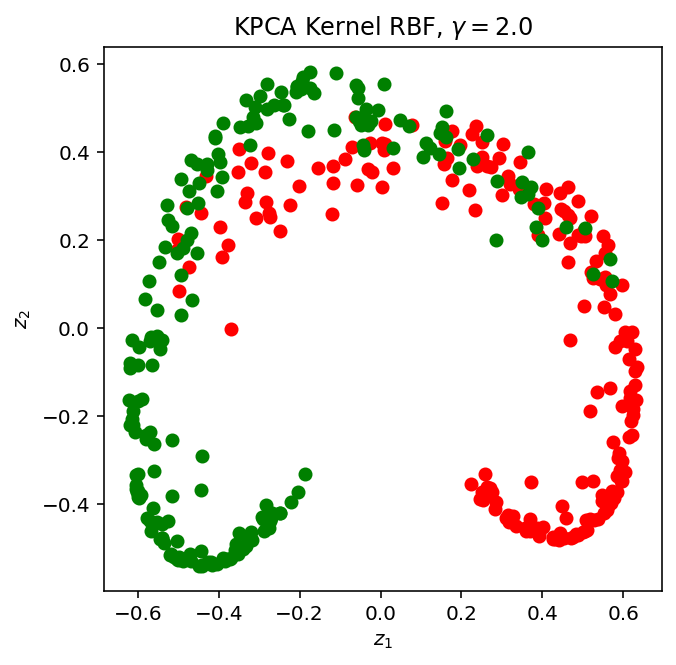

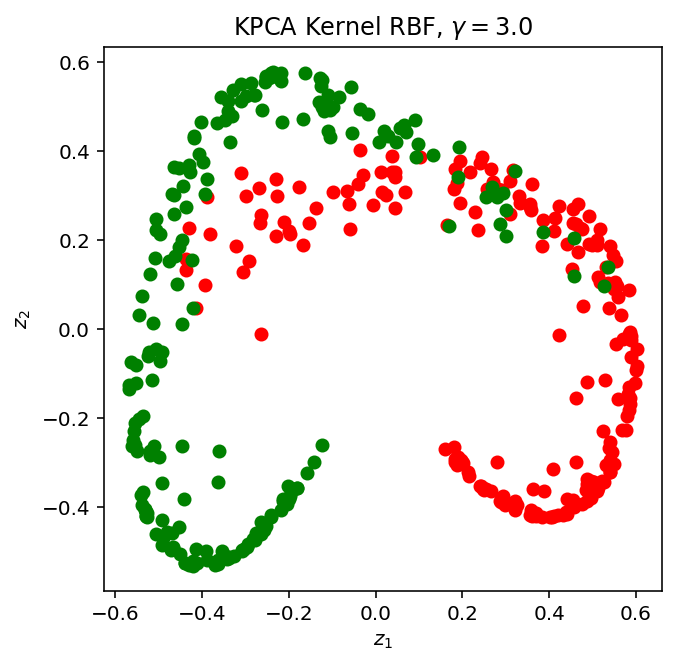

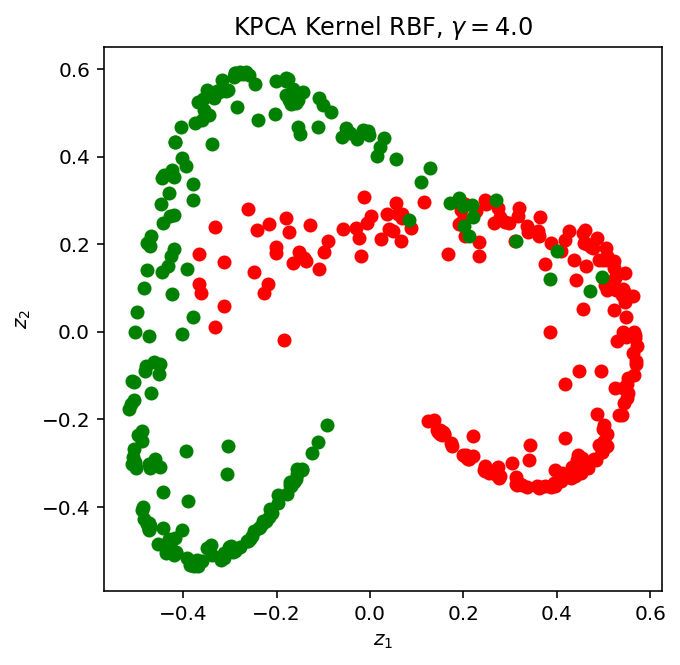

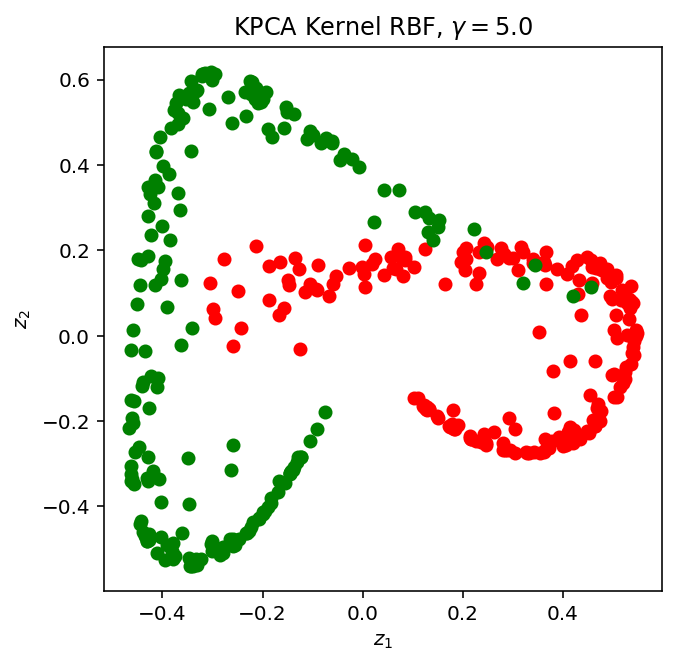

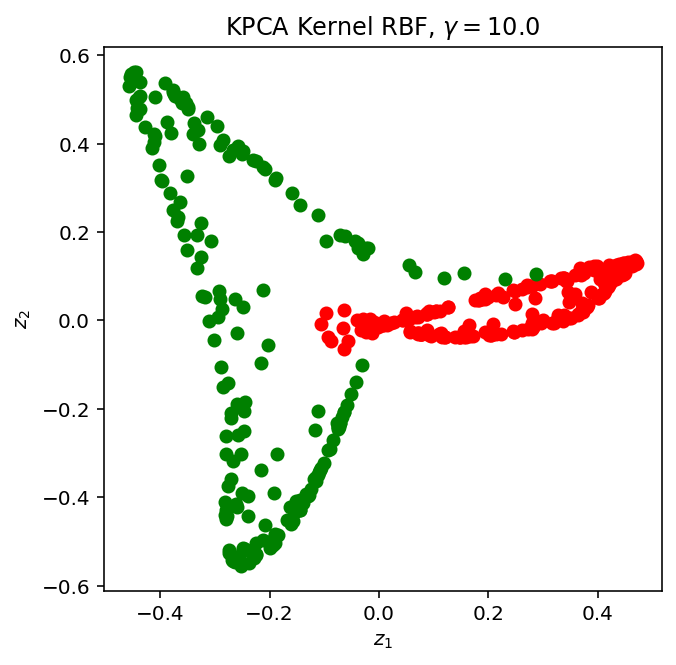

In [ ]:
############
# YOUR CODE
############

for gamma in [.1,.2,.5,1,2,3,4,5,10]:
  kpca = KernelPCA(n_components=2, kernel='rbf', gamma=gamma)
  kpca.fit(Xmoon)
  Pk = kpca.transform(Xmoon)

  plt.figure(figsize=(5,5))
  plt.plot(Pk[reds, 0], Pk[reds, 1], "ro")
  plt.plot(Pk[green, 0], Pk[green, 1], "go")
  plt.xlabel("$z_1$")
  plt.ylabel("$z_2$")
  plt.title('KPCA Kernel RBF, $\gamma={0:.1f}$'.format(gamma))
  plt.show()

## 2.1 KPCA enables to extract as many components as data

With KPCA we can extract more dimensions than the original number of features, as long as we have enough observations. The following cell draws scatter plots of all the 4 non-linear principal components extracted by KPCA in the 5s and 6s dataset. Complete the code in the cell to obtain `Z56`. This array stores the transformation of the dataset of digits 5 and 6 (`X56`) with a KPCA of 4 components (RBF kernel). Check what happens with different values of parameter `gamma`. 

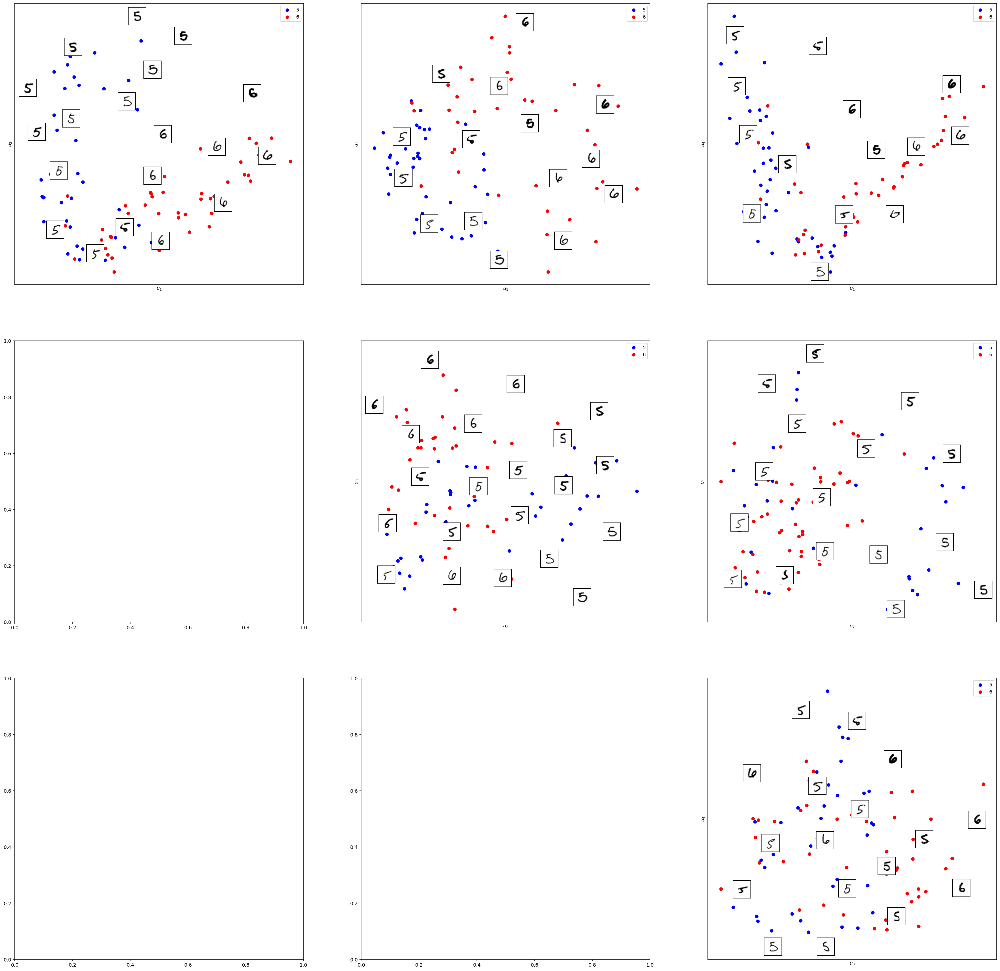

In [ ]:
############
# YOUR CODE
############
kpca56 = KernelPCA(n_components=4, kernel='rbf', gamma = 0.001)
Z56 = kpca56.fit_transform(X5_6)

ncols=4
nrows=4
ff,ax=plt.subplots(ncols-1,nrows-1,figsize=(36,36))
for rr in range(nrows-1):
  for cc in range(rr+1,ncols):
    ZZZ = np.vstack((Z56[:,rr], Z56[:,cc])).T
    aa = ax[rr][cc-1]
    plot_embedding(aa,ZZZ, X5_6, xlabel='$u_{0:d}$'.format(rr+1),ylabel='$u_{0:d}$'.format(cc+1))
    aa.scatter(ZZZ[:50,0], ZZZ[:50,1], color='blue', label='5')
    aa.scatter(ZZZ[50:,0], ZZZ[50:,1], color='red', label='6')
    _=aa.legend()

# 3. *Linear Discriminant Analysis*

## 3.1. Direction of maximum separability of the classes

As we did with the PCA we first show what does looking for the projection that maximizes class separability mean.

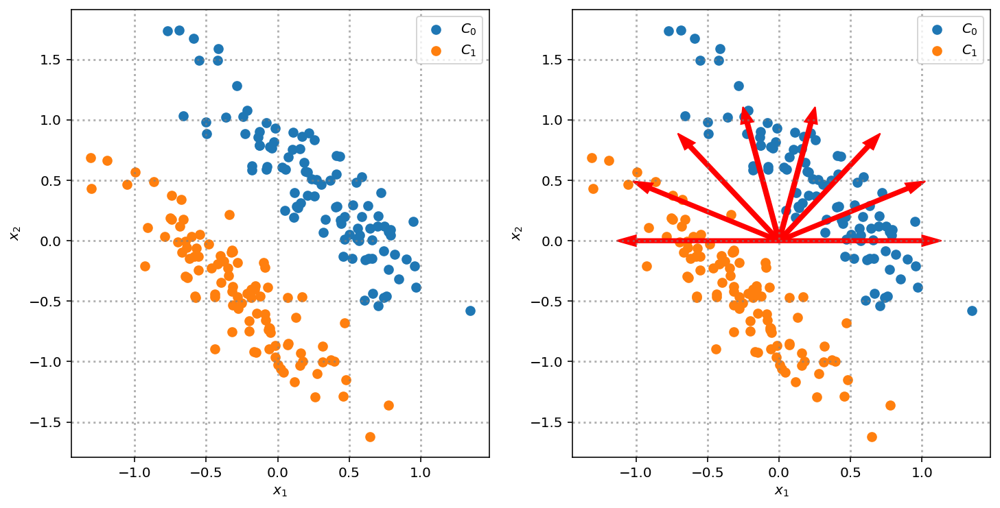

In [ ]:
from sklearn.datasets import make_blobs

XX, y_true = make_blobs(n_samples=200, centers=2,
                       cluster_std=0.60, random_state=0)

rng = np.random.RandomState(13)
X_stretched = np.dot(XX, rng.randn(2, 2))

X_stretched -= np.mean(X_stretched,0)

fig, ax = plt.subplots(1,2,figsize=(12, 6))
ax[0].scatter(X_stretched[y_true==0, 0], X_stretched[y_true==0, 1],  s=40, label='$C_0$')
ax[0].scatter(X_stretched[y_true==1, 0], X_stretched[y_true==1, 1],  s=40, label='$C_1$')
ax[0].set_xlabel('$x_1$')
ax[0].set_ylabel('$x_2$')
ax[0].grid(b=True, which='major', color='gray', alpha=0.6, linestyle='dotted', lw=1.5)
ax[0].legend()
v_angle = np.linspace(0,np.pi,8)

ax[1].scatter(X_stretched[y_true==0, 0], X_stretched[y_true==0, 1],  s=40, label='$C_0$')
ax[1].scatter(X_stretched[y_true==1, 0], X_stretched[y_true==1, 1],  s=40, label='$C_1$')
ax[1].set_xlabel('$x_1$')
ax[1].set_ylabel('$x_2$')
ax[1].grid(b=True, which='major', color='gray', alpha=0.6, linestyle='dotted', lw=1.5)
ax[1].legend()
for alfa in v_angle:
    ax[1].arrow(0,0,np.cos(alfa), np.sin(alfa),color='red', shape='full',width=.03)

We evaluate the separability of each direction of projection by comparing the histograms of the values resulting from projecting the observations of each class. The overlapping of histograms denotes lack of separability. Also the distance between the projected means indicates separability.

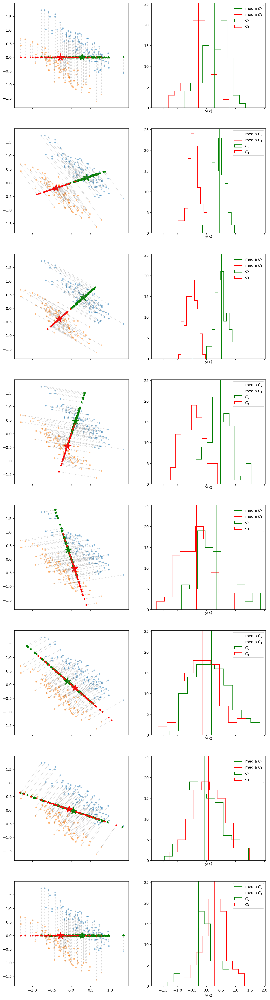

In [ ]:
ff,aa = plt.subplots(len(v_angle), 2, sharex='col', sharey='col', figsize=(12,len(v_angle)*6))
for kk in range(len(v_angle)):
    ax = aa[kk][0]
    ax.scatter(X_stretched[y_true==0, 0], X_stretched[y_true==0, 1], marker='.', s=40, alpha=0.4)
    ax.scatter(X_stretched[y_true==1, 0], X_stretched[y_true==1, 1], marker='.', s=40, alpha=0.4)

    w = np.array([np.cos(v_angle[kk]),np.sin(v_angle[kk])])
    proj = X_stretched.dot(w)
    Z = np.outer(proj,w)
    ax.scatter(Z[y_true==0, 0], Z[y_true==0, 1], marker='*',  s=40, color='green')
    ax.scatter(Z[y_true==1, 0], Z[y_true==1, 1], marker='.',  s=40, color ='red')
    ax.scatter(np.mean(Z[y_true==0, 0]), np.mean(Z[y_true==0, 1]), marker='*',  s=400, color='green', label='media $C_0$')
    ax.scatter(np.mean(Z[y_true==1, 0]), np.mean(Z[y_true==1, 1]), marker='*',  s=400, color ='red', label='medida $C_1$')
    
    for jj in range(Z.shape[0]):
        ax.plot([X_stretched[jj,0], Z[jj,0]],
                 [X_stretched[jj,1], Z[jj,1]],
                  linestyle=':',
                  alpha=0.3, color='gray')

    
    ax = aa[kk][1]
    ax.hist(proj[y_true==0],10,histtype='step', label='$C_0$', color='green')
    ax.axvline(x=np.mean(proj[y_true==0]), color='green', label = 'media $C_0$')
    ax.hist(proj[y_true==1],10,histtype='step', label='$C_1$', color='red')
    ax.axvline(x=np.mean(proj[y_true==1]), color='red', label = 'media $C_1$')
    ax.set_xlabel('y(x)')
    ax.legend()    

The scikit learn class [`LinearDiscriminantAnalysis`](https://scikit-learn.org/stable/modules/generated/sklearn.discriminant_analysis.LinearDiscriminantAnalysis.html) implements the Fisher classifier. Complete the code in the next cell to find the direction of maximum class separability using this class. Basically use `LinearDiscriminantAnalysis` to find values for variables `Z` and `proj`.

In [ ]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

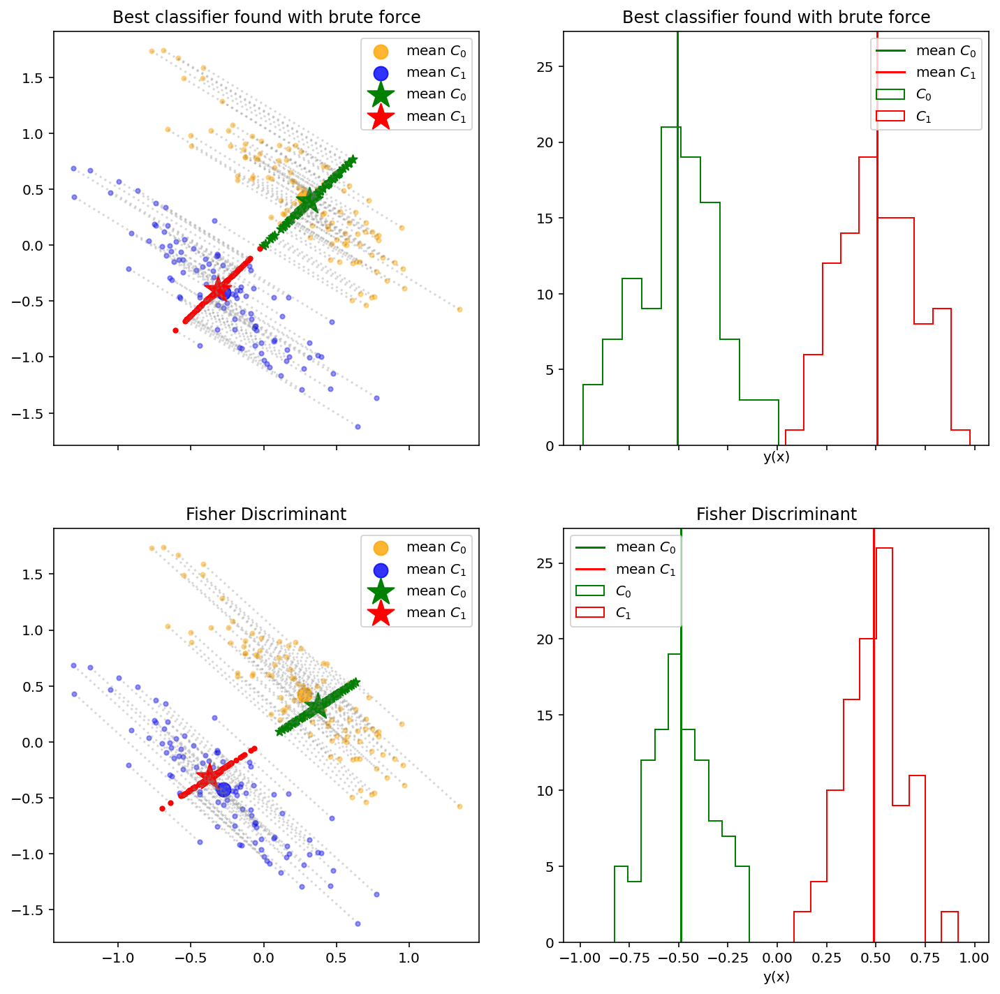

In [ ]:
ff,aa = plt.subplots(2, 2, sharex='col', sharey='col', figsize=(12,2*6))

kk = 0

ax = aa[kk][0]
ax.scatter(X_stretched[y_true==0, 0], X_stretched[y_true==0, 1], marker='.', s=40, alpha=0.4, color='orange')
ax.scatter(X_stretched[y_true==1, 0], X_stretched[y_true==1, 1], marker='.', s=40, alpha=0.4, color='blue')
ax.scatter(np.mean(X_stretched[y_true==0, 0]), np.mean(X_stretched[y_true==0, 1]), marker='.', 
           s=400, alpha=0.8, color='orange', label='mean $C_0$')
ax.scatter(np.mean(X_stretched[y_true==1, 0]), np.mean(X_stretched[y_true==1, 1]), marker='.',
           s=400, alpha=0.8, color='blue', label='mean $C_1$')

w = -np.array([np.cos(v_angle[2]),np.sin(v_angle[2])])
proj = X_stretched.dot(w)
Z = np.outer(proj,w)
ax.scatter(Z[y_true==0, 0], Z[y_true==0, 1], marker='*',  s=40, color='green')
ax.scatter(Z[y_true==1, 0], Z[y_true==1, 1], marker='.',  s=40, color ='red')
ax.scatter(np.mean(Z[y_true==0, 0]), np.mean(Z[y_true==0, 1]), marker='*',  s=400, color='green', label='mean $C_0$')
ax.scatter(np.mean(Z[y_true==1, 0]), np.mean(Z[y_true==1, 1]), marker='*',  s=400, color ='red', label='mean $C_1$')

for jj in range(Z.shape[0]):
    ax.plot([X_stretched[jj,0], Z[jj,0]],
             [X_stretched[jj,1], Z[jj,1]],
              linestyle=':',
              alpha=0.3, color='gray')

ax.set_title('Best classifier found with brute force')

_=ax.legend() 
ax = aa[kk][1]
ax.hist(proj[y_true==0],10,histtype='step', label='$C_0$', color='green')
ax.axvline(x=np.mean(proj[y_true==0]), color='green', label = 'mean $C_0$')
ax.hist(proj[y_true==1],10,histtype='step', label='$C_1$', color='red')
ax.axvline(x=np.mean(proj[y_true==1]), color='red', label = 'mean $C_1$')
ax.set_xlabel('y(x)')
_=ax.legend()  
_=ax.set_title('Best classifier found with brute force')


kk +=1 

ax = aa[kk][0]
ax.scatter(X_stretched[y_true==0, 0], X_stretched[y_true==0, 1], marker='.', s=40, alpha=0.4, color='orange')
ax.scatter(X_stretched[y_true==1, 0], X_stretched[y_true==1, 1], marker='.', s=40, alpha=0.4, color='blue')
ax.scatter(np.mean(X_stretched[y_true==0, 0]), np.mean(X_stretched[y_true==0, 1]), marker='.', s=400, 
           alpha=0.8, color='orange', label='mean $C_0$')
ax.scatter(np.mean(X_stretched[y_true==1, 0]), np.mean(X_stretched[y_true==1, 1]), marker='.', s=400, 
           alpha=0.8, color='blue', label='mean $C_1$')

############
# YOUR CODE
clf =  LinearDiscriminantAnalysis().fit(X_stretched, y_true)
v = clf.coef_[0]/np.linalg.norm(clf.coef_[0])
proj = X_stretched.dot(v)
Z = np.outer(proj,v)
############



ax.scatter(Z[y_true==0, 0], Z[y_true==0, 1], marker='*',  s=40, color='green')
ax.scatter(Z[y_true==1, 0], Z[y_true==1, 1], marker='.',  s=40, color ='red')
ax.scatter(np.mean(Z[y_true==0, 0]), np.mean(Z[y_true==0, 1]), marker='*',  s=400, color='green', label='mean $C_0$')
ax.scatter(np.mean(Z[y_true==1, 0]), np.mean(Z[y_true==1, 1]), marker='*',  s=400, color ='red', label='mean $C_1$')

for jj in range(Z.shape[0]):
    ax.plot([X_stretched[jj,0], Z[jj,0]],
             [X_stretched[jj,1], Z[jj,1]],
              linestyle=':',
              alpha=0.3, color='gray')

ax.set_title('Fisher Discriminant')
_=ax.legend() 
ax = aa[kk][1]
ax.hist(proj[y_true==0],10,histtype='step', label='$C_0$', color='green')
ax.axvline(x=np.mean(proj[y_true==0]), color='green', label = 'mean $C_0$')
ax.hist(proj[y_true==1],10,histtype='step', label='$C_1$', color='red')
ax.axvline(x=np.mean(proj[y_true==1]), color='red', label = 'mean $C_1$')
ax.set_xlabel('y(x)')
_=ax.legend()  
_=ax.set_title('Fisher Discriminant')


The method `decision_function` can be used to draw contour plots and analyze the classification regions.

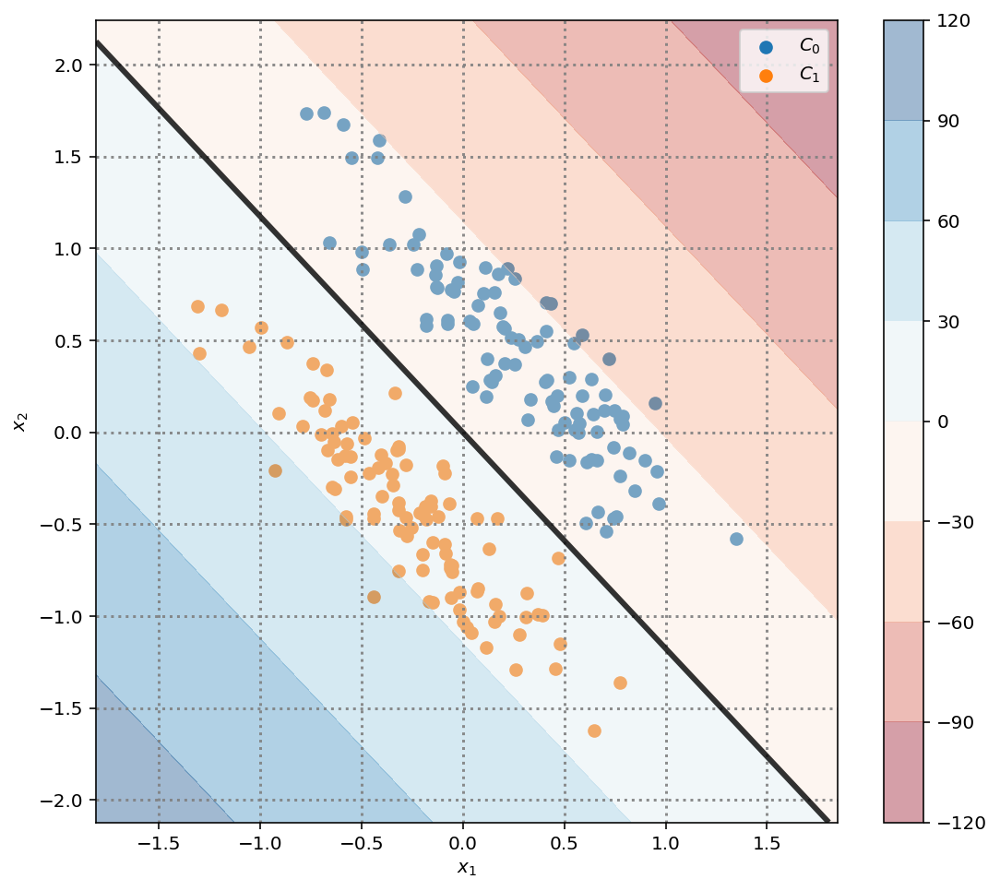

In [ ]:
from matplotlib.colors import ListedColormap



cm = plt.cm.RdBu
cm_bright = ListedColormap(['#FF0000', '#0000FF'])

fig, ax = plt.subplots(1,1,figsize=(9, 8))
ax.scatter(X_stretched[y_true==0, 0], X_stretched[y_true==0, 1],  s=40, label='$C_0$')
ax.scatter(X_stretched[y_true==1, 0], X_stretched[y_true==1, 1],  s=40, label='$C_1$')
ax.set_xlabel('$x_1$')
ax.set_ylabel('$x_2$')
ax.grid(b=True, which='major', color='gray', alpha=0.9, linestyle='dotted', lw=1.5)
_=ax.legend()

h=100
x_min, x_max = X_stretched[:, 0].min() - .5, X_stretched[:, 0].max() + .5
y_min, y_max = X_stretched[:, 1].min() - .5, X_stretched[:, 1].max() + .5
xx, yy = np.meshgrid(np.linspace(x_min, x_max, h),
                        np.linspace(y_min, y_max, h))
Z = clf.decision_function(np.c_[xx.ravel(), yy.ravel()])

        # Put the result into a color plot
Z = Z.reshape(xx.shape)
cc=ax.contourf(xx, yy, Z, cmap=cm, alpha=.4)
fig.colorbar(cc, ax=ax)
_=ax.contour(xx, yy, Z, [0],  alpha=.8, colors='black',linewidths=3)

## 3.2 Fisher classifier with the digits datasets

Use the Linear Discriminant Analysis to solve the following problems:

- separate 1s from 5s
- separate 5s from 6s
- separate even digits from odd digits

### 5 vs 1

In the first place we classify in the reduced space given by a PCA with 2 components. Write code that:
- Creates the dataset with 50 examples of digit 5 and 50 examples of digit 1
- Fit a PCA with `n_components=2`
- Learn a linear classifier in the reduced space with  `LinearDiscriminantAnalysis`
- Show the contour plot with the classification boundary

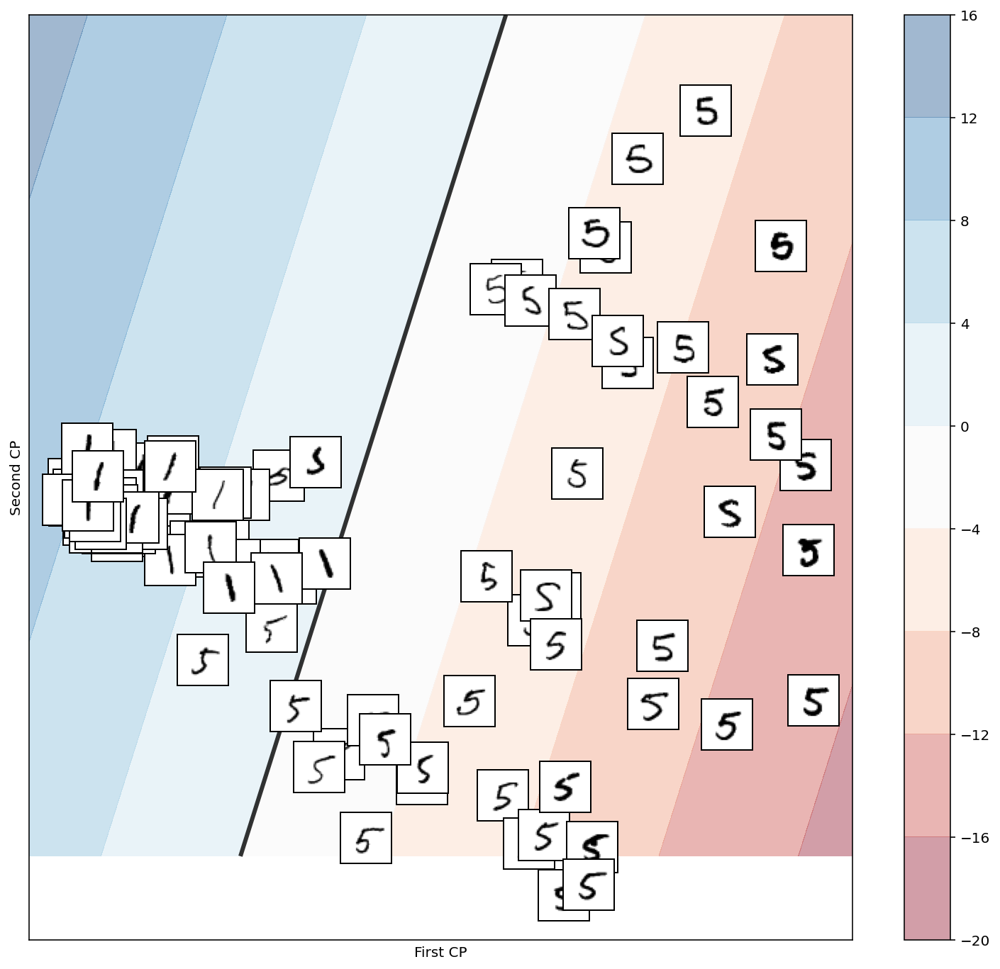

In [ ]:

############
# YOUR CODE
############

ones = np.where(Y==1)[0]
X5_1 = np.vstack((X[fives[:50],:], X[ones[:50],:]))
Y5_1 = np.ones((X5_1.shape[0]))
Y5_1[:50] = -1
ff,ax = plt.subplots(1,1,figsize=(13,12))
pca51 = PCA(n_components=2)
Z51=pca51.fit_transform(X5_1)
plot_embedding(ax,Z51,X5_1)

lda_pca_51 = LinearDiscriminantAnalysis()
lda_pca_51.fit(Z51,Y5_1)
h=100
x_min, x_max = Z51[:,0].min() - .5, Z51[:,0].max() + .5
y_min, y_max = Z51[:,0].min() - .5, Z51[:,0].max() + .5
xx, yy = np.meshgrid(np.linspace(x_min, x_max, h), np.linspace(y_min,y_max,h))
Z = lda_pca_51.decision_function(np.c_[xx.ravel(), yy.ravel()])

Z = Z.reshape(xx.shape)
cc=ax.contourf(xx, yy, Z, cmap=cm, alpha=.4)
fig.colorbar(cc, ax=ax)
_=ax.contour(xx, yy, Z, [0],  alpha=.8, colors='black',linewidths=3)



Write code in the next cell that applies `LinearDiscriminantAnalysis` to solve the classification problem in the original ($28\times 28$) space. Also obtain in `U51` the transformation of the input instances into the reduced dimension space determined by LDA.

In [ ]:
############
# YOUR CODE
############

lda_51 = LinearDiscriminantAnalysis()
lda_51.fit(X5_1,Y5_1)
U51 = lda_51.transform(X5_1)


In binary classification problems `LinearDiscriminantAnalysis` finds a single dimension reduced space. I have made up a random vertical component to produce the plot below

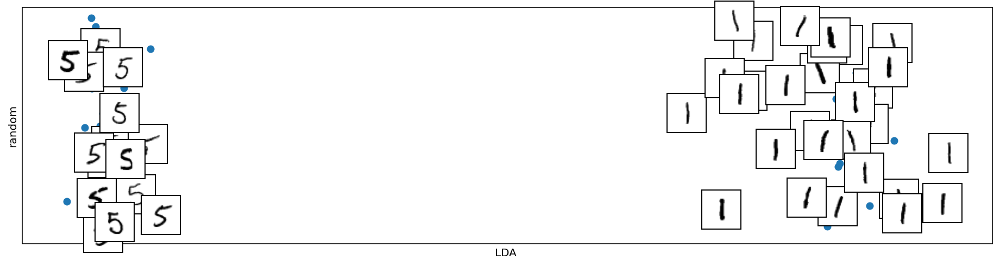

In [ ]:
ff,aa = plt.subplots(1,1,figsize=(16,4))
plot_embedding(aa,np.vstack((U51.ravel(), 0.02*np.random.rand(U51.shape[0]))).T, 
                   X5_1,
                  xlabel='LDA ', 
                  ylabel='random')

### 5 vs 6

Repeat the experiment with examples of digits 5 and 6.

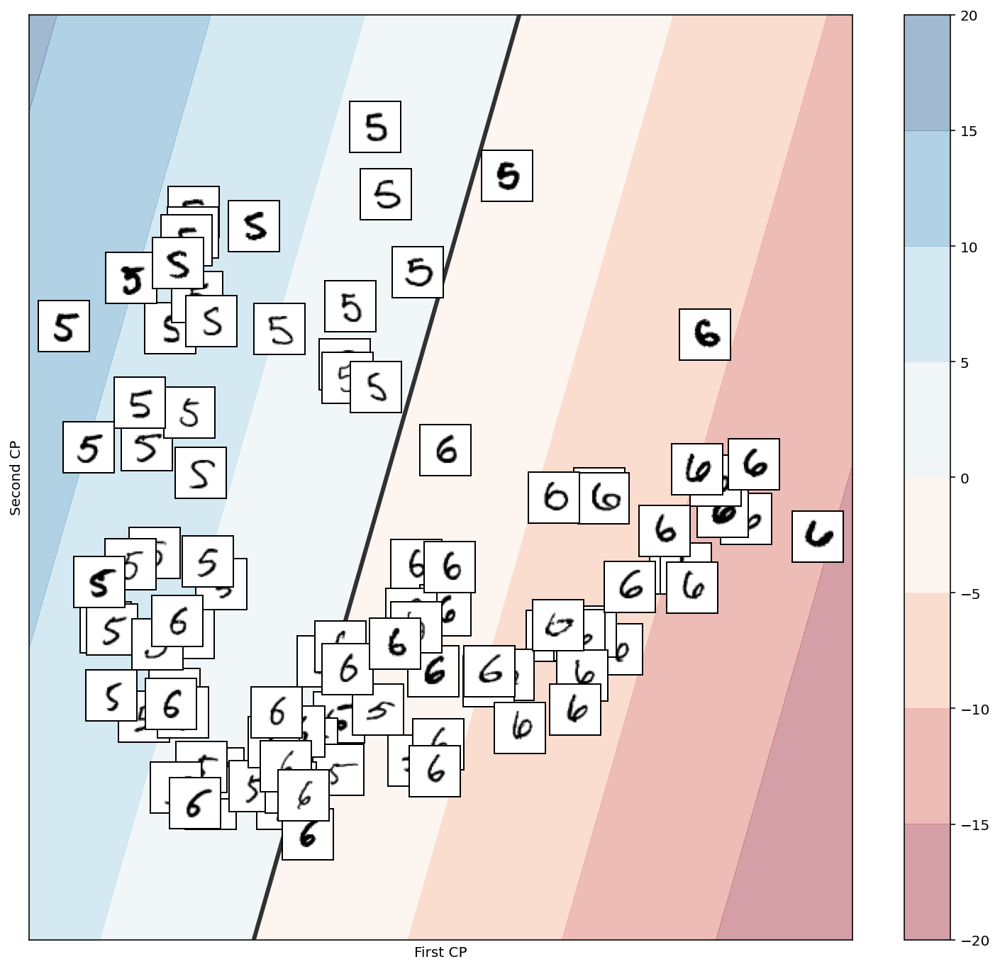

In [ ]:
############
# YOUR CODE
############

six = np.where(Y==6)[0]
X5_6 = np.vstack((X[fives[:50],:], X[six[:50],:]))
Y5_6 = np.ones((X5_6.shape[0]))
Y5_6[:50] = -1
ff,ax = plt.subplots(1,1,figsize=(13,12))
pca56 = PCA(n_components=2)
Z56=pca56.fit_transform(X5_6)
plot_embedding(ax,Z56,X5_6)

lda_pca_56 = LinearDiscriminantAnalysis()
lda_pca_56.fit(Z56,Y5_6)
h=100
x_min, x_max = Z56[:,0].min() - .5, Z56[:,0].max() + .5
y_min, y_max = Z56[:,0].min() - .5, Z56[:,0].max() + .5
xx, yy = np.meshgrid(np.linspace(x_min, x_max, h), np.linspace(y_min,y_max,h))
Z = lda_pca_51.decision_function(np.c_[xx.ravel(), yy.ravel()])

Z = Z.reshape(xx.shape)
cc=ax.contourf(xx, yy, Z, cmap=cm, alpha=.4)
fig.colorbar(cc, ax=ax)
_=ax.contour(xx, yy, Z, [0],  alpha=.8, colors='black',linewidths=3)

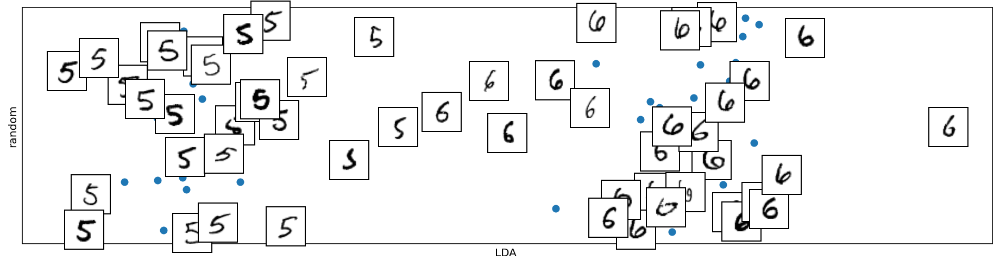

In [ ]:
############
# YOUR CODE
############

lda_56 = LinearDiscriminantAnalysis()
lda_56.fit(X5_6,Y5_6)
U56 = lda_56.transform(X5_6)

ff,aa = plt.subplots(1,1,figsize=(16,4))
plot_embedding(aa,np.vstack((U56.ravel(), 0.02*np.random.rand(U56.shape[0]))).T, 
                   X5_6,
                  xlabel='LDA ', 
                  ylabel='random')

### Even vs. odd



In [ ]:
############
# YOUR CODE
############

evens = []
for cc in [0,2,4,6,8]:
  evens += (np.where(Y==cc)[0][:20]).tolist()
evens = np.array(evens)

odds = []
for cc in [1,3,5,7,9]:
  odds += (np.where(Y==cc)[0][:20]).tolist()
odds = np.array(odds)

In [ ]:
############
# YOUR CODE
############

Xeven = np.vstack((X[evens,:],X[odds,:]))
Yeven = np.ones(Xeven.shape[0])
Yeven[:len(evens)]=-1

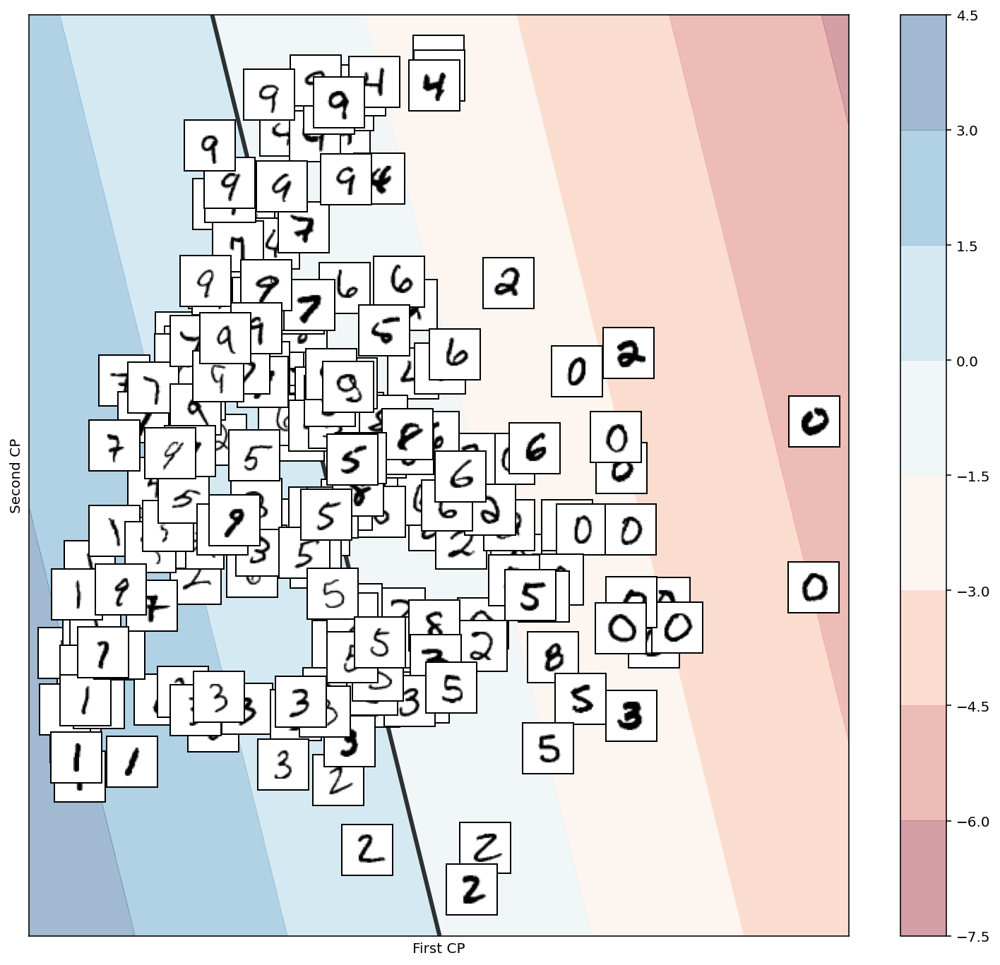

In [ ]:
############
# YOUR CODE
############

ff,ax = plt.subplots(1,1,figsize=(13,12))
pca_even = PCA(n_components=2)
Z_even=pca_even.fit_transform(Xeven)
plot_embedding(ax, Z_even, Xeven)

lda_pca_even = LinearDiscriminantAnalysis()
lda_pca_even.fit(Z_even,Yeven)
h=100
x_min, x_max = Z_even[:,0].min() - .5, Z_even[:,0].max() + .5
y_min, y_max = Z_even[:,1].min() - .5, Z_even[:,1].max() + .5
xx, yy = np.meshgrid(np.linspace(x_min, x_max, h), np.linspace(y_min,y_max,h))
Z = lda_pca_even.decision_function(np.c_[xx.ravel(), yy.ravel()])

Z = Z.reshape(xx.shape)
cc=ax.contourf(xx, yy, Z, cmap=cm, alpha=.4)
fig.colorbar(cc, ax=ax)
_=ax.contour(xx, yy, Z, [0],  alpha=.8, colors='black',linewidths=3)

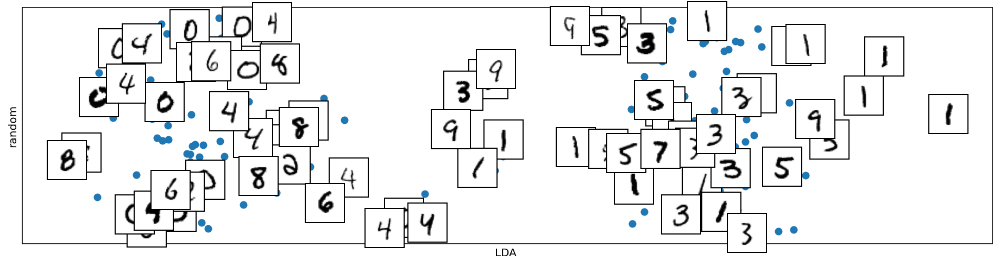

In [ ]:
############
# YOUR CODE
############

lda_even = LinearDiscriminantAnalysis()
lda_even.fit(Xeven,Yeven)
Ueven = lda_even.transform(Xeven)

ff,aa = plt.subplots(1,1,figsize=(16,4))
plot_embedding(aa,np.vstack((Ueven.ravel(), 0.02*np.random.rand(Ueven.shape[0]))).T, 
                   Xeven,
                  xlabel='LDA ', 
                  ylabel='random')

## 3.3 Fisher classifier in multiclass problems

The `LinearDiscriminantAnalysis` class can be used in multiclass problems in a transparent mode. It detects multiclass settings in the array with the targets.

Toy problem with 3 classes

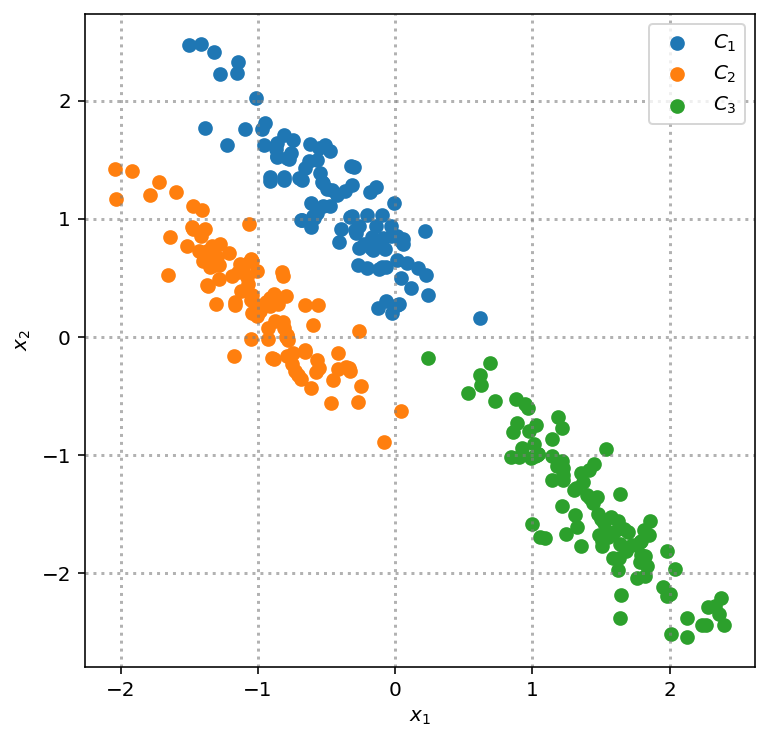

In [ ]:
XX, y_true = make_blobs(n_samples=300, centers=3,
                       cluster_std=0.60, random_state=0)

rng = np.random.RandomState(13)
X_stretched = np.dot(XX, rng.randn(2, 2))

X_stretched -= np.mean(X_stretched,0)

fig, ax = plt.subplots(1,1,figsize=(6, 6))
ax.scatter(X_stretched[y_true==0, 0], X_stretched[y_true==0, 1],  s=40, label='$C_1$')
ax.scatter(X_stretched[y_true==1, 0], X_stretched[y_true==1, 1],  s=40, label='$C_2$')
ax.scatter(X_stretched[y_true==2, 0], X_stretched[y_true==2, 1],  s=40, label='$C_3$')
ax.set_xlabel('$x_1$')
ax.set_ylabel('$x_2$')
ax.grid(b=True, which='major', color='gray', alpha=0.6, linestyle='dotted', lw=1.5)
_=ax.legend()


The code in the following cell fits a Linear Discriminant Analysis and draws each of the 3 scores in the 2D reduced space. These  *scores* can be retrieved using the method `decision_function`

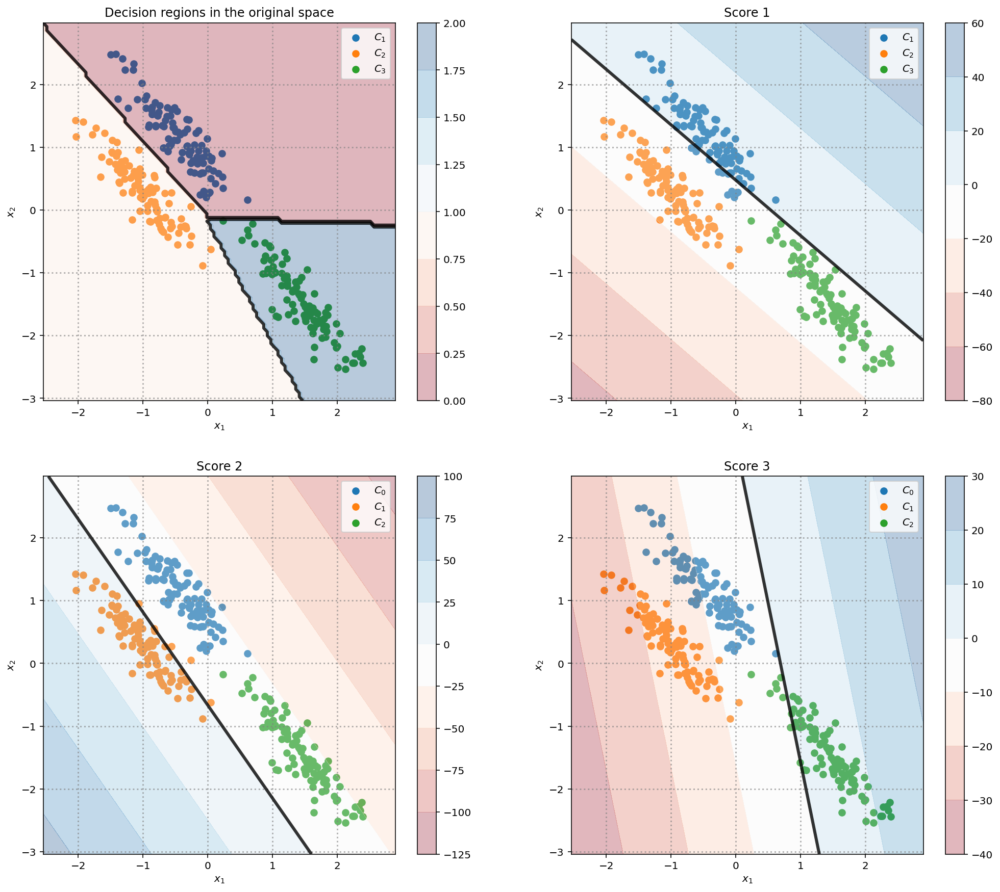

In [ ]:
clf = LinearDiscriminantAnalysis()
clf.fit(X_stretched, y_true)


cm = plt.cm.RdBu
cm_bright = ListedColormap(['#FF0000', '#0000FF'])

fig, aa = plt.subplots(2,2,figsize=(17, 15))
ax = aa[0][0]
ax.scatter(X_stretched[y_true==0, 0], X_stretched[y_true==0, 1],  s=40, label='$C_1$')
ax.scatter(X_stretched[y_true==1, 0], X_stretched[y_true==1, 1],  s=40, label='$C_2$')
ax.scatter(X_stretched[y_true==2, 0], X_stretched[y_true==2, 1],  s=40, label='$C_3$')
ax.set_xlabel('$x_1$')
ax.set_xlabel('$x_1$')
ax.set_ylabel('$x_2$')
ax.grid(b=True, which='major', color='gray', alpha=0.6, linestyle='dotted', lw=1.5)
_=ax.legend()

h=100
x_min, x_max = X_stretched[:, 0].min() - .5, X_stretched[:, 0].max() + .5
y_min, y_max = X_stretched[:, 1].min() - .5, X_stretched[:, 1].max() + .5
xx, yy = np.meshgrid(np.linspace(x_min, x_max, h),
                        np.linspace(y_min, y_max, h))
Zz = clf.decision_function(np.c_[xx.ravel(), yy.ravel()])
Z = np.argmax(Zz,1)
        # Put the result into a color plot
Z = Z.reshape(xx.shape)
cc=ax.contourf(xx, yy, Z, cmap=cm, alpha=.3)
fig.colorbar(cc, ax=ax)
_=ax.contour(xx, yy, Z, [0,1],  alpha=.8, colors='black',linewidths=3)

_ = ax.set_title('Decision regions in the original space')


ax = aa[0][1]
ax.scatter(X_stretched[y_true==0, 0], X_stretched[y_true==0, 1],  s=40, label='$C_1$')
ax.scatter(X_stretched[y_true==1, 0], X_stretched[y_true==1, 1],  s=40, label='$C_2$')
ax.scatter(X_stretched[y_true==2, 0], X_stretched[y_true==2, 1],  s=40, label='$C_3$')
ax.set_xlabel('$x_1$')
ax.set_xlabel('$x_1$')
ax.set_ylabel('$x_2$')
ax.grid(b=True, which='major', color='gray', alpha=0.6, linestyle='dotted', lw=1.5)
_=ax.legend()

# Score to decide for the first class
Z = Zz[:,0]
        # Put the result into a color plot
Z = Z.reshape(xx.shape)
cc=ax.contourf(xx, yy, Z, cmap=cm, alpha=.3)
fig.colorbar(cc, ax=ax)
_=ax.contour(xx, yy, Z, [0],  alpha=.8, colors='black',linewidths=3)

_ = ax.set_title('Score 1')

ax = aa[1][0]
ax.scatter(X_stretched[y_true==0, 0], X_stretched[y_true==0, 1],  s=40, label='$C_0$')
ax.scatter(X_stretched[y_true==1, 0], X_stretched[y_true==1, 1],  s=40, label='$C_1$')
ax.scatter(X_stretched[y_true==2, 0], X_stretched[y_true==2, 1],  s=40, label='$C_2$')
ax.set_xlabel('$x_1$')
ax.set_xlabel('$x_1$')
ax.set_ylabel('$x_2$')
ax.grid(b=True, which='major', color='gray', alpha=0.6, linestyle='dotted', lw=1.5)
_=ax.legend()

# Score to decide for the second class
Z = Zz[:,1]
        # Put the result into a color plot
Z = Z.reshape(xx.shape)
cc=ax.contourf(xx, yy, Z, cmap=cm, alpha=.3)
fig.colorbar(cc, ax=ax)
_=ax.contour(xx, yy, Z, [0],  alpha=.8, colors='black',linewidths=3)
_ = ax.set_title('Score 2')

ax = aa[1][1]
ax.scatter(X_stretched[y_true==0, 0], X_stretched[y_true==0, 1],  s=40, label='$C_0$')
ax.scatter(X_stretched[y_true==1, 0], X_stretched[y_true==1, 1],  s=40, label='$C_1$')
ax.scatter(X_stretched[y_true==2, 0], X_stretched[y_true==2, 1],  s=40, label='$C_2$')
ax.set_xlabel('$x_1$')
ax.set_xlabel('$x_1$')
ax.set_ylabel('$x_2$')
ax.grid(b=True, which='major', color='gray', alpha=0.6, linestyle='dotted', lw=1.5)
_=ax.legend()

# Score to decide for the third class
Z = Zz[:,2]
        # Put the result into a color plot
Z = Z.reshape(xx.shape)
cc=ax.contourf(xx, yy, Z, cmap=cm, alpha=.3)
fig.colorbar(cc, ax=ax)
_=ax.contour(xx, yy, Z, [0],  alpha=.8, colors='black',linewidths=3)
_ = ax.set_title('Score 3')


The next plot shows the observations in the reduced space

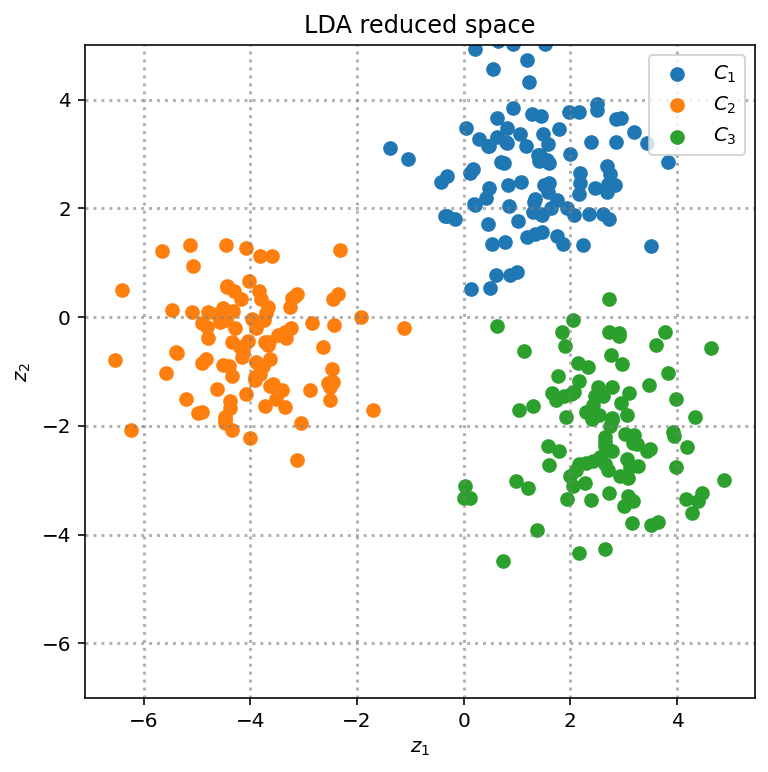

In [ ]:
fig, ax = plt.subplots(1,1,figsize=(6, 6))
Z_lda = clf.transform(X_stretched) 
ax.scatter(Z_lda[y_true==0, 0], Z_lda[y_true==0, 1],  s=40, label='$C_1$')
ax.scatter(Z_lda[y_true==1, 0], Z_lda[y_true==1, 1],  s=40, label='$C_2$')
ax.scatter(Z_lda[y_true==2, 0], Z_lda[y_true==2, 1],  s=40, label='$C_3$')
ax.set_xlabel('$z_1$')
ax.set_ylabel('$z_2$')
ax.grid(b=True, which='major', color='gray', alpha=0.6, linestyle='dotted', lw=1.5)
_ = ax.legend()
_ = ax.set_title('LDA reduced space')
_ = ax.set_ylim(-7,5)

For comparison, the next plot shows the reduced space proposed by PCA. Notice how the dimensionality reduction made by LDA is focused on class separability while the one by PCA is focused on the reconstruction of the data.

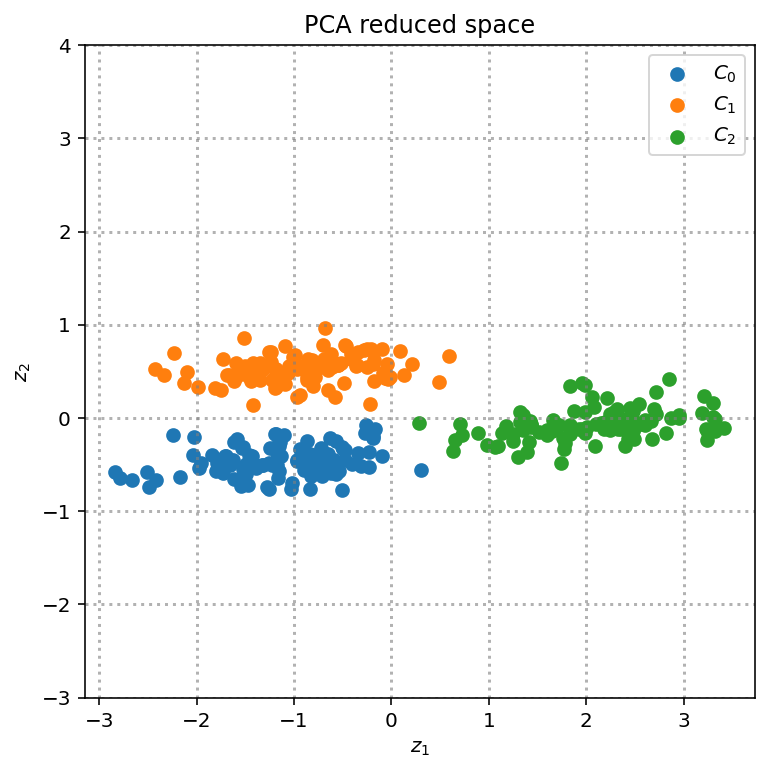

In [ ]:
fig, ax = plt.subplots(1,1,figsize=(6, 6))
Z_pca = PCA(n_components=2).fit_transform(X_stretched) 
ax.scatter(Z_pca[y_true==0, 0], Z_pca[y_true==0, 1],  s=40, label='$C_0$')
ax.scatter(Z_pca[y_true==1, 0], Z_pca[y_true==1, 1],  s=40, label='$C_1$')
ax.scatter(Z_pca[y_true==2, 0], Z_pca[y_true==2, 1],  s=40, label='$C_2$')
ax.set_xlabel('$z_1$')
ax.set_ylabel('$z_2$')
ax.grid(b=True, which='major', color='gray', alpha=0.6, linestyle='dotted', lw=1.5)
_ = ax.legend()
_ = ax.set_ylim(-3,4)
_ = ax.set_title('PCA reduced space')

###  Fisher classifier in the digits dataset

Separate digits 5, 6 and 1 with the Linear Discriminant Analysis.

First use a classifier consisting in a PCA with 2 components followed by a Linear classification in this reduced space

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:26: UserWarning: No contour levels were found within the data range.


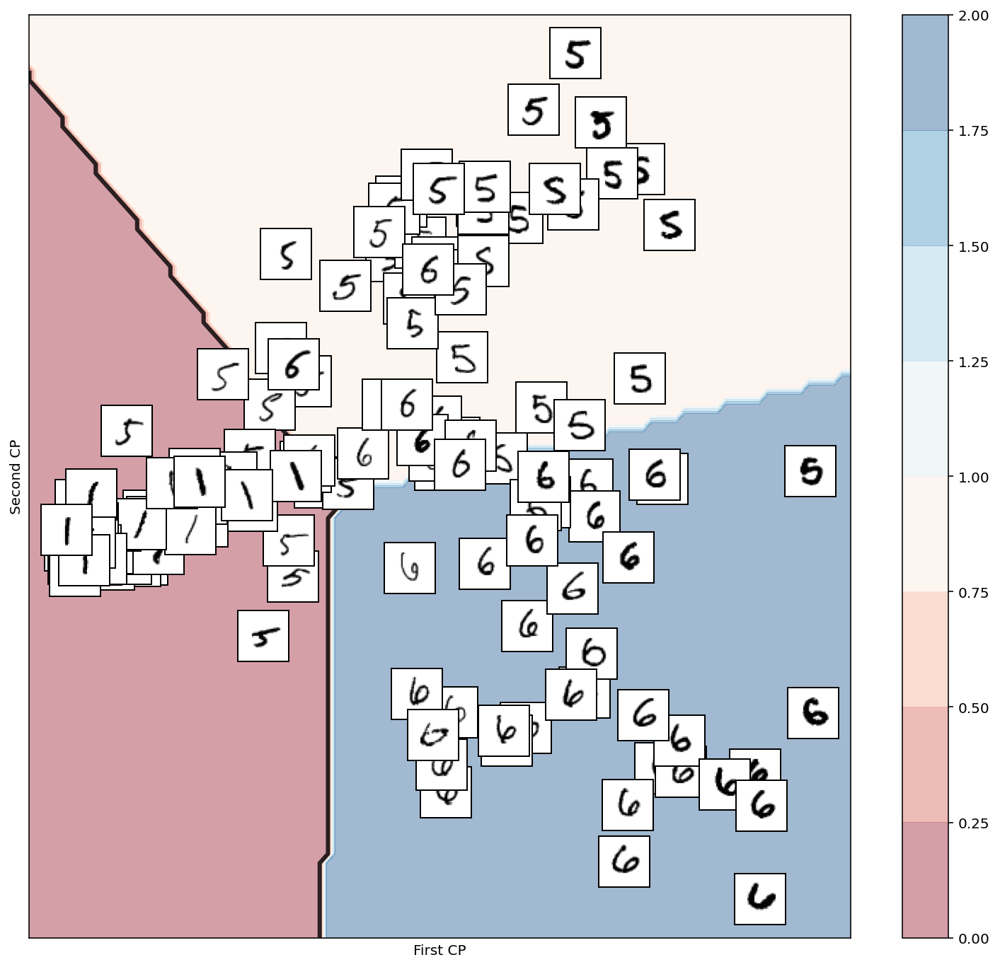

In [ ]:
############
# YOUR CODE
############

X_561 = np.vstack((X[fives[:50],:],X[six[:50],:], X[ones[:50],:]))
Y_561 = np.ones((X_561.shape[0]))
Y_561[:50] = 5
Y_561[51:100] = 6

ff,ax = plt.subplots(1,1,figsize=(13,12))
pca_561 = PCA(n_components=2)
Z_561=pca_even.fit_transform(X_561)
plot_embedding(ax,Z_561,X_561)

lda_pca_561 = LinearDiscriminantAnalysis()
lda_pca_561.fit(Z_561,Y_561)
h=100
x_min, x_max = Z_561[:,0].min() - .5, Z_561[:,0].max() + .5
y_min, y_max = Z_561[:,1].min() - .5, Z_561[:,1].max() + .5
xx, yy = np.meshgrid(np.linspace(x_min, x_max, h), np.linspace(y_min,y_max,h))
ZZ = lda_pca_561.decision_function(np.c_[xx.ravel(), yy.ravel()])
Z = np.argmax(ZZ,1)
Z = Z.reshape(xx.shape)
cc=ax.contourf(xx, yy, Z, cmap=cm, alpha=.4)
fig.colorbar(cc, ax=ax)
_=ax.contour(xx, yy, Z, [0],  alpha=.8, colors='black',linewidths=3)

Now the  Fisher discriminant directly over the original data in  $28\times 28$ dimensions. Notice this problem with 3 classes is solved in 2 dimensions by LDA

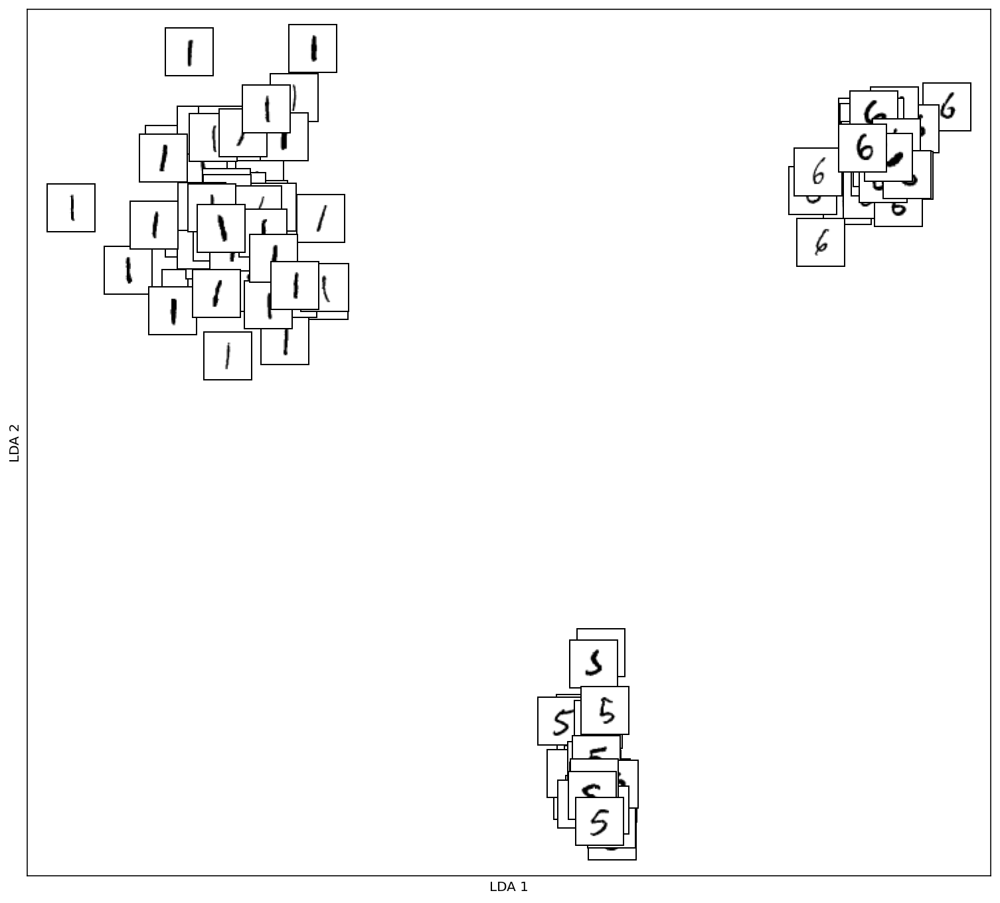

In [ ]:
############
# YOUR CODE
############

lda_561 = LinearDiscriminantAnalysis()
lda_561.fit(X_561, Y_561)
U_561 = lda_561.transform(X_561)
ff,aa = plt.subplots(1,1,figsize = (13,12))
plot_embedding(aa,U_561, X_561, xlabel = 'LDA 1', ylabel = 'LDA 2')

Now the Fisher discriminant in the original problem with 10 classes, plotting the first 2 componentes of the 9 produced by LDA.

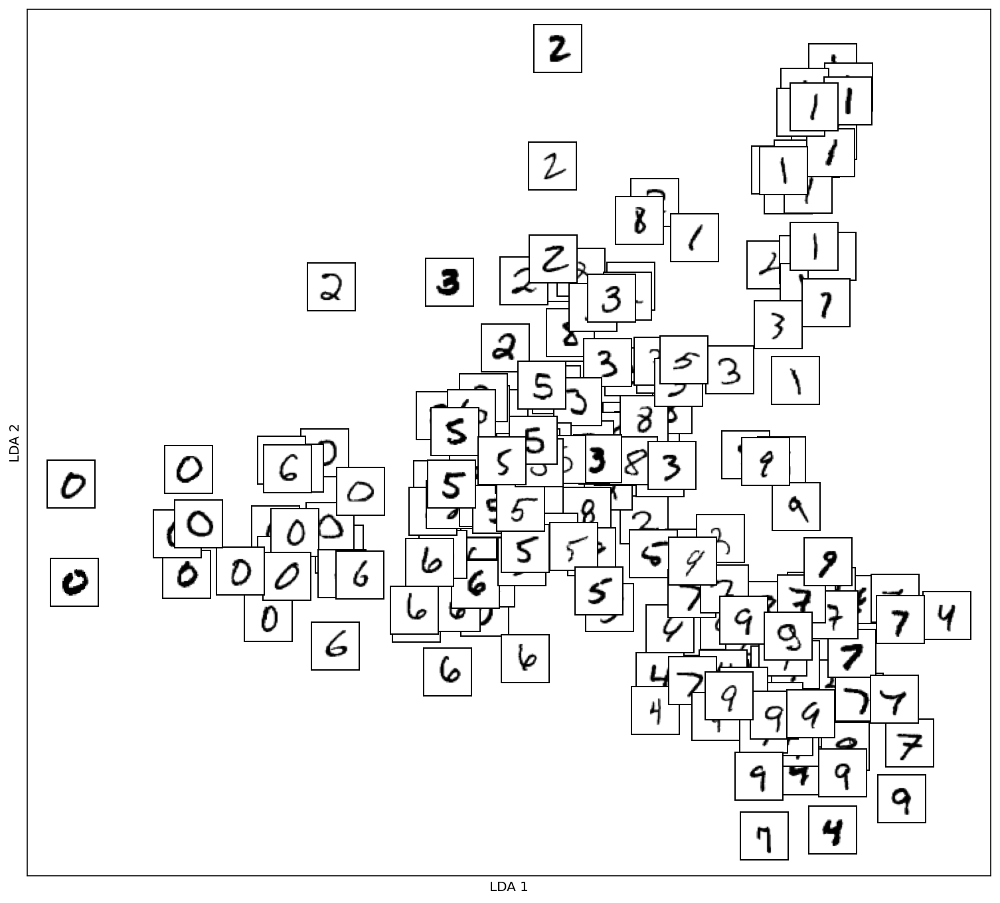

In [ ]:
############
# YOUR CODE
############

lda_10 = LinearDiscriminantAnalysis()
lda_10.fit(X,Y)
U_10 = lda_10.transform(Xeven)[:,:2]
ff,aa = plt.subplots(1,1,figsize = (13,12))
plot_embedding(aa,U_10, Xeven, xlabel = 'LDA 1', ylabel = 'LDA 2')

In [ ]:
print('Separability achieved by the Fisher classifier {0:.2f}%'.format(100*lda_10.score(X,Y)))

Separability achieved by the Fisher classifier 90.19%


# 4. Kernel Fisher Discriminant

We review with KLDA the toy problems that were previously analyzed with KPCA

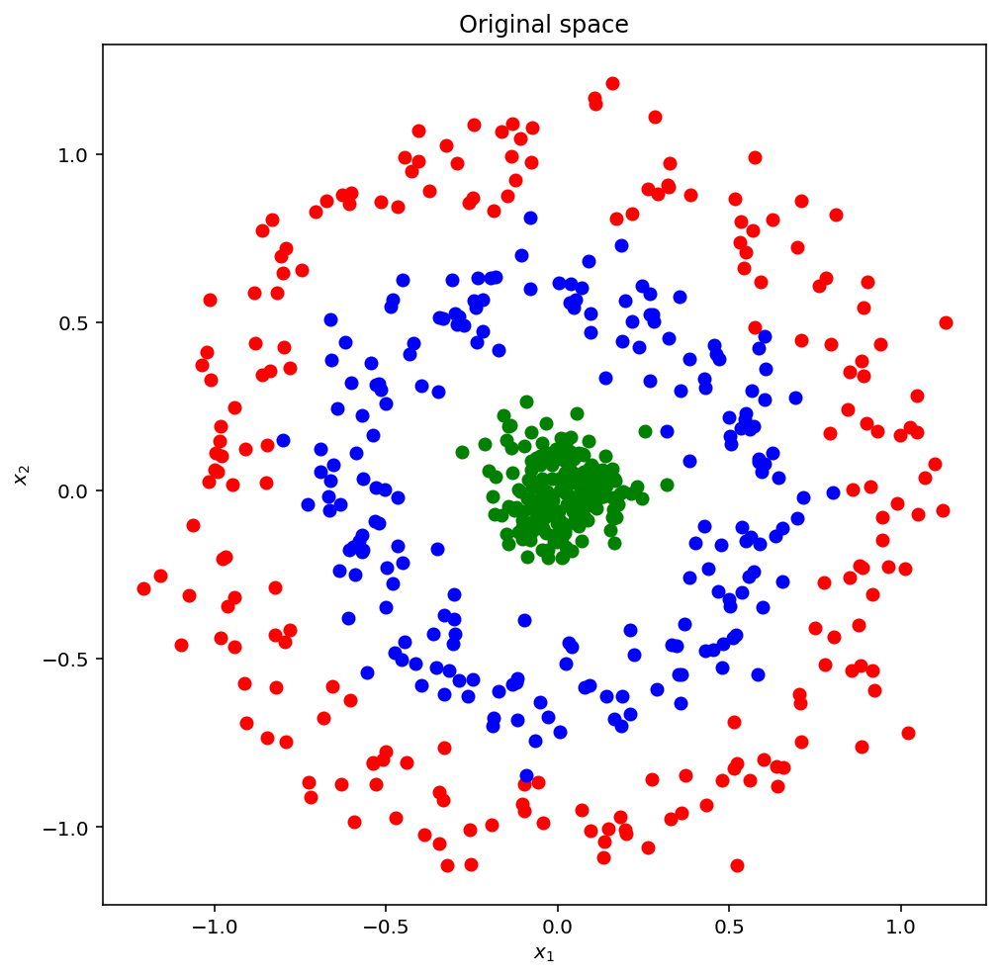

In [ ]:
from sklearn.datasets import make_circles, make_moons

np.random.seed(0)
Xcc, Ycc = make_circles(n_samples=400, factor=.6, noise=.1)

X_c2 = 0.1*np.random.randn(200,2)
Y_c2 = 2*np.ones((200,))

Xcir= np.vstack([Xcc,X_c2])
Ycir= np.hstack([Ycc,Y_c2])

plt.figure(figsize=(8,8))
plt.title("Original space")
reds = Ycir == 0
blues = Ycir == 1
green = Ycir == 2

plt.plot(Xcir[reds, 0], Xcir[reds, 1], "ro")
plt.plot(Xcir[blues, 0], Xcir[blues, 1], "bo")
plt.plot(Xcir[green, 0], Xcir[green, 1], "go")
plt.xlabel("$x_1$")
plt.ylabel("$x_2$")
plt.show()


In [ ]:
from sklearn.metrics.pairwise import rbf_kernel, polynomial_kernel
import scipy

There is no implementation of the kernel Fisher Discriminant, so I have coded up this function to implement that algorithm.

In [ ]:
def  KDA(Xcir, Ycir, kernel='rbf', gamma = 5, degree=3):
    N = Xcir.shape[0]
    if kernel=='poly':
        K = polynomial_kernel(Xcir,  degree=degree)
    else:
        K = rbf_kernel(Xcir, gamma=gamma)
    H = np.empty((3,N))
    for clase in range(3):
        H[clase,:] = np.mean(K[Ycir==clase,:],0)
    h = np.mean(K,0)
    Sb = np.zeros((N,N))
    Sw = np.zeros((N,N))
    for clase in range(3):
        Hh = H[clase,:] -h
        nc = np.sum(Ycir==clase)
        Sb += nc *np.outer(Hh, Hh.T)
        Km = K[Ycir==clase,:] - np.outer(np.ones(nc),H[clase,:])
        for gg in range(nc):
            Sw += np.outer(Km[gg,:].T, Km[gg,:])

    autovalores, autovectores = scipy.linalg.eigh(Sb, Sw+1e-6*np.eye(N))
    B = autovectores[:,-2:].T
    Z = K.dot(B.T)
    return B, Z

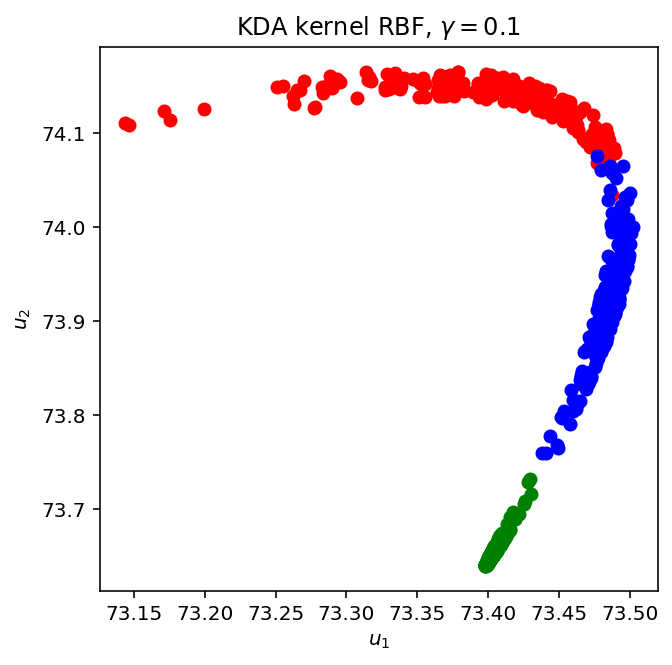

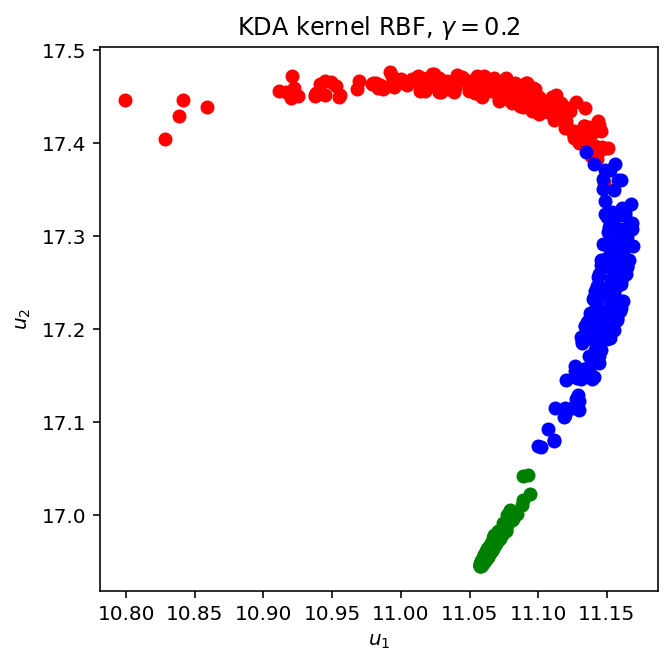

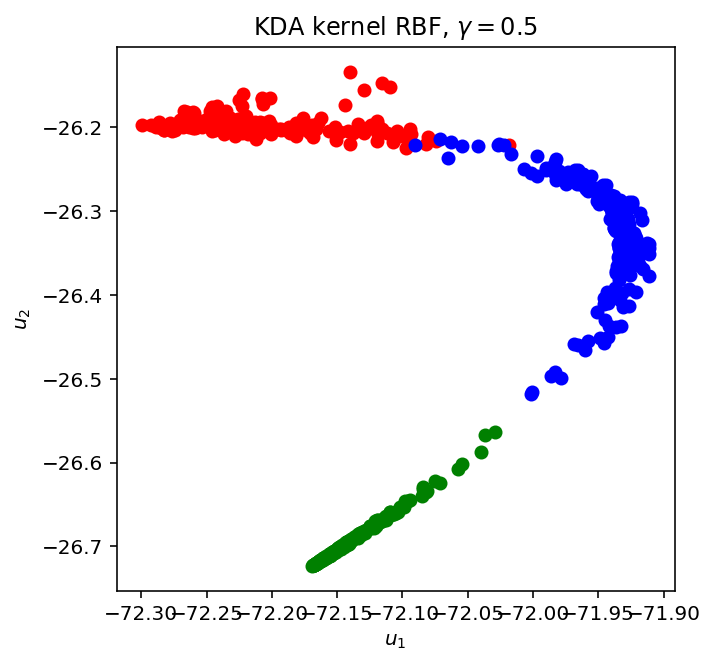

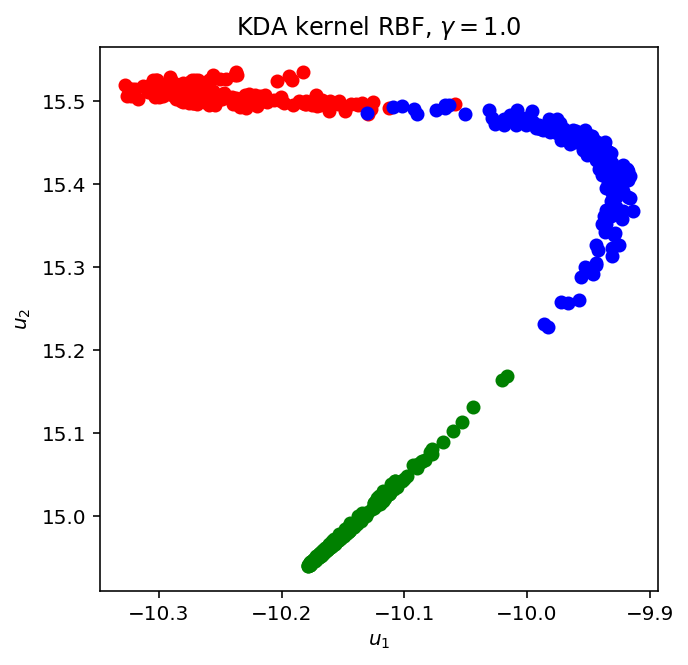

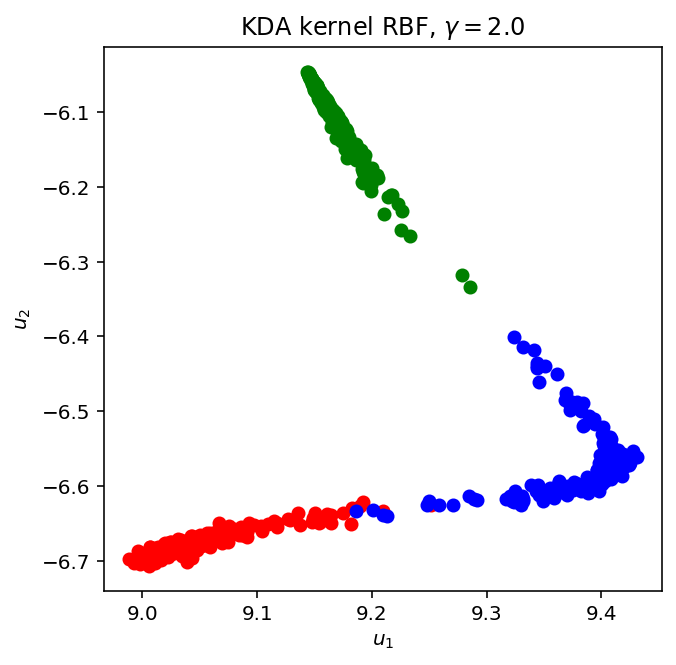

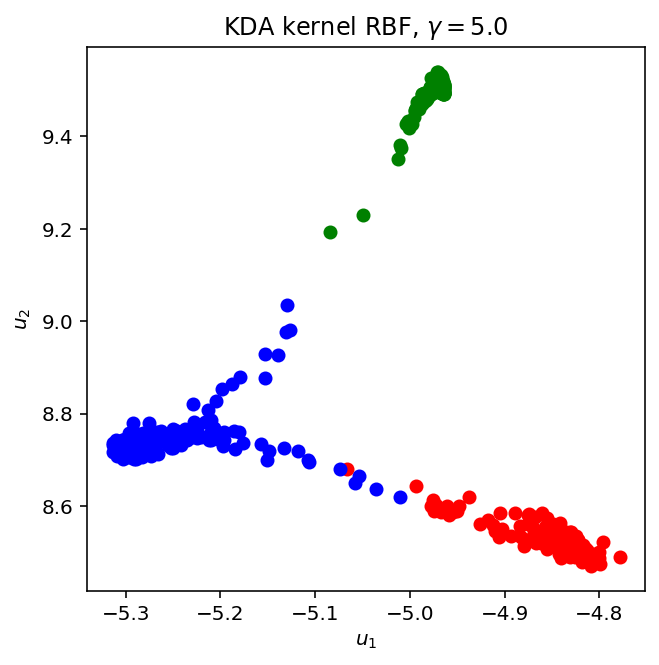

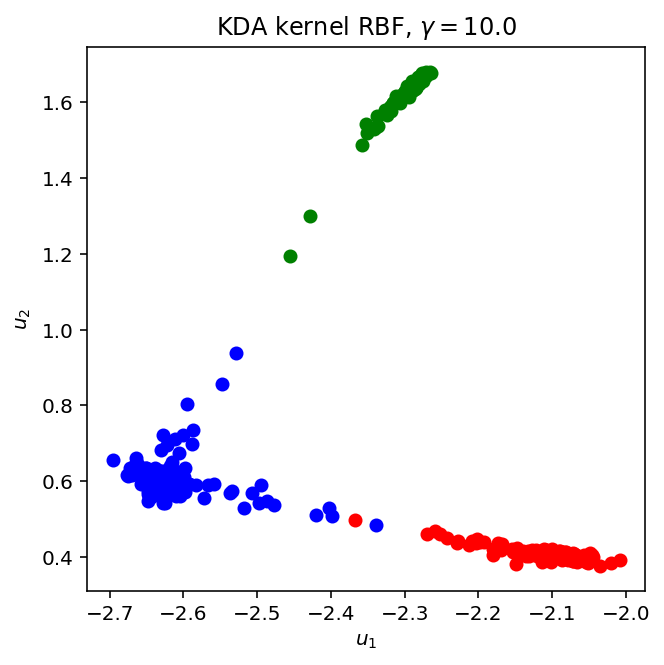

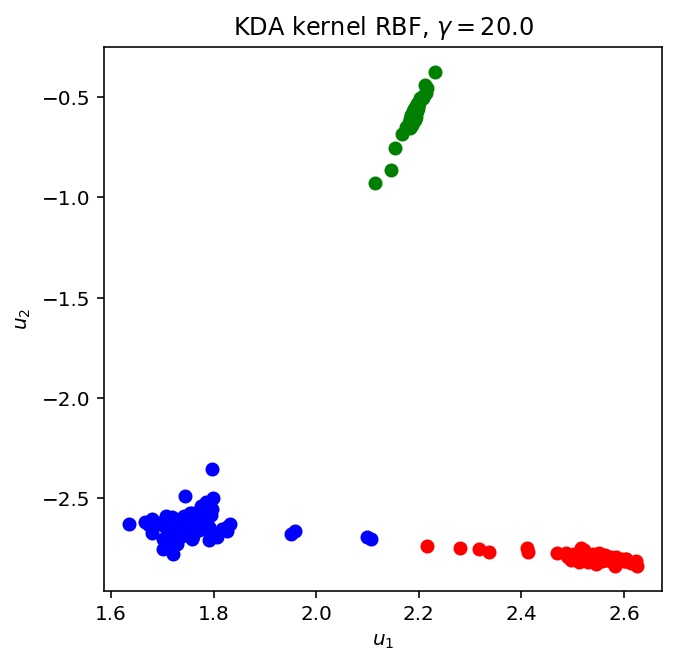

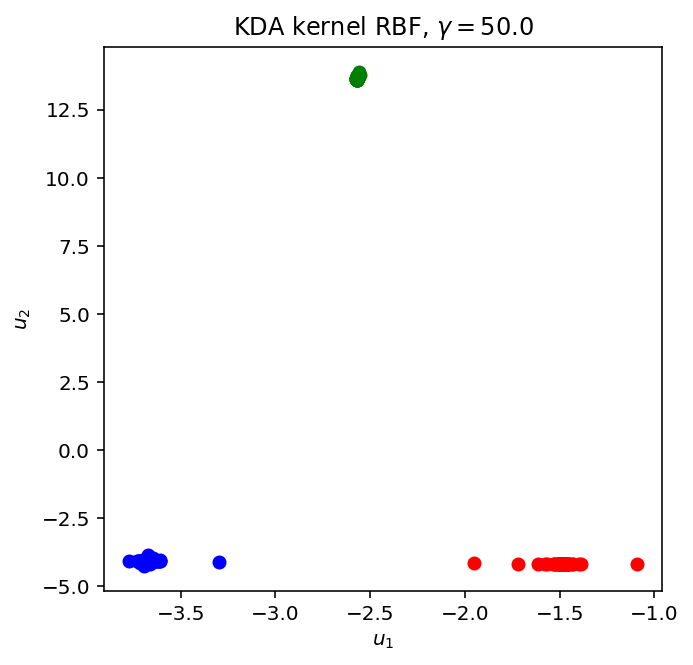

In [ ]:
for gamma_value in [.1,.2,.5,1,2,5,10,20,50]:
    B,Pk_ = KDA(Xcir, Ycir, gamma = gamma_value)
    plt.figure(figsize=(5,5))
    plt.plot(Pk_[reds, 0], Pk_[reds, 1], "ro")
    plt.plot(Pk_[blues, 0], Pk_[blues, 1], "bo")
    plt.plot(Pk_[green, 0], Pk_[green, 1], "go")
    plt.xlabel("$u_1$")
    plt.ylabel("$u_2$")
    plt.title('KDA kernel RBF, $\gamma={0:.1f}$'.format(gamma_value))
    plt.show()

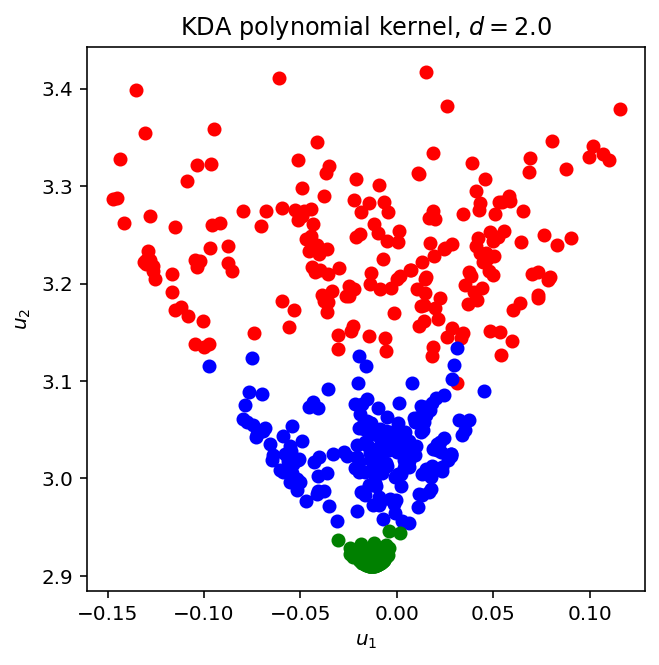

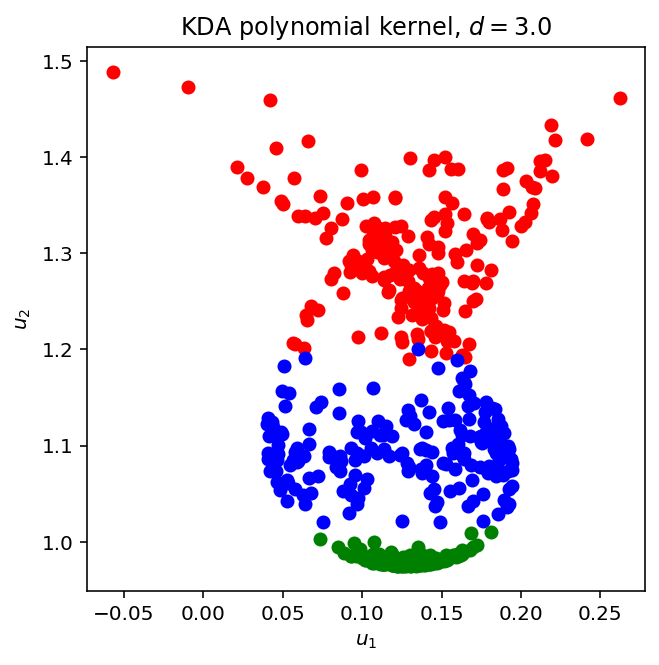

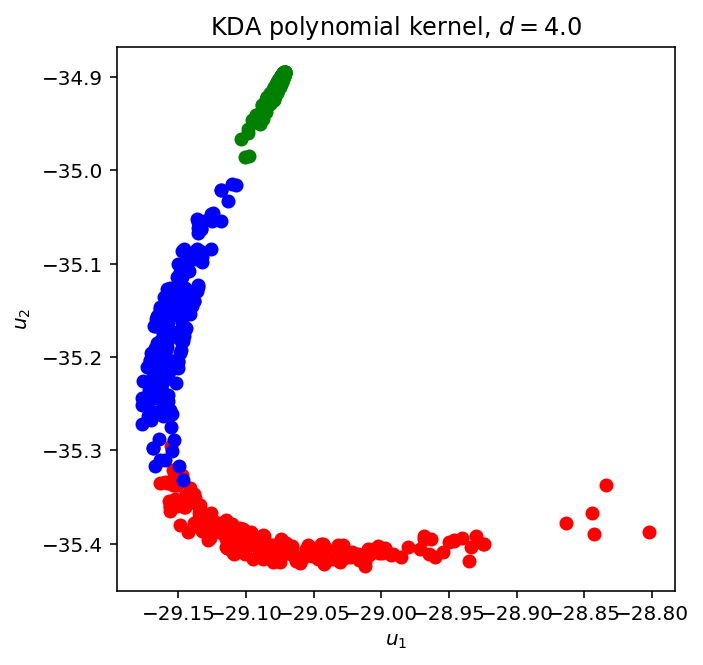

In [ ]:
for d_value in [2,3,4]:
    B,Pk_ = KDA(Xcir, Ycir, degree = d_value,kernel='poly')
    plt.figure(figsize=(5,5))
    plt.plot(Pk_[reds, 0], Pk_[reds, 1], "ro")
    plt.plot(Pk_[blues, 0], Pk_[blues, 1], "bo")
    plt.plot(Pk_[green, 0], Pk_[green, 1], "go")
    plt.xlabel("$u_1$")
    plt.ylabel("$u_2$")
    plt.title('KDA polynomial kernel, $d={0:.1f}$'.format(d_value))
    plt.show()

# 5. CCA: *Canonical Correlation Analysis* 

We are working in the example of the sales persons study presented in the lecture.

Certain company has conducted a study among its sales teams in order to study which factors influenced the most in their sales performances. For every sales person they measured 3 scores that summarised this person’s performance last year:
- Increase in sales w.r.t. last year
- Rentability of sales
- New customer accounts


In addition, the company conducted some tests to assess the following skills in the sales persons:
- Creativity
- Mechanical reasoning
- Abstract reasoning
- Maths


The goal of this analysis is to summarise in few scores the influence of each skill in the performance of the members of the team

In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler

In [ ]:
# load file with data
X = np.loadtxt('sales.txt')
sc = StandardScaler()
Xs = sc.fit_transform(X)

We create dataframes to store both sets of variables

In [ ]:
sales = pd.DataFrame(X, columns=['V1', 'V2', 'V3', 'T1', 'T2', 'T3', 'T4'])
sales_s = pd.DataFrame(Xs, columns=['V1', 'V2', 'V3', 'T1', 'T2', 'T3', 'T4'])

In [ ]:
sales.head()

,V1,V2,V3,T1,T2,T3,T4
0,93.0,96.0,97.8,9.0,12.0,9.0,20.0
1,88.8,91.8,96.8,7.0,10.0,10.0,15.0
2,95.0,100.3,99.0,8.0,12.0,9.0,26.0
3,101.3,103.8,106.8,13.0,14.0,12.0,29.0
4,102.0,107.8,103.0,10.0,15.0,12.0,32.0


In [ ]:
sales.describe()

,V1,V2,V3,T1,T2,T3,T4
count,50.000000,50.000000,50.000000,50.000000,50.00000,50.000000,50.000000
mean,98.836000,106.622000,102.810000,11.220000,14.18000,10.560000,29.760000
std,7.337345,10.124315,4.712218,3.950149,3.38478,2.139617,10.537707
min,81.500000,87.300000,94.300000,1.000000,5.00000,5.000000,9.000000
25%,93.550000,99.500000,99.075000,8.250000,12.00000,9.000000,21.500000
50%,100.650000,106.250000,103.150000,10.000000,15.00000,11.000000,31.500000
75%,105.050000,114.750000,106.450000,14.000000,17.00000,12.000000,37.000000
max,110.800000,122.300000,115.300000,18.000000,20.00000,15.000000,51.000000


In [ ]:
sales_s.head()

,V1,V2,V3,T1,T2,T3,T4
0,-0.803458,-1.059809,-1.073988,-0.567710,-0.650598,-0.736505,-0.935601
1,-1.381684,-1.478864,-1.288356,-1.079160,-1.247478,-0.264386,-1.414905
2,-0.528113,-0.630777,-0.816745,-0.823435,-0.650598,-0.736505,-0.360436
3,0.339226,-0.281565,0.855332,0.455191,-0.053719,0.679851,-0.072854
4,0.435597,0.117535,0.040730,-0.311985,0.244721,0.679851,0.214728


In [ ]:
V = sales_s.loc[:,['V1','V2','V3']].values
T = sales_s.loc[:,['T1','T2','T3','T4']].values

First we will analyze if there are relationships between the variables in both sets by constructing regression models that attempt to predict the values in the sales performance scores with the skills scores. Write code that computes the regression of each column of `V` with each colum of `T` to check the relationships among the two sets of variables.

In [ ]:
############
# YOUR CODE
############

for ii in range(3):
  lr = LinearRegression().fit(T,V[:,ii])
  print('variable V{0:d}, R^2={1:.2f}'.format(ii+1,lr.score(T,V[:,ii])))
  print('bias term {0:.2f}'.format(lr.intercept_))
  for jj in range(4):
    print('variable T{0:d}, weight={1:.2f}'.format(jj+1, lr.coef_[jj]))
  print("")

variable V1, R^2=0.96
bias term -0.00
variable T1, weight=0.19
variable T2, weight=0.14
variable T3, weight=0.23
variable T4, weight=0.64

variable V2, R^2=0.97
bias term -0.00
variable T1, weight=0.05
variable T2, weight=0.29
variable T3, weight=-0.12
variable T4, weight=0.83

variable V3, R^2=0.93
bias term -0.00
variable T1, weight=0.48
variable T2, weight=-0.06
variable T3, weight=0.30
variable T4, weight=0.52



### CCA analysis

The class [CCA](https://scikit-learn.org/stable/modules/generated/sklearn.cross_decomposition.CCA.html) implements the  *Canonical Correlation Analysis* in *scikit learn*. Learn a CCA with 3 components using the skills variables as inputs and the sales performance variables as targets. Create arrays `Tx` and `Vy` with the transformation of the original variables into the components found by CCA

In [ ]:
############
# YOUR CODE
############

from sklearn.cross_decomposition import CCA

cca = CCA(n_components=3).fit(T,V)
Tx, Vy = cca.transform(T,V)

The next figures show the correlations between the components determined by CCA for each set of variables.

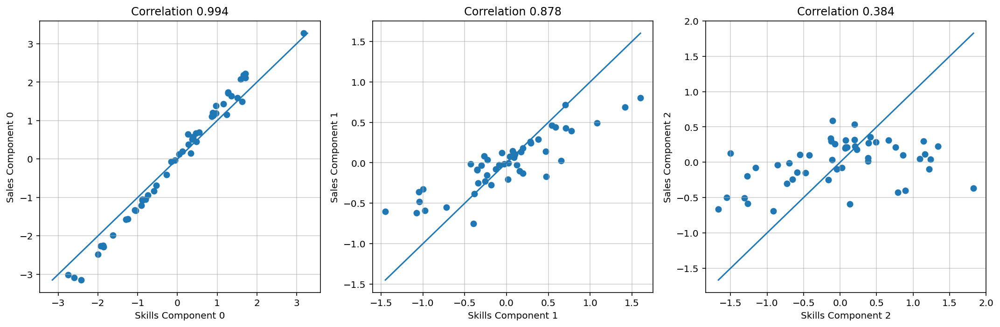

In [ ]:
ff,aa = plt.subplots(1,3, figsize=(15,5))
for ii  in range(3):
    aa[ii].scatter(Tx[:,ii], Vy[:,ii])
    aa[ii].set_xlabel('Skills Component {0:d}'.format(ii))
    aa[ii].set_ylabel('Sales Component {0:d}'.format(ii))
    aa[ii].plot([np.min(np.hstack((Tx[:,ii], Vy[:,ii]))), np.max(np.hstack((Tx[:,ii], Vy[:,ii])))],
               [np.min(np.hstack((Tx[:,ii], Vy[:,ii]))), np.max(np.hstack((Tx[:,ii], Vy[:,ii])))])
    aa[ii].set_title('Correlation {0:.3f}'.format(np.corrcoef(Tx[:,ii], Vy[:,ii])[0,1]))
    aa[ii].grid(alpha=0.6)
ff.tight_layout()

The fact that we have access to both projections $\mathbf w$ and $\mathbf v$ enables to use a common subspace into which we can map those objects for which se we only have one of the views.

For instance, if the company hires a new employee with the followig competences profil
- Creativity: 15
- Mechanical reasonong: 6
- Abstract reasoning: 12
- Maths: 23

We can build on CCA to predict which would be her sales performance scores

In [ ]:


xt = np.array([15., 6., 12., 23.])

# quick&dirty hack to scale xt
xtt = np.hstack((np.zeros(3), xt)).reshape(1,-1)
xt_s = sc.transform(xtt)[:,3:]


Vt = cca.predict(xt_s)

In [ ]:
Vt

array([[-1.09889257, -2.24398453,  2.00732587]])

Text(0.5, 0, 'Score sales 0')

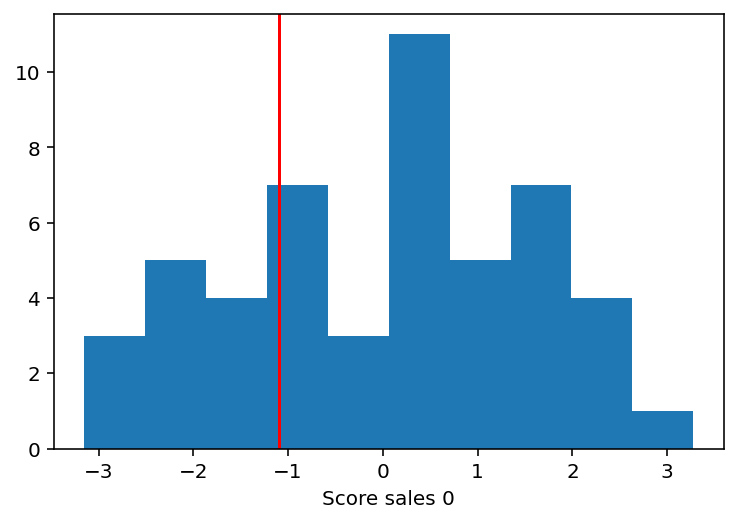

In [ ]:
ff,aa = plt.subplots(1,1, figsize=(6,4))
aa.hist(Vy[:,0],10)
aa.axvline(x=Vt[0,0], color='red')
aa.set_xlabel('Score sales {0:d}'.format(0))

# 6. One class SVM

We prepare a novelty detection case in which the inliers are the dark points (regard those points as historical data). Then the yellow points arrive and your task is to decide to what extent the yellow points follow the distribution of the dark points.

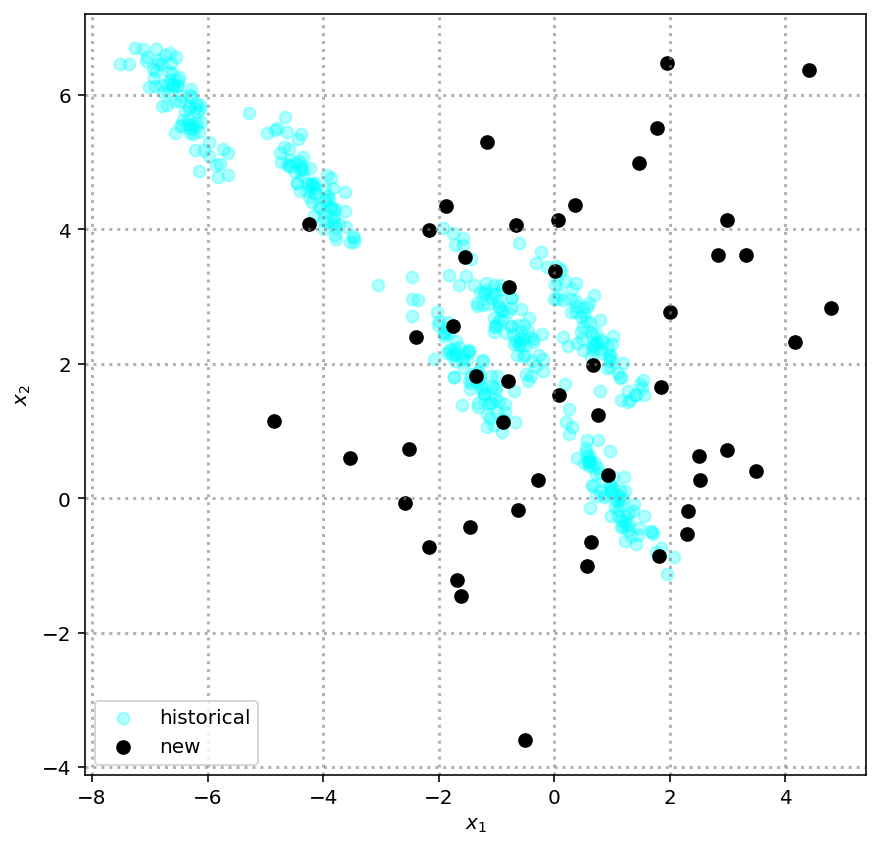

In [ ]:
from sklearn.datasets import make_blobs
# Generate synthetic data
X, y_true = make_blobs(n_samples=450, centers=6,
                       cluster_std=0.60, random_state=0)

rng = np.random.RandomState(13)
X_historical = np.dot(X, rng.randn(2, 2))

# Add new data (outliers??)
center_new = np.array([0,2]).reshape([1,-1])
X_new,_ = make_blobs(n_samples=50,centers=center_new, cluster_std=2,random_state=123)



fig, ax = plt.subplots(figsize=(7, 7))
ax.scatter(X_historical[:, 0], X_historical[:, 1], color='cyan', alpha=0.3, label='historical')
ax.set_xlabel('$x_1$')
ax.set_ylabel('$x_2$')
ax.grid(b=True, which='major', color='gray', alpha=0.6, linestyle='dotted', lw=1.5)

ax.scatter(X_new[:, 0], X_new[:, 1], color='black', s=40, label='new')
_=ax.legend()

The scikit learn class [OneClassSVM](https://scikit-learn.org/stable/modules/generated/sklearn.svm.OneClassSVM.html) implements the One Class Support Vector Machine. The key parameter in this implementation is `nu`, a lower bound on the proportion of support vectors in the training set. Its value must be in $(0,1]$, the closer to 1, the more likely points are outliers.

In [ ]:
from sklearn.svm import OneClassSVM  

Fit a `OneClassSVM` with the historical data. By default the kernel RBF is the one selected. Parameter `gamma` can be set to `'scale'` to get it estimated by sklearn. We can play with `nu` and `gamma` to set the smoothness of the detector.

In [ ]:
###########
# YOUR CODE  
###########

nu = 0.3
ocsvm = OneClassSVM(gamma=0.01, nu=nu).fit(X_historical)
yhat_test = ocsvm.predict(X_new)
np.mean(yhat_test==1)

0.48

Evaluate the OCSVM with the new data and show a scatter plot with the outliers in red and the inliers in green. Add a contour plot to show the decision boundary of the novelty detector (use the method `decision_function` of class `OneClassSVM` for this purpose).

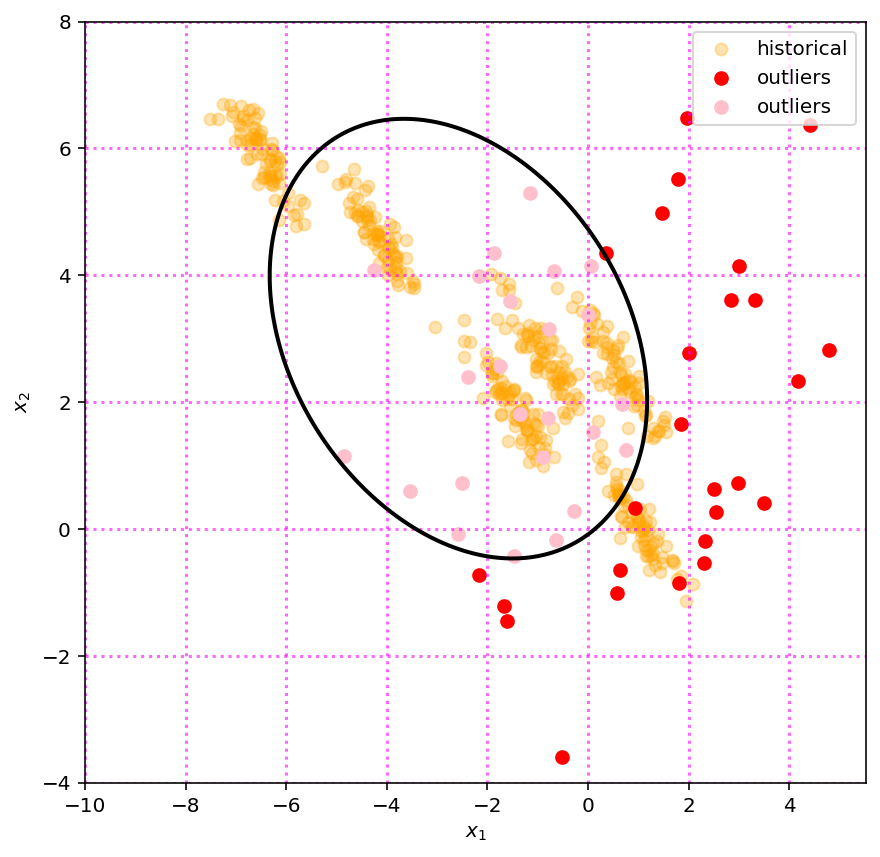

In [ ]:
###########
# YOUR CODE
###########

fig, ax = plt.subplots(figsize=(7,7))
ax.scatter(X_historical[:,0], X_historical[:,1], color='orange', alpha=0.3, label='historical')
ax.set_xlabel('$x_1$')
ax.set_ylabel('$x_2$')
ax.grid(b=True, which='major', color='magenta', alpha=0.6, linestyle='dotted', lw=1.5)

ax.scatter(X_new[yhat_test==-1, 0], X_new[yhat_test==-1,1], color='red', s=40, label='outliers')
ax.scatter(X_new[yhat_test==1, 0], X_new[yhat_test==1,1], color='pink', s=40, label='outliers')

intervals = 200
x = np.linspace(-10,4,intervals)
y = np.linspace(-4,8,intervals)
X,Y = np.meshgrid(x,y)
xys = np.vstack([X.ravel(), Y.ravel()]).T
y_grid = ocsvm.decision_function(xys)
y_grid = y_grid.reshape([intervals,intervals])

ax.contour(X, Y, y_grid, levels = [0], linewidths = 2, colors = 'black')
_=ax.legend()

